In [2]:
import os
import gc
import uuid
import glob
import h5py
import pickle
import itertools
from tqdm import tqdm
from itertools import combinations
from joblib import Parallel, delayed

import scipy
import nistats
import numpy as np
import pandas as pd
import argparse
import scipy.stats as st
import pingouin as pg
from scipy import stats
from scipy.stats import norm
import statsmodels.api as sm 
from sklearn import manifold
from scipy.special import erf
from scipy.stats import spearmanr
from scipy.optimize import curve_fit
from statsmodels.formula.api import ols
from statsmodels.stats.multitest import fdrcorrection
from sklearn.decomposition import PCA, FastICA
from sklearn.neighbors import kneighbors_graph
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LinearRegression
from sklearn.manifold import LocallyLinearEmbedding
from statsmodels.stats.multitest import multipletests
from nistats.second_level_model import SecondLevelModel
from sklearn.cluster import AgglomerativeClustering, KMeans

%matplotlib inline
import matplotlib
import seaborn as sns
import matplotlib.cm as cmx
from matplotlib import colors
import matplotlib.pyplot as plt
import matplotlib.ticker as ticker
from matplotlib.lines import Line2D
import matplotlib.colors as mcolors
import matplotlib.patches as mpatches
from mpl_toolkits.mplot3d import Axes3D
from matplotlib.colorbar import ColorbarBase
from matplotlib.colorbar import ColorbarBase, make_axes
from mpl_toolkits.axes_grid1.inset_locator import inset_axes

import nibabel as nib
import nilearn
from nilearn.image import load_img, mean_img, index_img, threshold_img, math_img, smooth_img, new_img_like
from nilearn.input_data import NiftiMapsMasker, NiftiMasker, NiftiLabelsMasker, NiftiSpheresMasker
from nilearn.plotting.img_plotting import _get_colorbar_and_data_ranges
from nistats.second_level_model import SecondLevelModel
from nistats.thresholding import map_threshold
from nilearn._utils.niimg import _safe_get_data
from nilearn import plotting
from nilearn import datasets
from nilearn.surface import vol_to_surf

import utils
import reporting
from logger import Logger
from linguistics_info import *

#### Variables ####
language = 'english'

PROJECT_PATH = f"/Volumes/unicog/protocols/IRMf/LePetitPrince_Pallier_2018/LePetitPrince/"
OUTPUT_PATH = f"/Volumes/unicog/protocols/IRMf/LePetitPrince_Pallier_2018/LePetitPrince/derivatives/fMRI/maps/{language}"
INPUT_PATH = f"/Volumes/unicog/protocols/IRMf/LePetitPrince_Pallier_2018/LePetitPrince/data/stimuli-representations/{language}"
FMRIDATA_PATH = f"/Volumes/unicog/protocols/IRMf/LePetitPrince_Pallier_2018/LePetitPrince/data/fMRI/{language}"
MASKER_PATH = f"/Volumes/unicog/protocols/IRMf/LePetitPrince_Pallier_2018/LePetitPrince/derivatives/fMRI/ROI_masks/global_masker_95%_{language}"
#ALL_MASKS_PATH = f"/Volumes/unicog/protocols/IRMf/LePetitPrince_Pallier_2018/LePetitPrince/derivatives/fMRI/ROI_masks/"
DILATED_MASKER_PATH = f"/Users/alexpsq/Code/data/LePetitPrince/dilated_global_masker_95%_{language}"
ALL_MASKS_PATH = f"/Users/alexpsq/Code/data/LePetitPrince/"
SAVING_FOLDER = f"/Volumes/unicog/protocols/IRMf/LePetitPrince_Pallier_2018/LePetitPrince/derivatives/fMRI/clustering/{language}"
TMP_FOLDER = f"/home/ap259944/tmp"

logger = Logger(os.path.join('/Users/alexpsq/Desktop', 'logs.txt'))

plot_coords = [
    [-48, 15, -27],
    [-54, -12, -12],
    [-51, -39, 3],
    [-39, -57, 18],
    [-45, 33, -6],
    [-51, 21, 21],
    [-42, 10, 22],
    [-35, -10, 65],
    [-61, -33, -6],
    [-17, 30, 61],
    [-43, 20, 49],
    [-7, 0, 50],
    [-23, 31, 48],
    [-64, -42, 38],
    [56, -41, 14],
    [-26, -97, 5],
    [-61, -11, -6],
    [56, -41, -14],
    [61, -22, -6],
    [-61, -33, -7],
    [-17, 30, 61],
    [-43, 20, 49],
    [-7, 0, 50],
    [-64, -42, 38],
    [-4, 46, 12],
    [4, 0, 47],
]

In [3]:
occipital = ['17Networks_LH_VisCent_ExStr_1','17Networks_LH_VisCent_ExStr_2','17Networks_LH_VisCent_ExStr_3','17Networks_LH_VisCent_ExStr_4','17Networks_LH_VisCent_ExStr_5','17Networks_LH_VisCent_ExStr_6','17Networks_LH_VisCent_Striate_1','17Networks_LH_VisCent_ExStr_7','17Networks_LH_VisCent_ExStr_8','17Networks_LH_VisCent_ExStr_9','17Networks_LH_VisCent_ExStr_10','17Networks_LH_VisCent_ExStr_11','17Networks_LH_VisPeri_ExStrInf_1','17Networks_LH_VisPeri_ExStrInf_2','17Networks_LH_VisPeri_ExStrInf_3','17Networks_LH_VisPeri_ExStrInf_4','17Networks_LH_VisPeri_ExStrInf_5','17Networks_LH_VisPeri_StriCal_1','17Networks_LH_VisPeri_StriCal_2','17Networks_LH_VisPeri_ExStrSup_1','17Networks_LH_VisPeri_ExStrSup_2','17Networks_LH_VisPeri_ExStrSup_3','17Networks_LH_VisPeri_ExStrSup_4','17Networks_LH_VisPeri_ExStrSup_5','17Networks_RH_VisCent_ExStr_1','17Networks_RH_VisCent_ExStr_2','17Networks_RH_VisCent_ExStr_3','17Networks_RH_VisCent_ExStr_4','17Networks_RH_VisCent_ExStr_5','17Networks_RH_VisCent_ExStr_6','17Networks_RH_VisCent_Striate_1','17Networks_RH_VisCent_ExStr_7','17Networks_RH_VisCent_ExStr_8','17Networks_RH_VisCent_ExStr_9','17Networks_RH_VisCent_ExStr_10','17Networks_RH_VisCent_ExStr_11','17Networks_RH_VisPeri_ExStrInf_1','17Networks_RH_VisPeri_ExStrInf_2','17Networks_RH_VisPeri_ExStrInf_3','17Networks_RH_VisPeri_ExStrInf_4','17Networks_RH_VisPeri_ExStrInf_5','17Networks_RH_VisPeri_StriCal_1','17Networks_RH_VisPeri_StriCal_2','17Networks_RH_VisPeri_ExStrSup_1','17Networks_RH_VisPeri_ExStrSup_2','17Networks_RH_VisPeri_ExStrSup_3','17Networks_RH_VisPeri_ExStrSup_4']
motor = ['17Networks_LH_SomMotA_1','17Networks_LH_SomMotA_2','17Networks_LH_SomMotA_3','17Networks_LH_SomMotA_4','17Networks_LH_SomMotA_5','17Networks_LH_SomMotA_6','17Networks_LH_SomMotA_7','17Networks_LH_SomMotA_8','17Networks_LH_SomMotA_9','17Networks_LH_SomMotA_10','17Networks_LH_SomMotA_11','17Networks_LH_SomMotA_12','17Networks_LH_SomMotA_13','17Networks_LH_SomMotA_14','17Networks_LH_SomMotA_15','17Networks_LH_SomMotA_16','17Networks_LH_SomMotA_17','17Networks_LH_SomMotA_18','17Networks_LH_SomMotA_19','17Networks_LH_SomMotB_Aud_1','17Networks_LH_SomMotB_Aud_2','17Networks_LH_SomMotB_Ins_1','17Networks_LH_SomMotB_S2_1','17Networks_LH_SomMotB_S2_2','17Networks_LH_SomMotB_Aud_3','17Networks_LH_SomMotB_Aud_4','17Networks_LH_SomMotB_S2_3','17Networks_LH_SomMotB_S2_4','17Networks_LH_SomMotB_S2_5','17Networks_LH_SomMotB_S2_6','17Networks_LH_SomMotB_Cent_1','17Networks_LH_SomMotB_Cent_2','17Networks_LH_SomMotB_Cent_3','17Networks_LH_SomMotB_Cent_4','17Networks_LH_SomMotB_Cent_5','17Networks_RH_SomMotA_1','17Networks_RH_SomMotA_2','17Networks_RH_SomMotA_3','17Networks_RH_SomMotA_4','17Networks_RH_SomMotA_5','17Networks_RH_SomMotA_6','17Networks_RH_SomMotA_7','17Networks_RH_SomMotA_8','17Networks_RH_SomMotA_9','17Networks_RH_SomMotA_10','17Networks_RH_SomMotA_11','17Networks_RH_SomMotA_12','17Networks_RH_SomMotA_13','17Networks_RH_SomMotA_14','17Networks_RH_SomMotA_15','17Networks_RH_SomMotA_16','17Networks_RH_SomMotA_17','17Networks_RH_SomMotA_18','17Networks_RH_SomMotA_19','17Networks_RH_SomMotA_20','17Networks_RH_SomMotB_Aud_1','17Networks_RH_SomMotB_Aud_2','17Networks_RH_SomMotB_Ins_1','17Networks_RH_SomMotB_S2_1','17Networks_RH_SomMotB_S2_2','17Networks_RH_SomMotB_Aud_3','17Networks_RH_SomMotB_S2_3','17Networks_RH_SomMotB_S2_4','17Networks_RH_SomMotB_S2_5','17Networks_RH_SomMotB_S2_6','17Networks_RH_SomMotB_S2_7','17Networks_RH_SomMotB_S2_8','17Networks_RH_SomMotB_Cent_1','17Networks_RH_SomMotB_Cent_2','17Networks_RH_SomMotB_Cent_3',]
dorso_attention = ['17Networks_LH_DorsAttnA_TempOcc_1','17Networks_LH_DorsAttnA_TempOcc_2','17Networks_LH_DorsAttnA_TempOcc_3','17Networks_LH_DorsAttnA_TempOcc_4','17Networks_LH_DorsAttnA_ParOcc_1','17Networks_LH_DorsAttnA_ParOcc_2','17Networks_LH_DorsAttnA_SPL_1','17Networks_LH_DorsAttnA_SPL_2','17Networks_LH_DorsAttnA_SPL_3','17Networks_LH_DorsAttnA_SPL_4','17Networks_LH_DorsAttnA_SPL_5','17Networks_LH_DorsAttnA_SPL_6','17Networks_LH_DorsAttnA_SPL_7','17Networks_LH_DorsAttnB_PostC_1','17Networks_LH_DorsAttnB_PostC_2','17Networks_LH_DorsAttnB_PostC_3','17Networks_LH_DorsAttnB_PostC_4','17Networks_LH_DorsAttnB_PostC_5','17Networks_LH_DorsAttnB_PostC_6','17Networks_LH_DorsAttnB_PostC_7','17Networks_LH_DorsAttnB_PostC_8','17Networks_LH_DorsAttnB_PostC_9','17Networks_LH_DorsAttnB_FEF_1','17Networks_LH_DorsAttnB_FEF_2','17Networks_LH_DorsAttnB_FEF_3','17Networks_LH_DorsAttnB_PrCv_1', '17Networks_RH_DorsAttnA_TempOcc_1','17Networks_RH_DorsAttnA_TempOcc_2','17Networks_RH_DorsAttnA_TempOcc_3','17Networks_RH_DorsAttnA_ParOcc_1','17Networks_RH_DorsAttnA_ParOcc_2','17Networks_RH_DorsAttnA_ParOcc_3','17Networks_RH_DorsAttnA_SPL_1','17Networks_RH_DorsAttnA_SPL_2','17Networks_RH_DorsAttnA_SPL_3','17Networks_RH_DorsAttnA_SPL_4','17Networks_RH_DorsAttnA_SPL_5','17Networks_RH_DorsAttnA_SPL_6','17Networks_RH_DorsAttnA_SPL_7','17Networks_RH_DorsAttnA_SPL_8','17Networks_RH_DorsAttnB_TempOcc_1','17Networks_RH_DorsAttnB_PostC_1','17Networks_RH_DorsAttnB_PostC_2','17Networks_RH_DorsAttnB_PostC_3','17Networks_RH_DorsAttnB_PostC_4','17Networks_RH_DorsAttnB_PostC_5','17Networks_RH_DorsAttnB_PostC_6','17Networks_RH_DorsAttnB_PostC_7','17Networks_RH_DorsAttnB_PostC_8','17Networks_RH_DorsAttnB_FEF_1','17Networks_RH_DorsAttnB_FEF_2','17Networks_RH_DorsAttnB_FEF_3']
sal_ventral_attention = ['17Networks_LH_SalVentAttnA_ParOper_1','17Networks_LH_SalVentAttnA_ParOper_2','17Networks_LH_SalVentAttnA_ParOper_3','17Networks_LH_SalVentAttnA_Ins_1','17Networks_LH_SalVentAttnA_Ins_2','17Networks_LH_SalVentAttnA_Ins_3','17Networks_LH_SalVentAttnA_Ins_4','17Networks_LH_SalVentAttnA_FrOper_1','17Networks_LH_SalVentAttnA_FrOper_2','17Networks_LH_SalVentAttnA_ParMed_1','17Networks_LH_SalVentAttnA_ParMed_2','17Networks_LH_SalVentAttnA_ParMed_3','17Networks_LH_SalVentAttnA_FrMed_1','17Networks_LH_SalVentAttnA_FrMed_2','17Networks_LH_SalVentAttnA_FrMed_3','17Networks_LH_SalVentAttnB_PFCl_1','17Networks_LH_SalVentAttnB_PFCl_2','17Networks_LH_SalVentAttnB_PFCl_3','17Networks_LH_SalVentAttnB_Ins_1','17Networks_LH_SalVentAttnB_Ins_2','17Networks_LH_SalVentAttnB_Ins_3','17Networks_LH_SalVentAttnB_OFC_1','17Networks_LH_SalVentAttnB_PFCmp_1','17Networks_RH_SalVentAttnA_ParOper_1','17Networks_RH_SalVentAttnA_ParOper_2','17Networks_RH_SalVentAttnA_ParOper_3','17Networks_RH_SalVentAttnA_PrC_1','17Networks_RH_SalVentAttnA_Ins_1','17Networks_RH_SalVentAttnA_Ins_2','17Networks_RH_SalVentAttnA_Ins_3','17Networks_RH_SalVentAttnA_Ins_4','17Networks_RH_SalVentAttnA_FrOper_1','17Networks_RH_SalVentAttnA_FrOper_2','17Networks_RH_SalVentAttnA_FrOper_3','17Networks_RH_SalVentAttnA_FrMed_1','17Networks_RH_SalVentAttnA_ParMed_1','17Networks_RH_SalVentAttnA_ParMed_2','17Networks_RH_SalVentAttnA_FrMed_2','17Networks_RH_SalVentAttnA_ParMed_3','17Networks_RH_SalVentAttnA_ParMed_4','17Networks_RH_SalVentAttnA_FrMed_3','17Networks_RH_SalVentAttnA_FrMed_4','17Networks_RH_SalVentAttnB_IPL_1','17Networks_RH_SalVentAttnB_PFClv_1','17Networks_RH_SalVentAttnB_PFCl_1','17Networks_RH_SalVentAttnB_PFCl_2','17Networks_RH_SalVentAttnB_PFCl_3','17Networks_RH_SalVentAttnB_Ins_1','17Networks_RH_SalVentAttnB_Ins_2','17Networks_RH_SalVentAttnB_PFCmp_1','17Networks_RH_SalVentAttnB_PFCmp_2']
limbic = [ '17Networks_LH_LimbicB_OFC_1','17Networks_LH_LimbicB_OFC_2','17Networks_LH_LimbicB_OFC_3','17Networks_LH_LimbicB_OFC_4','17Networks_LH_LimbicB_OFC_5','17Networks_LH_LimbicA_TempPole_1','17Networks_LH_LimbicA_TempPole_2','17Networks_LH_LimbicA_TempPole_3','17Networks_LH_LimbicA_TempPole_4','17Networks_LH_LimbicA_TempPole_5','17Networks_LH_LimbicA_TempPole_6','17Networks_LH_LimbicA_TempPole_7','17Networks_RH_LimbicB_OFC_1','17Networks_RH_LimbicB_OFC_2','17Networks_RH_LimbicB_OFC_3','17Networks_RH_LimbicB_OFC_4','17Networks_RH_LimbicB_OFC_5','17Networks_RH_LimbicB_OFC_6','17Networks_RH_LimbicA_TempPole_1','17Networks_RH_LimbicA_TempPole_2','17Networks_RH_LimbicA_TempPole_3','17Networks_RH_LimbicA_TempPole_4','17Networks_RH_LimbicA_TempPole_5','17Networks_RH_LimbicA_TempPole_6',]
cont = ['17Networks_LH_ContA_Temp_1','17Networks_LH_ContA_IPS_1','17Networks_LH_ContA_IPS_2','17Networks_LH_ContA_IPS_3','17Networks_LH_ContA_IPS_4','17Networks_LH_ContA_IPS_5','17Networks_LH_ContA_PFCd_1','17Networks_LH_ContA_PFClv_1','17Networks_LH_ContA_PFClv_2','17Networks_LH_ContA_PFCl_1','17Networks_LH_ContA_PFCl_2','17Networks_LH_ContA_PFCl_3','17Networks_LH_ContA_Cingm_1','17Networks_LH_ContB_Temp_1','17Networks_LH_ContB_Temp_2','17Networks_LH_ContB_IPL_1','17Networks_LH_ContB_IPL_2','17Networks_LH_ContB_IPL_3','17Networks_LH_ContB_PFCd_1','17Networks_LH_ContB_PFClv_1','17Networks_LH_ContB_PFClv_2','17Networks_LH_ContB_PFClv_3','17Networks_LH_ContB_PFCmp_1','17Networks_LH_ContC_pCun_1','17Networks_LH_ContC_pCun_2','17Networks_LH_ContC_pCun_3','17Networks_LH_ContC_Cingp_1','17Networks_LH_ContC_Cingp_2','17Networks_RH_ContA_IPS_1','17Networks_RH_ContA_IPS_2','17Networks_RH_ContA_IPS_3','17Networks_RH_ContA_IPS_4','17Networks_RH_ContA_PFCd_1','17Networks_RH_ContA_PFCl_1','17Networks_RH_ContA_PFCl_2','17Networks_RH_ContA_PFCl_3','17Networks_RH_ContA_PFCl_4','17Networks_RH_ContA_PFCl_5','17Networks_RH_ContA_Cingm_1','17Networks_RH_ContB_Temp_1','17Networks_RH_ContB_Temp_2','17Networks_RH_ContB_IPL_1','17Networks_RH_ContB_IPL_2','17Networks_RH_ContB_IPL_3','17Networks_RH_ContB_IPL_4','17Networks_RH_ContB_PFCld_1','17Networks_RH_ContB_PFCld_2','17Networks_RH_ContB_PFCld_3','17Networks_RH_ContB_PFCld_4','17Networks_RH_ContB_PFClv_1','17Networks_RH_ContB_PFClv_2','17Networks_RH_ContB_PFClv_3','17Networks_RH_ContB_PFClv_4','17Networks_RH_ContB_PFCmp_1','17Networks_RH_ContC_pCun_1','17Networks_RH_ContC_pCun_2','17Networks_RH_ContC_pCun_3','17Networks_RH_ContC_pCun_4','17Networks_RH_ContC_pCun_5','17Networks_RH_ContC_Cingp_1','17Networks_RH_ContC_Cingp_2',]
default_A = ['17Networks_LH_DefaultA_IPL_1','17Networks_LH_DefaultA_IPL_2','17Networks_LH_DefaultA_PFCd_1','17Networks_LH_DefaultA_PFCd_2','17Networks_LH_DefaultA_PFCd_3','17Networks_LH_DefaultA_pCunPCC_1','17Networks_LH_DefaultA_pCunPCC_2','17Networks_LH_DefaultA_pCunPCC_3','17Networks_LH_DefaultA_pCunPCC_4','17Networks_LH_DefaultA_pCunPCC_5','17Networks_LH_DefaultA_pCunPCC_6','17Networks_LH_DefaultA_pCunPCC_7','17Networks_LH_DefaultA_PFCm_1','17Networks_LH_DefaultA_PFCm_2','17Networks_LH_DefaultA_PFCm_3','17Networks_LH_DefaultA_PFCm_4','17Networks_LH_DefaultA_PFCm_5','17Networks_LH_DefaultA_PFCm_6','17Networks_RH_DefaultA_Temp_1','17Networks_RH_DefaultA_IPL_1','17Networks_RH_DefaultA_IPL_2','17Networks_RH_DefaultA_PFCd_1','17Networks_RH_DefaultA_PFCd_2','17Networks_RH_DefaultA_pCunPCC_1','17Networks_RH_DefaultA_pCunPCC_2','17Networks_RH_DefaultA_pCunPCC_3','17Networks_RH_DefaultA_pCunPCC_4','17Networks_RH_DefaultA_pCunPCC_5','17Networks_RH_DefaultA_PFCm_1','17Networks_RH_DefaultA_PFCm_2','17Networks_RH_DefaultA_PFCm_3','17Networks_RH_DefaultA_PFCm_4','17Networks_RH_DefaultA_PFCm_5',]
default_B = ['17Networks_LH_DefaultB_Temp_1','17Networks_LH_DefaultB_Temp_2','17Networks_LH_DefaultB_Temp_3','17Networks_LH_DefaultB_Temp_4','17Networks_LH_DefaultB_Temp_5','17Networks_LH_DefaultB_Temp_6','17Networks_LH_DefaultB_IPL_1','17Networks_LH_DefaultB_IPL_2','17Networks_LH_DefaultB_PFCd_1','17Networks_LH_DefaultB_PFCd_2','17Networks_LH_DefaultB_PFCd_3','17Networks_LH_DefaultB_PFCd_4','17Networks_LH_DefaultB_PFCd_5','17Networks_LH_DefaultB_PFCd_6','17Networks_LH_DefaultB_PFCl_1','17Networks_LH_DefaultB_PFCl_2','17Networks_LH_DefaultB_PFCv_1','17Networks_LH_DefaultB_PFCv_2','17Networks_LH_DefaultB_PFCv_3','17Networks_LH_DefaultB_PFCv_4','17Networks_LH_DefaultB_PFCv_5','17Networks_RH_DefaultA_PFCm_6','17Networks_RH_DefaultB_Temp_1','17Networks_RH_DefaultB_Temp_2','17Networks_RH_DefaultB_AntTemp_1','17Networks_RH_DefaultB_PFCd_1','17Networks_RH_DefaultB_PFCd_2','17Networks_RH_DefaultB_PFCd_3','17Networks_RH_DefaultB_PFCd_4','17Networks_RH_DefaultB_PFCd_5','17Networks_RH_DefaultB_PFCv_1','17Networks_RH_DefaultB_PFCv_2','17Networks_RH_DefaultB_PFCv_3',]
default_C = ['17Networks_LH_DefaultC_IPL_1','17Networks_LH_DefaultC_Rsp_1','17Networks_LH_DefaultC_Rsp_2','17Networks_LH_DefaultC_Rsp_3','17Networks_LH_DefaultC_PHC_1','17Networks_LH_DefaultC_PHC_2','17Networks_LH_DefaultC_PHC_3','17Networks_RH_DefaultC_IPL_1','17Networks_RH_DefaultC_IPL_2','17Networks_RH_DefaultC_Rsp_1','17Networks_RH_DefaultC_Rsp_2','17Networks_RH_DefaultC_PHC_1','17Networks_RH_DefaultC_PHC_2',]
temporoparietal = ['17Networks_LH_TempPar_1','17Networks_LH_TempPar_2','17Networks_LH_TempPar_3','17Networks_LH_TempPar_4','17Networks_LH_TempPar_5','17Networks_LH_TempPar_6','17Networks_RH_TempPar_1','17Networks_RH_TempPar_2','17Networks_RH_TempPar_3','17Networks_RH_TempPar_4','17Networks_RH_TempPar_5','17Networks_RH_TempPar_6','17Networks_RH_TempPar_7','17Networks_RH_TempPar_8','17Networks_RH_TempPar_9','17Networks_RH_TempPar_10']
                   
functional_networks = [occipital, motor, dorso_attention, sal_ventral_attention, limbic, cont, default_A, default_B, default_C, temporoparietal]



# ------------------------------------------------------------------------------

pre_post_central_RH = ['17Networks_RH_SomMotA_1','17Networks_RH_SomMotA_2','17Networks_RH_SomMotA_3','17Networks_RH_SomMotA_4','17Networks_RH_SomMotA_5','17Networks_RH_SomMotA_6','17Networks_RH_SomMotA_7','17Networks_RH_SomMotA_8','17Networks_RH_SomMotA_10','17Networks_RH_SomMotA_11','17Networks_RH_SomMotA_12','17Networks_RH_SomMotA_13','17Networks_RH_SomMotA_14','17Networks_RH_SomMotA_15','17Networks_RH_SomMotA_16','17Networks_RH_SomMotA_17','17Networks_RH_SomMotA_18','17Networks_RH_SomMotA_19','17Networks_RH_SomMotA_20','17Networks_RH_SomMotB_S2_1','17Networks_RH_SomMotB_S2_2','17Networks_RH_SomMotB_S2_3','17Networks_RH_SomMotB_S2_5','17Networks_RH_SomMotB_S2_6','17Networks_RH_SomMotB_S2_8','17Networks_RH_SomMotB_Cent_1','17Networks_RH_SomMotB_Cent_2','17Networks_RH_SomMotB_Cent_3','17Networks_RH_DorsAttnB_PostC_1','17Networks_RH_DorsAttnB_PostC_2','17Networks_RH_DorsAttnB_PostC_3','17Networks_RH_DorsAttnB_PostC_4','17Networks_RH_DorsAttnB_PostC_5','17Networks_RH_DorsAttnB_FEF_1','17Networks_RH_SalVentAttnA_PrC_1',]
superior_parietal_RH = ['17Networks_RH_DorsAttnA_SPL_1','17Networks_RH_DorsAttnA_SPL_2','17Networks_RH_DorsAttnA_SPL_3','17Networks_RH_DorsAttnA_SPL_4','17Networks_RH_DorsAttnA_SPL_5','17Networks_RH_DorsAttnA_SPL_6','17Networks_RH_DorsAttnA_SPL_7','17Networks_RH_DorsAttnA_SPL_8','17Networks_RH_DorsAttnB_PostC_7','17Networks_RH_DorsAttnB_PostC_8','17Networks_RH_ContA_IPS_4','17Networks_RH_SomMotA_9',]
inferior_parietal_RH = ['17Networks_RH_DorsAttnA_ParOcc_3','17Networks_RH_SalVentAttnA_ParOper_1','17Networks_RH_SalVentAttnA_ParOper_2','17Networks_RH_SalVentAttnA_ParOper_3','17Networks_RH_ContA_IPS_1','17Networks_RH_ContA_IPS_2','17Networks_RH_ContA_IPS_3','17Networks_RH_SalVentAttnB_IPL_1','17Networks_RH_ContB_IPL_1','17Networks_RH_ContB_IPL_2','17Networks_RH_ContB_IPL_3','17Networks_RH_ContB_IPL_4','17Networks_RH_DefaultA_IPL_1','17Networks_RH_DefaultA_IPL_2','17Networks_RH_DefaultC_IPL_1','17Networks_RH_DefaultC_IPL_2','17Networks_RH_SomMotB_S2_7',]
auditive_RH = [#'17Networks_RH_TempPar_4', '17Networks_RH_TempPar_8',
'17Networks_RH_SomMotB_Aud_1','17Networks_RH_SomMotB_Aud_2','17Networks_RH_SomMotB_Aud_3','17Networks_RH_SomMotB_S2_4',]
superior_temporal_RH = ['17Networks_RH_TempPar_1','17Networks_RH_TempPar_2','17Networks_RH_TempPar_3',
'17Networks_RH_TempPar_4', # auditory ?
'17Networks_RH_TempPar_8', # auditory ?
'17Networks_RH_TempPar_5','17Networks_RH_TempPar_6','17Networks_RH_TempPar_7','17Networks_RH_TempPar_8','17Networks_RH_TempPar_9','17Networks_RH_TempPar_10','17Networks_RH_LimbicA_TempPole_3',]
middle_temporal_RH = ['17Networks_RH_DefaultB_Temp_1','17Networks_RH_DefaultB_Temp_2','17Networks_RH_DefaultB_AntTemp_1','17Networks_RH_ContB_Temp_1','17Networks_RH_DefaultA_Temp_1','17Networks_RH_DorsAttnB_TempOcc_1','17Networks_RH_ContB_Temp_2','17Networks_RH_DorsAttnA_ParOcc_2',]
inferior_temporal_RH = ['17Networks_RH_DorsAttnA_TempOcc_1','17Networks_RH_DorsAttnA_TempOcc_2','17Networks_RH_DorsAttnA_TempOcc_3','17Networks_RH_LimbicA_TempPole_2','17Networks_RH_LimbicA_TempPole_6',]
occipital_RH = ['17Networks_RH_VisCent_ExStr_1','17Networks_RH_VisCent_ExStr_2','17Networks_RH_VisCent_ExStr_3','17Networks_RH_VisCent_ExStr_4','17Networks_RH_VisCent_ExStr_5','17Networks_RH_VisCent_ExStr_6','17Networks_RH_VisCent_Striate_1','17Networks_RH_VisCent_ExStr_7','17Networks_RH_VisCent_ExStr_8','17Networks_RH_VisCent_ExStr_9','17Networks_RH_VisCent_ExStr_10','17Networks_RH_VisCent_ExStr_11','17Networks_RH_VisPeri_ExStrInf_1','17Networks_RH_VisPeri_ExStrInf_2','17Networks_RH_VisPeri_ExStrInf_3','17Networks_RH_VisPeri_ExStrInf_4','17Networks_RH_VisPeri_ExStrInf_5','17Networks_RH_VisPeri_StriCal_1','17Networks_RH_VisPeri_StriCal_2','17Networks_RH_VisPeri_ExStrSup_1','17Networks_RH_VisPeri_ExStrSup_2','17Networks_RH_VisPeri_ExStrSup_3','17Networks_RH_VisPeri_ExStrSup_4','17Networks_RH_DorsAttnA_ParOcc_1',]
inferior_frontal_RH = ['17Networks_RH_SalVentAttnA_Ins_1','17Networks_RH_SalVentAttnA_Ins_2','17Networks_RH_SalVentAttnA_Ins_3','17Networks_RH_SalVentAttnA_Ins_4','17Networks_RH_SalVentAttnA_FrOper_1','17Networks_RH_SalVentAttnA_FrOper_2','17Networks_RH_SalVentAttnA_FrOper_3','17Networks_RH_SalVentAttnB_PFClv_1','17Networks_RH_SalVentAttnB_Ins_1','17Networks_RH_SalVentAttnB_Ins_2','17Networks_RH_LimbicB_OFC_2','17Networks_RH_LimbicB_OFC_4','17Networks_RH_ContB_PFClv_1','17Networks_RH_DefaultB_PFCv_1','17Networks_RH_DefaultB_PFCv_2','17Networks_RH_DefaultB_PFCv_3', '17Networks_RH_SomMotB_Ins_1',]
middle_frontal_RH = ['17Networks_RH_SalVentAttnB_PFCl_1','17Networks_RH_ContA_PFCl_1','17Networks_RH_ContA_PFCl_2','17Networks_RH_ContA_PFCl_3','17Networks_RH_ContA_PFCl_4','17Networks_RH_ContA_PFCl_5','17Networks_RH_ContB_PFCld_1','17Networks_RH_ContB_PFCld_2','17Networks_RH_ContB_PFCld_3','17Networks_RH_ContB_PFCld_4','17Networks_RH_ContB_PFClv_2','17Networks_RH_ContB_PFClv_3',]
superior_frontal_RH = ['17Networks_RH_SalVentAttnB_PFCl_2','17Networks_RH_SalVentAttnB_PFCl_3','17Networks_RH_ContA_PFCd_1','17Networks_RH_ContB_PFClv_4','17Networks_RH_DefaultA_PFCd_1','17Networks_RH_DefaultA_PFCd_2','17Networks_RH_DefaultA_PFCm_5','17Networks_RH_DefaultB_PFCd_2','17Networks_RH_DefaultB_PFCd_4','17Networks_RH_DorsAttnB_FEF_2','17Networks_RH_DorsAttnB_FEF_3',]
medial_precuneus_RH = ['17Networks_RH_ContC_pCun_1','17Networks_RH_ContC_pCun_2','17Networks_RH_ContC_pCun_3','17Networks_RH_ContC_pCun_4','17Networks_RH_ContC_pCun_5','17Networks_RH_DefaultA_pCunPCC_2','17Networks_RH_DefaultA_pCunPCC_5','17Networks_RH_SalVentAttnA_ParMed_3','17Networks_RH_SalVentAttnA_ParMed_1', '17Networks_RH_SalVentAttnA_ParMed_2', '17Networks_RH_SalVentAttnA_ParMed_4','17Networks_RH_DorsAttnB_PostC_6',]
medial_temporal_RH = ['17Networks_RH_LimbicA_TempPole_1','17Networks_RH_LimbicA_TempPole_4','17Networks_RH_LimbicA_TempPole_5','17Networks_RH_DefaultC_PHC_1','17Networks_RH_DefaultC_PHC_2',]
medial_cingulate_RH = ['17Networks_RH_ContC_Cingp_1','17Networks_RH_ContC_Cingp_2','17Networks_RH_ContA_Cingm_1','17Networks_RH_DefaultA_pCunPCC_1','17Networks_RH_DefaultA_pCunPCC_3','17Networks_RH_DefaultA_pCunPCC_4','17Networks_RH_SalVentAttnB_PFCmp_2','17Networks_RH_DefaultA_PFCm_3','17Networks_RH_DefaultA_PFCm_6','17Networks_RH_DefaultC_Rsp_1','17Networks_RH_DefaultC_Rsp_2','17Networks_RH_SalVentAttnB_PFCmp_1',]
medial_inferior_frontal_RH = ['17Networks_RH_LimbicB_OFC_1','17Networks_RH_LimbicB_OFC_3','17Networks_RH_LimbicB_OFC_5','17Networks_RH_LimbicB_OFC_6','17Networks_RH_DefaultA_PFCm_1','17Networks_RH_DefaultA_PFCm_2','17Networks_RH_DefaultA_PFCm_4',]
medial_superior_frontal_RH = ['17Networks_RH_SalVentAttnA_FrMed_3','17Networks_RH_SalVentAttnA_FrMed_4','17Networks_RH_SalVentAttnA_FrMed_2','17Networks_RH_ContB_PFCmp_1','17Networks_RH_DefaultB_PFCd_1','17Networks_RH_DefaultB_PFCd_3','17Networks_RH_DefaultB_PFCd_5','17Networks_RH_SalVentAttnA_FrMed_1',]

# --------------------------------------------------------------------------------

pre_post_central_LH = ['17Networks_LH_SomMotA_1','17Networks_LH_SomMotA_2','17Networks_LH_SomMotA_3','17Networks_LH_SomMotA_4','17Networks_LH_SomMotA_5','17Networks_LH_SomMotA_6','17Networks_LH_SomMotA_7','17Networks_LH_SomMotA_8','17Networks_LH_SomMotA_9','17Networks_LH_SomMotA_10','17Networks_LH_SomMotA_11','17Networks_LH_SomMotA_12','17Networks_LH_SomMotA_13','17Networks_LH_SomMotA_14','17Networks_LH_SomMotA_15','17Networks_LH_SomMotA_16','17Networks_LH_SomMotA_17','17Networks_LH_SomMotA_18','17Networks_LH_SomMotA_19','17Networks_LH_SomMotB_S2_1','17Networks_LH_SomMotB_S2_2','17Networks_LH_SomMotB_S2_3','17Networks_LH_SomMotB_S2_4','17Networks_LH_SomMotB_S2_5','17Networks_LH_SomMotB_S2_6','17Networks_LH_SomMotB_Cent_1','17Networks_LH_SomMotB_Cent_2','17Networks_LH_SomMotB_Cent_3','17Networks_LH_SomMotB_Cent_4','17Networks_LH_SomMotB_Cent_5','17Networks_LH_DorsAttnB_PostC_1','17Networks_LH_DorsAttnB_PostC_2','17Networks_LH_DorsAttnB_PostC_3','17Networks_LH_DorsAttnB_PostC_4','17Networks_LH_DorsAttnB_PostC_5','17Networks_LH_DorsAttnB_FEF_1','17Networks_LH_DorsAttnB_PrCv_1',]
superior_parietal_LH = ['17Networks_LH_DorsAttnA_SPL_1','17Networks_LH_DorsAttnA_SPL_2','17Networks_LH_DorsAttnA_SPL_3','17Networks_LH_DorsAttnA_SPL_4','17Networks_LH_DorsAttnA_SPL_5','17Networks_LH_DorsAttnA_SPL_6','17Networks_LH_DorsAttnA_SPL_7','17Networks_LH_DorsAttnB_PostC_6','17Networks_LH_DorsAttnB_PostC_8','17Networks_LH_DorsAttnB_PostC_9','17Networks_LH_ContA_IPS_5',]
inferior_parietal_LH = ['17Networks_LH_DorsAttnA_ParOcc_1','17Networks_LH_DorsAttnA_ParOcc_2','17Networks_LH_SalVentAttnA_ParOper_1','17Networks_LH_SalVentAttnA_ParOper_2','17Networks_LH_SalVentAttnA_ParOper_3','17Networks_LH_ContA_IPS_1','17Networks_LH_ContA_IPS_2','17Networks_LH_ContA_IPS_3','17Networks_LH_ContA_IPS_4','17Networks_LH_DefaultC_IPL_1','17Networks_LH_DefaultB_IPL_1','17Networks_LH_DefaultB_IPL_2','17Networks_LH_DefaultA_IPL_1','17Networks_LH_DefaultA_IPL_2','17Networks_LH_ContB_IPL_1','17Networks_LH_ContB_IPL_2','17Networks_LH_ContB_IPL_3',]
auditive_LH = [#'17Networks_LH_TempPar_2','17Networks_LH_TempPar_3',
'17Networks_LH_SomMotB_Aud_1','17Networks_LH_SomMotB_Aud_2','17Networks_LH_SomMotB_Aud_3','17Networks_LH_SomMotB_Aud_4',]
superior_temporal_LH = ['17Networks_LH_TempPar_1','17Networks_LH_TempPar_2',# auditory ?
'17Networks_LH_TempPar_3', # auditory ?
'17Networks_LH_TempPar_4','17Networks_LH_TempPar_6','17Networks_LH_DefaultB_Temp_4','17Networks_LH_DefaultB_Temp_5','17Networks_LH_DefaultB_Temp_6',]
middle_temporal_LH = ['17Networks_LH_ContA_Temp_1','17Networks_LH_TempPar_5','17Networks_LH_DefaultB_Temp_1','17Networks_LH_DefaultB_Temp_2','17Networks_LH_DefaultB_Temp_3','17Networks_LH_ContB_Temp_1','17Networks_LH_ContB_Temp_2',]
inferior_temporal_LH = ['17Networks_LH_DorsAttnA_TempOcc_1','17Networks_LH_DorsAttnA_TempOcc_2','17Networks_LH_DorsAttnA_TempOcc_3','17Networks_LH_DorsAttnA_TempOcc_4','17Networks_LH_LimbicA_TempPole_1','17Networks_LH_LimbicA_TempPole_4',]
occipital_LH = ['17Networks_LH_VisCent_ExStr_1','17Networks_LH_VisCent_ExStr_2','17Networks_LH_VisCent_ExStr_3','17Networks_LH_VisCent_ExStr_4','17Networks_LH_VisCent_ExStr_5','17Networks_LH_VisCent_ExStr_6','17Networks_LH_VisCent_Striate_1','17Networks_LH_VisCent_ExStr_7','17Networks_LH_VisCent_ExStr_8','17Networks_LH_VisCent_ExStr_9','17Networks_LH_VisCent_ExStr_10','17Networks_LH_VisCent_ExStr_11','17Networks_LH_VisPeri_ExStrInf_1','17Networks_LH_VisPeri_ExStrInf_2','17Networks_LH_VisPeri_ExStrInf_3','17Networks_LH_VisPeri_ExStrInf_4','17Networks_LH_VisPeri_ExStrInf_5','17Networks_LH_VisPeri_StriCal_1','17Networks_LH_VisPeri_StriCal_2','17Networks_LH_VisPeri_ExStrSup_1','17Networks_LH_VisPeri_ExStrSup_2','17Networks_LH_VisPeri_ExStrSup_3','17Networks_LH_VisPeri_ExStrSup_4','17Networks_LH_VisPeri_ExStrSup_5',]
inferior_frontal_LH = ['17Networks_LH_SalVentAttnA_Ins_1','17Networks_LH_SalVentAttnA_Ins_2','17Networks_LH_SalVentAttnA_Ins_3','17Networks_LH_SalVentAttnA_Ins_4','17Networks_LH_SalVentAttnA_FrOper_1','17Networks_LH_SalVentAttnA_FrOper_2','17Networks_LH_SalVentAttnB_Ins_1','17Networks_LH_SalVentAttnB_Ins_2','17Networks_LH_SalVentAttnB_Ins_3','17Networks_LH_LimbicB_OFC_2','17Networks_LH_DefaultB_PFCv_1','17Networks_LH_DefaultB_PFCv_2','17Networks_LH_DefaultB_PFCv_3','17Networks_LH_DefaultB_PFCv_4','17Networks_LH_DefaultB_PFCv_5','17Networks_LH_ContA_PFClv_1','17Networks_LH_LimbicA_TempPole_7','17Networks_LH_SomMotB_Ins_1',]
middle_frontal_LH = ['17Networks_LH_SalVentAttnB_PFCl_1','17Networks_LH_SalVentAttnB_PFCl_3','17Networks_LH_SalVentAttnB_OFC_1','17Networks_LH_DefaultB_PFCl_1','17Networks_LH_DefaultB_PFCl_2','17Networks_LH_ContB_PFClv_1','17Networks_LH_ContA_PFCl_1','17Networks_LH_ContA_PFCl_2','17Networks_LH_ContA_PFCl_3','17Networks_LH_ContA_PFClv_2',]
superior_frontal_LH = ['17Networks_LH_SalVentAttnB_PFCl_2','17Networks_LH_LimbicB_OFC_5','17Networks_LH_DefaultB_PFCd_2','17Networks_LH_DefaultB_PFCd_3','17Networks_LH_DefaultB_PFCd_4','17Networks_LH_DefaultB_PFCd_5','17Networks_LH_DefaultA_PFCm_5','17Networks_LH_DefaultA_PFCd_1','17Networks_LH_DefaultA_PFCd_2','17Networks_LH_DefaultA_PFCd_3','17Networks_LH_ContB_PFClv_2','17Networks_LH_ContB_PFClv_3','17Networks_LH_ContA_PFCd_1','17Networks_LH_ContB_PFCd_1','17Networks_LH_DorsAttnB_FEF_2','17Networks_LH_DorsAttnB_FEF_3',]
medial_precuneus_LH = ['17Networks_LH_SalVentAttnA_ParMed_1','17Networks_LH_SalVentAttnA_ParMed_2','17Networks_LH_SalVentAttnA_ParMed_3','17Networks_LH_DefaultC_Rsp_3','17Networks_LH_DefaultA_pCunPCC_2','17Networks_LH_DefaultA_pCunPCC_6','17Networks_LH_DefaultA_pCunPCC_7','17Networks_LH_ContC_pCun_1','17Networks_LH_ContC_pCun_2','17Networks_LH_ContC_pCun_3','17Networks_LH_DorsAttnB_PostC_7',]
medial_temporal_LH = ['17Networks_LH_LimbicA_TempPole_2','17Networks_LH_LimbicA_TempPole_3','17Networks_LH_LimbicA_TempPole_5','17Networks_LH_LimbicA_TempPole_6','17Networks_LH_DefaultC_PHC_1','17Networks_LH_DefaultC_PHC_2','17Networks_LH_DefaultC_PHC_3',]
medial_cingulate_LH = ['17Networks_LH_SalVentAttnB_PFCmp_1','17Networks_LH_DefaultC_Rsp_1','17Networks_LH_DefaultC_Rsp_2','17Networks_LH_DefaultA_PFCm_6','17Networks_LH_DefaultA_PFCm_4','17Networks_LH_DefaultA_pCunPCC_1','17Networks_LH_DefaultA_pCunPCC_3','17Networks_LH_DefaultA_pCunPCC_4','17Networks_LH_DefaultA_pCunPCC_5','17Networks_LH_ContC_Cingp_1','17Networks_LH_ContC_Cingp_2','17Networks_LH_ContA_Cingm_1',]
medial_inferior_frontal_LH = ['17Networks_LH_LimbicB_OFC_1','17Networks_LH_LimbicB_OFC_3','17Networks_LH_LimbicB_OFC_4','17Networks_LH_DefaultA_PFCm_1','17Networks_LH_DefaultA_PFCm_2','17Networks_LH_DefaultA_PFCm_3',]
medial_superior_frontal_LH = ['17Networks_LH_SalVentAttnA_FrMed_2','17Networks_LH_SalVentAttnA_FrMed_3','17Networks_LH_DefaultB_PFCd_1','17Networks_LH_DefaultB_PFCd_6','17Networks_LH_ContB_PFCmp_1','17Networks_LH_SalVentAttnA_FrMed_1',]
                   
paired_networks = [
    auditive_RH+auditive_LH,
    superior_frontal_RH+superior_frontal_LH,
    medial_temporal_RH+medial_temporal_LH,
    superior_temporal_RH+superior_temporal_LH,
    
    
    inferior_temporal_RH+inferior_temporal_LH,
    superior_parietal_RH+superior_parietal_LH,
    
    occipital_RH+occipital_LH,
    inferior_frontal_RH+inferior_frontal_LH,
    pre_post_central_RH+pre_post_central_LH,
    
    middle_frontal_RH+middle_frontal_LH,
    medial_precuneus_RH+medial_precuneus_LH,
    medial_cingulate_RH+medial_cingulate_LH,
    middle_temporal_RH+middle_temporal_LH,
    medial_inferior_frontal_RH+medial_inferior_frontal_LH,
    medial_superior_frontal_RH+medial_superior_frontal_LH,
    inferior_parietal_RH+inferior_parietal_LH,
]
paired_network_names = [
    'auditive',
    'superior_frontal',
    'medial_temporal',
    'superior_temporal',
    
    'inferior_temporal',
    'superior_parietal',
    
    'occipital',
    'inferior_frontal',
    'pre_post_central',
    
    'middle_frontal',
    'medial_precuneus',
    'medial_cingulate',
    'middle_temporal',
    'medial_inferior_frontal',
    'medial_superior_frontal',
    'inferior_parietal',
]

all_networks = [
    auditive_RH,
    auditive_LH,
    superior_frontal_RH,
    superior_frontal_LH,
    inferior_temporal_RH,
    inferior_temporal_LH,
    pre_post_central_RH,
    pre_post_central_LH,
    superior_parietal_RH,
    superior_parietal_LH,
    inferior_parietal_RH,
    inferior_parietal_LH,
    superior_temporal_RH,
    superior_temporal_LH,
    middle_temporal_RH,
    middle_temporal_LH,
    occipital_RH,
    occipital_LH,
    inferior_frontal_RH,
    inferior_frontal_LH,
    middle_frontal_RH,
    middle_frontal_LH,
    medial_precuneus_RH,
    medial_precuneus_LH,
    medial_temporal_RH,
    medial_temporal_LH,
    medial_cingulate_RH,
    medial_cingulate_LH,
    medial_inferior_frontal_RH,
    medial_inferior_frontal_LH,
    medial_superior_frontal_RH,
    medial_superior_frontal_LH,
]
all_network_names = ['auditive_RH','auditive_LH','superior_frontal_RH','superior_frontal_LH','inferior_temporal_RH','inferior_temporal_LH','pre_post_central_RH','pre_post_central_LH','superior_parietal_RH','superior_parietal_LH','inferior_parietal_RH','inferior_parietal_LH','superior_temporal_RH','superior_temporal_LH','middle_temporal_RH','middle_temporal_LH','occipital_RH','occipital_LH','inferior_frontal_RH','inferior_frontal_LH','middle_frontal_RH','middle_frontal_LH','medial_precuneus_RH','medial_precuneus_LH','medial_temporal_RH','medial_temporal_LH','medial_cingulate_RH','medial_cingulate_LH','medial_inferior_frontal_RH','medial_inferior_frontal_LH','medial_superior_frontal_RH','medial_superior_frontal_LH',
]

In [4]:
path = "/Users/alexpsq/Desktop/"
path_to_data = "/Users/alexpsq/Code/data/LePetitPrince"

#lower = np.load(os.path.join(path, 'lower-conf-interv_gpt2_pre-10_1_norm-2_norm-None_voxel-wise_layer-6_fdr-0.01.npy'))
#context_size = np.load(os.path.join(path, 'context_sizes_gpt2_pre-10_1_norm-2_norm-None_voxel-wise_layer-6_fdr-0.01.npy'))
#scaled_data = np.load(os.path.join(path, 'scaled_data_gpt2_pre-10_1_norm-2_norm-None_voxel-wise_layer-6_fdr-0.01.npy'))
#data = np.load(os.path.join(path, 'data_gpt2_pre-10_1_norm-2_norm-None_voxel-wise_layer-6_fdr-0.01.npy'))
#mask = np.load(os.path.join(path, 'mask_gpt2_pre-10_1_norm-2_norm-None_voxel-wise_layer-6_fdr-0.01.npy'))
#context_sizes_bootstrap = np.load(os.path.join(path, 'context_sizes_bootstrap_gpt2_pre-10_1_norm-2_norm-None_voxel-wise_layer-6_fdr-0.01.npy'))
#upper = np.load(os.path.join(path, 'upper-conf-interv_gpt2_pre-10_1_norm-2_norm-None_voxel-wise_layer-6_fdr-0.01.npy'))
#zmap = nib.load(os.path.join(path, 'zmap_gpt2_pre-10_1_norm-2_norm-None_voxel-wise_layer-6_fdr-0.01.nii.gz'))
#mask_img = nib.load(os.path.join(path, 'mask_gpt2_pre-10_1_norm-2_norm-None_voxel-wise_layer-6_fdr-0.01.nii.gz'))
#eff_map = nib.load(os.path.join(path, 'eff-map_gpt2_pre-10_1_norm-2_norm-None_voxel-wise_layer-6_fdr-0.01.nii.gz'))
#tmp_slopes = np.load(os.path.join(path, 'tmp_slopes_gpt2_pre-10_1_norm-2_norm-None_voxel-wise_layer-6_fdr-0.01.npy'))


In [1]:
def retrieve_name(data_path='/Users/alexpsq/Code/data/LePetitPrince', **kwargs):
    data_type = kwargs['data_type']
    map_type = kwargs['map_type']
    layer = kwargs['layer']
    model_type = kwargs['model_type']
    nb_layers = kwargs['nb_layers']
    nb_units = kwargs['nb_units']
    context_type = kwargs['context_type']
    if df is None:
        result = sorted(glob.glob(os.path.join(data_path, f'{model_type}_{data_type}_*', f'{map_type}*')))
    else:
        result = df.query(f"context_type=='{context_type}' & data_type=='{data_type}' & model_type=='{model_type}' & nb_units=={nb_units} & nb_layers=={nb_layers}")
    result = result['name'].iloc[0].format(map_type=map_type, layer=layer)
    return os.path.join(data_path, result)



def find_vmax_from_data(data):
    """Find max value in data from list of paths.
    """
    vmax = 0
    if '.npy' in data[0]:
        result = np.max([np.max(np.load(item)) for item in data])
    elif '.nii.gz' in data[0]:
        result = np.max([np.max(nib.load(item).get_fdata()) for item in data])
    return result

def fetch_atlas_labels(atlas_type, n_rois=None):
    """For harvard-oxford atlas, we removed the ‘background‘.
    """
    if atlas_type=='harvard-oxford':
        atlas_maps, labels = reporting.load_atlas()
        labels = labels[1:]
    else:
        atlas_detailed = nilearn.datasets.fetch_atlas_schaefer_2018(n_rois=n_rois, yeo_networks=17, resolution_mm=1, data_dir=None, base_url=None, resume=True, verbose=1)

        labels = [roi.decode("utf-8") for roi in atlas_detailed['labels']]
        atlas_maps = nilearn.image.load_img(atlas_detailed['maps'])
    return atlas_maps, labels


In [6]:
### Masker definition
global_masker_50 = reporting.fetch_masker(f"{ALL_MASKS_PATH}/global_masker_{language}"
, language, FMRIDATA_PATH, INPUT_PATH, smoothing_fwhm=None, logger=logger)
global_masker_95 = reporting.fetch_masker(f"{ALL_MASKS_PATH}/global_masker_95%_{language}"
, language, FMRIDATA_PATH, INPUT_PATH, smoothing_fwhm=None, logger=logger)


original_masker = global_masker_50
new_masker = global_masker_95
original_masker.set_params(detrend=False, standardize=False)
new_masker.set_params(detrend=False, standardize=False)


params = global_masker_95.get_params()
new_img = new_img_like(global_masker_95.mask_img, scipy.ndimage.binary_dilation(global_masker_95.mask_img.get_fdata()))
dilated_global_masker_95 = NiftiMasker()
dilated_global_masker_95.set_params(**params)
dilated_global_masker_95.mask_img = new_img
dilated_global_masker_95.fit()

# Shaefer masker
mask = math_img('img>0', img=fetch_atlas_labels(None, 400)[0])
#mask = nilearn.image.resample_to_img(mask, dilated_global_masker_95.mask_img, interpolation='nearest')
params['detrend'] = False
params['standardize'] = False
masker_atlas = NiftiMasker(mask)
#masker_atlas.set_params(**params)
masker_atlas.fit()
utils.save_masker(masker_atlas, os.path.join(ALL_MASKS_PATH, 'shaefer_atlas_400_masker'))


In [7]:
atlas_detailed = nilearn.datasets.fetch_atlas_schaefer_2018(n_rois=400, yeo_networks=17, resolution_mm=1, data_dir=None, base_url=None, resume=True, verbose=1)

labels = [roi.decode("utf-8") for roi in atlas_detailed['labels']]
atlas_maps = nilearn.image.load_img(atlas_detailed['maps'])


In [8]:
def dilate_img(img):
    if type(img)==str:
        img = nib.load(img)
    data = img.get_fdata()
    new_data = dilate_data(data)
    new_img = new_img_like(img, new_data)
    return new_img

def dilate_data(data):
    new_data = np.zeros(data.shape)
    nx, ny, nz = data.shape
    for i in range(nx):
        for j in range(ny):
            for k in range(nz):
                if data[i, j, k] == 0:
                    new_data[i, j, k] = max(
                                        data[max(0, i-1), j, k],
                                        data[min(i+1, nx-1), j, k],
                                        data[i, max(j-1, 0), k],
                                        data[i, min(j+1, ny-1), k],
                                        data[i, j, max(k-1, 0)],
                                        data[i, j, min(k+1, nz-1)],
                                       )
                else:
                    new_data[i, j, k] = data[i, j, k] 
    return new_data

def multi_masker(atlas_maps, index_list_mask, labels):
    masks  = []
    for index_mask in index_list_mask:
        masks.append(utils.get_roi_mask(atlas_maps, index_mask, labels, PROJECT_PATH=path_to_data))
    result_img = masks[0].mask_img
    for mask in masks[1:]:
        result_img = math_img('img1 + img2', img1=result_img, img2=mask.mask_img)
    return masks, result_img

In [9]:
def _draw_colorbar(colorbar_ax, vmax, vmin=None, offset=4., cmap='cold_hot', nb_ticks=10):
    our_cmap = plt.get_cmap(cmap) # plotting.cm.black_red
    if vmin is None:
        vmin = -vmax
    bounds = np.linspace(vmin, vmax, our_cmap.N)
    norm = colors.Normalize(vmin=vmin, vmax=vmax)
    #scalarMap = cmx.ScalarMappable(norm=norm, cmap=our_cmap)
    # some colormap hacking
    #cmaplist = [our_cmap(i) for i in range(our_cmap.N)]
    #istart = int(norm(-offset, clip=True) * (our_cmap.N - 1))
    #istop = int(norm(offset, clip=True) * (our_cmap.N - 1))
    #for i in range(istart, istop):
    #    cmaplist[i] = (0.5, 0.5, 0.5, 1.)  # just an average gray color
    #our_cmap = our_cmap.from_list('Custom cmap', cmaplist, our_cmap.N)

    cb = ColorbarBase(
        colorbar_ax, norm=norm,  #ticks=ticks,
        orientation='vertical', cmap=our_cmap, boundaries=bounds,
        spacing='proportional', format='%.2g')
    cb.set_ticks(ticker.LinearLocator(nb_ticks))
    #colorbar_ax.yaxis.tick_left()
    #tick_color = 'w'
    #for tick in colorbar_ax.yaxis.get_ticklabels():
    #    tick.set_color(tick_color)
    #colorbar_ax.yaxis.set_tick_params(width=0)


In [10]:
def plot_img_surf(surf_img, saving_path, plot_name, mask=None, inflated=False, compute_surf=True, vmax=None, threshold=1e-10, return_plot=False, categorical_values=False, kind='line', cmap='cold_hot', colorbar=True, symmetric_cbar=True, vmin=None, **kwargs):
    fsaverage = datasets.fetch_surf_fsaverage('fsaverage5') #fsaverage5
    if compute_surf:
        surf_img = vol_to_surf(surf_img, fsaverage[kwargs['surf_mesh']], mask_img=mask, interpolation='nearest', kind=kind, radius=1e-15, n_samples=80)
        #surf_img = np.round(surf_img, 0)

    if inflated:
        kwargs['surf_mesh'] = 'infl_left' if 'left' in kwargs['surf_mesh_type'] else 'infl_right' 
    if categorical_values:
        surf_img[np.isnan(surf_img)] = 0
        disp = plotting.plot_surf_roi(
            surf_mesh=fsaverage[kwargs['surf_mesh']], 
            roi_map=surf_img,
            hemi=kwargs['hemi'], 
            view=kwargs['view'],
            bg_map=fsaverage[kwargs['bg_map']], 
            #bg_on_data=kwargs['bg_on_data'],
            darkness=kwargs['darkness'],
            vmax=vmax,
            cmap=cmap,
            colorbar=colorbar,
            threshold=threshold,
            symmetric_cbar=symmetric_cbar,
            axes=kwargs['axes'],
            figure=kwargs['figure'],
            bbox_inches='tight'
        )
    else:
        disp = plotting.plot_surf_stat_map(
            surf_mesh=fsaverage[kwargs['surf_mesh']], 
            stat_map=surf_img,
            hemi=kwargs['hemi'], 
            view=kwargs['view'],
            bg_map=fsaverage[kwargs['bg_map']], 
            #bg_on_data=kwargs['bg_on_data'],
            darkness=kwargs['darkness'],
            vmax=vmax,
            vmni=vmin,
            cmap=cmap,
            colorbar=colorbar,
            threshold=threshold,
            symmetric_cbar=symmetric_cbar,
            axes=kwargs['axes'],
            figure=kwargs['figure'],
            bbox_inches='tight',
            pad_inches = -0.3
        )
    if saving_path is not None:
        disp.savefig(saving_path + plot_name + '_{}_{}_{}.png'.format(kwargs['surf_mesh_type'], kwargs['hemi'], kwargs['view']), format='png')
    if return_plot:
        return disp
    else:
        plotting.show()
        

In [11]:
def asymmetry_difference(img):
    img = nilearn.image.index_img(img, 0)
    revese_img = nilearn.image.swap_img_hemispheres(img)
    return math_img("img1 - img2", img1=img, img2=revese_img)

def plot_roi_analysis_horizontal(
    plot_name, 
    masker, 
    data_list, 
    mask_imgs, 
    labels, 
    atlas_maps,
    vmax=None, 
    save_independently=False, 
    saving_path='/neurospin/unicog/protocols/IRMf/LePetitPrince_Pallier_2018/LePetitPrince/derivatives/fMRI/context/english/raw_figures/', 
    inflated=False, 
    categorical_values=True, 
    symmetric_cbar=True,
    cmap=None, 
    colorbar=True,
    threshold=1e-10,
    draw_cbar=True,
    asymmetry_analysis=False,
    **kwargs
):
    """Plot at ROI level.
    """
    dimensions = atlas_maps.shape
    
    def f(data):
        new_img = nilearn.image.new_img_like(atlas_maps, np.stack([np.zeros((dimensions[1], dimensions[2])) for i in range(dimensions[0])], axis=0))
        for index_mask in range(len(labels)):
            mask = math_img('img=={}'.format(index_mask), img=atlas_maps)
            mask_ = math_img(f'img * {data[index_mask]}', img=mask)
            new_img = math_img("img1 + img2", img1=new_img, img2=mask_)
        return new_img
    
    new_imgs = Parallel(n_jobs=-1)(delayed(f)(data) for data in data_list)

    multi_plot_horizontal(
        data_list=new_imgs, 
        mask_list=mask_imgs,
        plot_name=plot_name, 
        saving_path=saving_path,
        return_plot=True, 
        inflated=inflated,
        suptitle=None, #'Significant Context effect in ROIs (in number of tokens)',
        vmax=vmax,
        cmap=cmap,
        colorbar=colorbar,
        symmetric_cbar=symmetric_cbar,
        threshold=threshold,
        save_independently=save_independently,
        categorical_values=categorical_values,
        **kwargs)
    plt.close('all')
    

def plot_voxel_wise_analysis_horizontal(
    plot_name, 
    masker, 
    data_list, 
    mask_imgs, 
    labels, 
    vmax=None, 
    save_independently=False, 
    saving_path='/neurospin/unicog/protocols/IRMf/LePetitPrince_Pallier_2018/LePetitPrince/derivatives/fMRI/context/english/raw_figures/', 
    inflated=False, 
    categorical_values=False, 
    cmap='cold_hot', 
    threshold=1e-10,
    symmetric_cbar=True,
    draw_cbar=True,
    colorbar=True,
    asymmetry_analysis=False,
    **kwargs,
):
    """Plot voxel-wise.
    """
    imgs = [masker.inverse_transform(np.array(data).reshape(1, -1)) for data in data_list]
    if asymmetry_analysis:
        imgs = [asymmetry_difference(img) for img in imgs]
    if vmax is None: 
        vmax = np.max([np.max(d) for d in data_list])
    
    multi_plot_horizontal(
        data_list=imgs, 
        mask_list=mask_imgs,
        plot_name=plot_name, 
        saving_path=saving_path,
        return_plot=True, 
        inflated=inflated,
        suptitle=None, #'Significant Context effect in ROIs (in number of tokens)',
        vmax=vmax,
        cmap=cmap,
        colorbar=colorbar,
        threshold=threshold,
        draw_cbar=draw_cbar,
        symmetric_cbar=symmetric_cbar,
        save_independently=save_independently,
        categorical_values=categorical_values,
        **kwargs)
    plt.close('all')


def multi_plot_horizontal(
    data_list, 
    mask_list,
    plot_name, 
    saving_path, 
    inflated=False,
    return_plot=True, 
    vmax=None,
    vmin=None,
    categorical_values=False,
    suptitle='',
    threshold=1e-10,
    cmap='cold_hot', 
    colorbar=True,
    kind='line',
    draw_cbar=True,
    symmetric_cbar=True,
    save_independently=True,
    figure=None,
    axes=None,
    plot=True,
    **kwargs
    ):
    """Plots all 4 surface views.
    """
    #plot_img_surf(data, mask=mask, saving_path=saving_path, plot_name=comparison+'_surf', inflated=inflated, vmax=vmax, **kwargs)
    utils.check_folder(saving_path)

    plt.close('all')
    if save_independently:
        fig1 = plt.figure(figsize=(10,10))
        fig2 = plt.figure(figsize=(10,10))
        fig3 = plt.figure(figsize=(10,10))
        fig4 = plt.figure(figsize=(10,10))
        gs1 = fig1.add_gridspec(1,1)
        gs2 = fig2.add_gridspec(1,1)
        gs3 = fig3.add_gridspec(1,1)
        gs4 = fig4.add_gridspec(1,1)
        ax1 = fig1.add_subplot(gs1[0, 0], projection= '3d')
        ax2 = fig2.add_subplot(gs2[0, 0], projection= '3d')
        ax3 = fig3.add_subplot(gs3[0, 0], projection= '3d')
        ax4 = fig4.add_subplot(gs4[0, 0], projection= '3d')
    else:
        saving_path_tmp=saving_path
        saving_path=None
        if figure is None:
            figsize = (20,4*len(data_list)) if len(data_list) == 1 else (20,3.5*len(data_list))
            fig1 = plt.figure(figsize=figsize)
            if draw_cbar:
                gs = fig1.add_gridspec(len(data_list), 4 + 1, width_ratios=[28.75, 28.75, 28.75, 28.75, 5], wspace=-0.1, hspace=-0.2,
                                                top=1., bottom=0., left=0., right=1.)
                #ax5 = fig1.add_subplot(gs[:, 2])
            else:
                gs = fig1.add_gridspec(len(data_list), 4, width_ratios=[25, 25, 25, 25], wspace=-0.15, hspace=-0.15,
                                                top=1., bottom=0., left=0., right=1)

            ax1 = [fig1.add_subplot(gs[i, 0], projection= '3d') for i in range(len(data_list))]
            ax2 = [fig1.add_subplot(gs[i, 1], projection= '3d') for i in range(len(data_list))]
            ax3 = [fig1.add_subplot(gs[i, 2], projection= '3d') for i in range(len(data_list))]
            ax4 = [fig1.add_subplot(gs[i, 3], projection= '3d') for i in range(len(data_list))]
        else:
            fig1 = figure
            ax1 = [axes[0]]
            ax2 = [axes[1]]
            ax3 = [axes[2]]
            ax4 = [axes[3]]
            for i, _ in enumerate(ax1):
                ax1[i].patch.set_alpha(0)
                ax2[i].patch.set_alpha(0)
                ax3[i].patch.set_alpha(0)
                ax4[i].patch.set_alpha(0)
        

    for index, (data, mask) in enumerate(zip(data_list, mask_list)):
        view = 'left' #left
        kwargs = {
            'surf_mesh': f'pial_{view}', # pial_right, infl_left, infl_right
            'surf_mesh_type': f'pial_{view}',
            'hemi': view, # right
            'view':'lateral', # medial
            'bg_map': f'sulc_{view}', # sulc_right
            'bg_on_data':True,
            'darkness':.9,
            'axes': ax1[index],
            'figure': fig1
        }
        plot_img_surf(data, mask=mask, saving_path=saving_path, plot_name=plot_name+'_surf', symmetric_cbar=symmetric_cbar, colorbar=colorbar, inflated=inflated, kind=kind, vmax=vmax, vmin=vmin, return_plot=return_plot, categorical_values=categorical_values, cmap=cmap, threshold=threshold, **kwargs)
        view = 'right' #left
        kwargs = {
            'surf_mesh': f'pial_{view}', # pial_right, infl_left, infl_right
            'surf_mesh_type': f'pial_{view}',
            'hemi': view, # right
            'view':'lateral', # medial
            'bg_map': f'sulc_{view}', # sulc_right
            'bg_on_data':True,
            'darkness':.9,
            'axes': ax2[index],
            'figure': fig2 if save_independently else fig1
        }
        plot_img_surf(data, mask=mask, saving_path=saving_path, plot_name=plot_name+'_surf', symmetric_cbar=symmetric_cbar, colorbar=colorbar, inflated=inflated, kind=kind, vmax=vmax, vmin=vmin, return_plot=return_plot, categorical_values=categorical_values, cmap=cmap, threshold=threshold, **kwargs)
        
        view = 'left' #left
        kwargs = {
            'surf_mesh': f'pial_{view}', # pial_right, infl_left, infl_right
            'surf_mesh_type': f'pial_{view}',
            'hemi': view, # right
            'view':'medial', # medial
            'bg_map': f'sulc_{view}', # sulc_right
            'bg_on_data':True,
            'darkness':.9,
            'axes': ax3[index],
            'figure': fig3 if save_independently else fig1
        }
        plot_img_surf(data, mask=mask, saving_path=saving_path, plot_name=plot_name+'_surf', symmetric_cbar=symmetric_cbar, colorbar=colorbar, inflated=inflated, kind=kind, vmax=vmax, vmin=vmin, return_plot=return_plot, categorical_values=categorical_values, cmap=cmap, threshold=threshold, **kwargs)
        view = 'right' #left
        kwargs = {
            'surf_mesh': f'pial_{view}', # pial_right, infl_left, infl_right
            'surf_mesh_type': f'pial_{view}',
            'hemi': view, # right
            'view':'medial', # medial
            'bg_map': f'sulc_{view}', # sulc_right
            'bg_on_data':True,
            'darkness':.9,
            'axes': ax4[index],
            'figure': fig4 if save_independently else fig1
        }
        plot_img_surf(data, mask=mask, saving_path=saving_path, plot_name=plot_name+'_surf', symmetric_cbar=symmetric_cbar, colorbar=colorbar, inflated=inflated, kind=kind, vmax=vmax, vmin=vmin, return_plot=return_plot, categorical_values=categorical_values, cmap=cmap, threshold=threshold, **kwargs)
    #plt.suptitle(suptitle, fontsize=25)
    if saving_path_tmp is not None:
        plt.savefig(os.path.join(saving_path_tmp, plot_name+'.png'), bbox_inches = 'tight', pad_inches = 0, format='png', dpi=300)
    if plot:
        plt.show()
    
    vmin = -vmax if symmetric_cbar else 0
    if cmap=='cold_hot' and ~symmetric_cbar:
        cmap = 'black_red'
    
    plt.close('all')
    if draw_cbar:
        fig = plt.figure(figsize=(1,10))
        gs = fig.add_gridspec(1, 1)
        ax = fig.add_subplot(gs[0, 0])
        _draw_colorbar(ax, vmax=vmax, vmin=vmin, cmap=cmap)
        if saving_path is not None:
            plt.savefig(os.path.join(saving_path, plot_name + '_colorbar.png'), bbox_inches = 'tight', pad_inches = 0, format='png')
        plt.show()

    

In [12]:

def extract_roi_data(map_, masker, mask_img=None, threshold_img=None, voxels_filter=None, threshold_error=10**8):
    try:
        array = masker.transform(map_)[0]
        if mask_img is not None:
            mask = masker.transform(mask_img)
            mask[np.isnan(mask)] = 0
            mask = mask.astype(int)
            mask = mask[0].astype(bool)
            array = array[mask]
            if threshold_img is not None:
                threshold = masker.transform(threshold_img)
                threshold = threshold[mask]
                if voxels_filter is not None:
                    mask2 = threshold >= voxels_filter
                    array = array[mask2]
                    threshold = threshold[mask2]
                threshold[threshold==0.0] = threshold_error # due to some voxel equal to 0 in threshold image we have nan value
                array = np.divide(array, threshold)
        maximum = np.max(array)
        third_quartile = np.percentile(array, 75)
        median = np.median(array)
        size = len(array.reshape(-1))
    except ValueError as e:
        print(e)
        maximum = np.nan
        third_quartile = np.nan
        median = np.nan
        size = 0
    return median, third_quartile, maximum, size

def fit_per_roi(
    maps, 
    atlas_maps, 
    labels, 
    global_mask, 
    PROJECT_PATH, 
    mask_img=None, 
    threshold_img=None, 
    voxels_filter=None, 
    threshold_error=10**8):
    print("\tLooping through labeled masks...")
    median = np.zeros((len(labels), len(maps)))
    third_quartile = np.zeros((len(labels), len(maps)))
    maximum = np.zeros((len(labels), len(maps)))
    size = np.zeros((len(labels), len(maps)))
    for index_mask in tqdm(range(len(labels))):
        masker = utils.get_roi_mask(atlas_maps, index_mask, labels, global_mask=global_mask, PROJECT_PATH=PROJECT_PATH)
        results = Parallel(n_jobs=-2)(delayed(extract_roi_data)(
            map_, 
            masker, 
            mask_img=mask_img,
            threshold_img=threshold_img, 
            voxels_filter=voxels_filter, 
            threshold_error=threshold_error
        ) for map_ in maps)
        results = list(zip(*results))
        median[index_mask, :] = np.hstack(np.array(results[0]))
        third_quartile[index_mask, :] = np.hstack(np.array(results[1]))
        maximum[index_mask, :] = np.hstack(np.array(results[2]))
        size[index_mask, :] = np.hstack(np.array(results[3]))
            
            
    print("\t\t-->Done")
    return median, third_quartile, maximum, size

In [13]:

def fast_extract_roi_data(maps, masker, mask_img=None, threshold_img=None, voxels_filter=None, threshold_error=10**8):
    try:
        array = masker.transform(maps)
        if mask_img is not None:
            mask = masker.transform(mask_img)
            mask[np.isnan(mask)] = 0
            mask = mask.astype(int)
            mask = mask[0].astype(bool)
            array = array[:, mask]
            if threshold_img is not None:
                threshold = masker.transform(threshold_img)
                threshold = threshold[mask]
                if voxels_filter is not None:
                    mask2 = threshold >= voxels_filter
                    array = array[:, mask2]
                    threshold = threshold[mask2]
                threshold[threshold==0.0] = threshold_error # due to some voxel equal to 0 in threshold image we have nan value
                array = np.divide(array, threshold)
        maximum = np.max(array, axis=-1)
        third_quartile = np.percentile(array, 75, axis=-1)
        median = np.median(array, axis=-1)
    except ValueError as e:
        print(e)
        maximum = np.nan
        third_quartile = np.nan
        median = np.nan
    return median, third_quartile, maximum

def fast_fit_per_roi(
    maps, 
    atlas_maps, 
    labels, 
    global_mask, 
    PROJECT_PATH, 
    mask_img=None, 
    threshold_img=None, 
    voxels_filter=None, 
    threshold_error=10**8):
    print("\tLooping through labeled masks...")
    median = np.zeros((len(labels), len(maps)))
    third_quartile = np.zeros((len(labels), len(maps)))
    maximum = np.zeros((len(labels), len(maps)))
    size = np.zeros((len(labels), len(maps)))
    for index_mask in tqdm(range(len(labels))):
        masker = utils.get_roi_mask(atlas_maps, index_mask, labels, global_mask=global_mask, PROJECT_PATH=PROJECT_PATH)
        results = fast_extract_roi_data(
            maps, 
            masker, 
            mask_img=mask_img,
            threshold_img=threshold_img, 
            voxels_filter=voxels_filter, 
            threshold_error=threshold_error)
        median[index_mask, :] = results[0]
        third_quartile[index_mask, :] = results[1]
        maximum[index_mask, :] = results[2]
            
            
    print("\t\t-->Done")
    return median, third_quartile, maximum

In [14]:
def voxel_masker(coords, img, plot=False, **kwargs_masker):
    """Returns:
        - masker for given coordinates
        - value for input image at this location
        - voxel coordinates
    """
    if type(img)==str:
        img = nib.load(img)
    affine = img.affine[:3, :3]
    translation = img.affine[:3, 3]
    data_coords = np.matmul(np.linalg.inv(affine), np.array(coords) - translation)
    a,b,c = np.apply_along_axis(lambda x: np.round(x, 0), 0, data_coords).astype(int)
    value = img.get_fdata()[a, b, c]
    new_data = np.zeros(img.get_fdata().shape)
    new_data[a,b,c] = 1
    masker = nilearn.input_data.NiftiMasker(new_img_like(img, new_data))
    masker.set_params(**kwargs_masker)
    masker.fit()
    if plot:
        plotting.plot_glass_brain(masker.mask_img, display_mode='lzry')
        plotting.show()
    return masker, value, [a, b, c]

def extract_voxel_data(masker, coords):
    """Given a voxel coordinate, return the voxel index in the numpy array
    associated with the masker
    """
    data = np.zeros(masker.mask_img.shape)
    a, b, c = coords
    data[a, b, c] = 1
    img = new_img_like(masker.mask_img, data)
    data = masker.transform(img)[0]
    return np.where(data > 0)


In [15]:
def format_ax(ax, X, data, title, xlabel, ylabel, confidence_interval=95, vertical_line=None, bbox=None):
    """Format a matplotlib ax with given data and information...
    """
    dataframe = pd.DataFrame()
    dataframe['X'] = [int(x) for x in X]
    dataframe = pd.concat([dataframe, pd.DataFrame(data)], axis=1)
    dataframe = pd.melt(dataframe, id_vars=['X'])
    dataframe.columns = ['X', 'subject_id', 'Y']
    plot_ = sns.lineplot(data=dataframe, x='X', y='Y', ci=confidence_interval, ax=ax, estimator=np.median, legend='brief')
    ax.plot(X, data, c='black', alpha=0.2)
    ax.tick_params(axis='y', labelsize=15)
    ax.set_title(title, fontsize=30, bbox=bbox)
    ax.tick_params(axis='x', labelsize=15, rotation=0)
    ax.minorticks_on()
    ax.set_xlabel(xlabel, fontsize=20)
    ax.set_ylabel(ylabel, fontsize=20)
    ax.grid(which='major', linestyle=':', linewidth='0.5', color='black', alpha=0.4, axis='y')
    ax.grid(which='major', linestyle=':', linewidth='0.5', color='black', alpha=0.4, axis='x')
    ax.grid(which='minor', linestyle=':', linewidth='0.5', color='black', alpha=0.1, axis='y')
    ax.grid(which='minor', linestyle=':', linewidth='0.5', color='black', alpha=0.1, axis='x')
    if (vertical_line!=None): ax.axvline(x=vertical_line ,color='red', linestyle='--')
    legend_elements = [
        Line2D([0], [0], color='black', alpha=0.2, lw=2),
        Line2D([0], [0], color='blue', lw=2, alpha=0.6),
        mpatches.Patch(color='blue', alpha=0.2)
    ]
    legend_names = [
        "Subject's data",
        'Median signal',
        'Confidence interval: {}%'.format(confidence_interval)
    ]
    if (vertical_line!=None):
        legend_elements.append(Line2D([0], [0], color='red', lw=2, linestyle='--'))
        legend_names.append('Context saturation: {}'.format(vertical_line))

    ax.legend(legend_elements, legend_names)


In [16]:
titles=['Signal per subject', 'Scaled signal per subject']

In [18]:
for coords in plot_coords:
    label = '{}_{}_{}'.format(*coords)
    kwargs_masker = {'detrend': False,
         'dtype': None,
         'high_pass': None,
         'low_pass': None,
         'memory_level': 0,
         'smoothing_fwhm': None,
         'standardize': False,
         't_r': None,
         'verbose': 0
        }
    _, _, data_coords = voxel_masker(coords, dilated_global_masker_95.mask_img, plot=False, **kwargs_masker)
    index = extract_voxel_data(dilated_global_masker_95, data_coords)[0][0]
    title_color = 'green' if significant_values[index] else 'red'

    fig1 = plt.figure(figsize=(15, 10))
    gs = fig1.add_gridspec(2, 2, height_ratios=[10, 90])

    ax1 = fig1.add_subplot(gs[0, :])
    ax2 = fig1.add_subplot(gs[1, 0])
    ax3 = fig1.add_subplot(gs[1, 1])
    ax1.axis('off')

    ax1.text(0, 1, 'Effect size: {} \np-value: {}'.format(round(effect_sizes[index], 2), significant_values[index]))
    #ax3.fill_between(X, lower, upper, color='red', alpha=0.7)

    format_ax(
        ax2, 
        X, 
        data[:, index, :], 
        titles[0], 
        'Context size', 
        'R value',
        bbox={'facecolor': title_color, 'alpha': 0.5, 'pad': 10}
    )
    format_ax(
        ax3, 
        X, 
        scaled_data[:, index, :], 
        titles[1], 
        'Context size', 
        'Scaled R value',
        vertical_line=np.mean(context_sizes_bootstrap, axis=0)[index]
    )
    #plt.suptitle(label + ' - ' + model_type, fontsize=40, bbox={'facecolor': title_color, 'alpha': 0.5, 'pad': 10})
    plt.subplots_adjust(top=2, bottom=0.1, left=0.125, right=0.9, hspace=0.2, wspace=0.2)
    plt.tight_layout()
    saving_path = f'/Users/alexpsq/Desktop/Figures/PAPER-ALEX-1/{label}'
    plt.savefig(saving_path, bbox_inches = 'tight', pad_inches = 0)
    plt.show()

NameError: name 'significant_values' is not defined

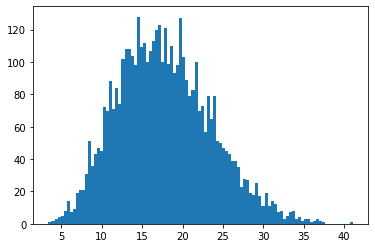

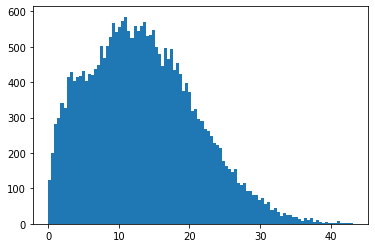

In [55]:
p = np.std(context_sizes_bootstrap, axis=0)[significant_values]
plt.hist(p, bins=100)
plt.show()

p = np.std(context_sizes_bootstrap, axis=0)
plt.hist(p, bins=100)
plt.show()

## Context-size and Effect-size

In [16]:
data = [
[True, 'context_size', 'bert', 'past', 12, 128, 'context_sizes_bootstrap_bert-base-uncased_L-12_H-128_pre-10_{map_type}_past_withfuture-per-layer-{layer}_fdr-0.01.npy'],
[True, 'context_size', 'bert', 'past', 12, 256, 'context_sizes_bootstrap_bert-base-uncased_L-12_H-256_pre-10_{map_type}_past_withfuture-per-layer-{layer}_fdr-0.01.npy'],
[True, 'context_size', 'bert', 'past', 12, 768, 'context_sizes_bootstrap_bert-base-uncased_L-12_H-768_pre-10_{map_type}_past_withfuture-per-layer-{layer}_fdr-0.01.npy'],
[True, 'context_size', 'bert', 'future', 12, 768, 'context_sizes_bootstrap_bert-base-uncased_L-12_H-768_pre-0_{map_type}_future_withpast-per-layer-{layer}_fdr-0.01.npy'],
#[False, 'context_size', 'bert', 'future', 8, 256, 'context_sizes_bert-base-uncased_L-8_H-256_A-4_pre-0_{map_type}_withpast_varying-future-per-layer-{layer}_fdr-0.01.npy'],
[False, 'context_size', 'bert', 'past', 8, 256, 'context_sizes_bootstrap_bert-base-uncased_L-8_H-256_pre-10_{map_type}_past_withfuture-per-layer-{layer}_fdr-0.01.npy'],
[True, 'context_size', 'bert', 'past', 8, 768, 'context_sizes_bootstrap_bert-base-uncased_L-8_H-768_pre-10_{map_type}_past_withfuture-per-layer-{layer}_fdr-0.01.npy'],
[True, 'context_size', 'gpt2', 'past', 12, 768, 'context_sizes_bootstrap_gpt2_pre-10_1_norm-2_norm-None_{map_type}_layer-{layer}_fdr-0.01.npy'],
[False, 'context_size', 'gpt2', 'past', 12, 768, 'context_sizes_gpt2_pre-10_1_norm-2_norm-None_{map_type}_layer-{layer}_fdr-0.01.npy'],

[False, 'effect_size', 'bert', 'past', 12, 128, 'eff-map_bert-base-uncased_L-12_H-128_pre-10_{map_type}_past_withfuture-per-layer-{layer}_fdr-0.01.nii.gz'],
[False, 'effect_size', 'bert', 'past', 12, 256, 'eff-map_bert-base-uncased_L-12_H-256_pre-10_{map_type}_past_withfuture-per-layer-{layer}_fdr-0.01.nii.gz'],
[False, 'effect_size', 'bert', 'future', 12, 768, 'eff-map_bert-base-uncased_L-12_H-768_pre-0_{map_type}_future_withpast-per-layer-{layer}_fdr-0.01.nii.gz'],
[False, 'effect_size', 'bert', 'past', 12, 768, 'eff-map_bert-base-uncased_L-12_H-768_pre-10_{map_type}_past_withfuture-per-layer-{layer}_fdr-0.01.nii.gz'],
#[False, 'effect_size', 'bert', 'future', 8, 256, 'eff-map_bert-base-uncased_L-8_H-256_A-4_pre-0_{map_type}_withpast_varying-future-per-layer-{layer}_fdr-0.01.nii.gz'],
[False, 'effect_size', 'bert', 'past', 8, 256, 'eff-map_bert-base-uncased_L-8_H-256_pre-10_{map_type}_past_withfuture-per-layer-{layer}_fdr-0.01.nii.gz'],
[False, 'effect_size', 'bert', 'past', 8, 768, 'eff-map_bert-base-uncased_L-8_H-768_pre-10_{map_type}_past_withfuture-per-layer-{layer}_fdr-0.01.nii.gz'],
[False, 'effect_size', 'gpt2', 'past', 12, 768, 'eff-map_gpt2_pre-10_1_norm-2_norm-None_{map_type}_layer-{layer}_fdr-0.01.nii.gz'],
[False, 'mask', 'bert', 'past', 12, 768, 'mask_bert-base-uncased_L-12_H-768_pre-10_{map_type}_past_withfuture-per-layer-{layer}_fdr-0.01.npy'],
[False, 'mask', 'bert', 'future', 12, 768, 'mask_bert-base-uncased_L-12_H-768_pre-0_{map_type}_future_withpast-per-layer-{layer}_fdr-0.01.npy'],
[False, 'mask', 'bert', 'past', 12, 256, 'mask_bert-base-uncased_L-12_H-256_pre-10_{map_type}_past_withfuture-per-layer-{layer}_fdr-0.01.npy'],
[False, 'mask', 'bert', 'past', 12, 128, 'mask_bert-base-uncased_L-12_H-128_pre-10_{map_type}_past_withfuture-per-layer-{layer}_fdr-0.01.npy'],
[False, 'mask', 'bert', 'past', 8, 256, 'mask_bert-base-uncased_L-8_H-256_pre-10_{map_type}_past_withfuture-per-layer-{layer}_fdr-0.01.npy'],
[False, 'mask', 'bert', 'past', 8, 768, 'mask_bert-base-uncased_L-8_H-768_pre-10_{map_type}_past_withfuture-per-layer-{layer}_fdr-0.01.npy'],
[False, 'mask', 'gpt2', 'past', 12, 768, 'mask_gpt2_pre-10_1_norm-2_norm-None_{map_type}_layer-{layer}_fdr-0.01.npy'],

]
columns = ['bootstrapped', 'data_type', 'model_type', 'context_type', 'nb_layers', 'nb_units', 'name']
df = pd.DataFrame(data, columns=columns)


In [17]:
df

,bootstrapped,data_type,model_type,context_type,nb_layers,nb_units,name
0,True,context_size,bert,past,12,128,context_sizes_bootstrap_bert-base-uncased_L-12...
1,True,context_size,bert,past,12,256,context_sizes_bootstrap_bert-base-uncased_L-12...
2,True,context_size,bert,past,12,768,context_sizes_bootstrap_bert-base-uncased_L-12...
3,True,context_size,bert,future,12,768,context_sizes_bootstrap_bert-base-uncased_L-12...
4,False,context_size,bert,past,8,256,context_sizes_bootstrap_bert-base-uncased_L-8_...
5,True,context_size,bert,past,8,768,context_sizes_bootstrap_bert-base-uncased_L-8_...
6,True,context_size,gpt2,past,12,768,context_sizes_bootstrap_gpt2_pre-10_1_norm-2_n...
7,False,context_size,gpt2,past,12,768,context_sizes_gpt2_pre-10_1_norm-2_norm-None_{...
8,False,effect_size,bert,past,12,128,eff-map_bert-base-uncased_L-12_H-128_pre-10_{m...
9,False,effect_size,bert,past,12,256,eff-map_bert-base-uncased_L-12_H-256_pre-10_{m...


In [18]:
kwargs = {
    'data_type': 'effect_size',
    'map_type': 'voxel-wise',
    'model_type': 'bert',
    'nb_layers': 12,
    'nb_units': 768,
    'context_type': 'past',
    'layer': 1
}

In [19]:
saving_path = '/neurospin/unicog/protocols/IRMf/LePetitPrince_Pallier_2018/LePetitPrince/derivatives/fMRI/context/english/raw_figures/'
saving_path = '/Users/alexpsq/Code/data/LePetitPrince'


In [20]:
def plot_brain_data(masker=dilated_global_masker_95, arguments=None, **kwargs):
    view = 'left' #left
    kwargs_plotting = {
        'surf_mesh': f'pial_{view}', # pial_right, infl_left, infl_right
        'surf_mesh_type': f'pial_{view}',
        'hemi': view, # right
        'view':'lateral', # medial
        'bg_map': f'sulc_{view}', # sulc_right
        'bg_on_data':True,
        'darkness':.8,
        'axes':None, 
        'figure':None
    }
    
    data = []
    
    for layer in range(1, 1+kwargs['nb_layers']):
        kwargs['layer'] = layer
        data.append(retrieve_name(**kwargs))
    
    arguments['vmax'] = arguments['vmax'] if arguments['vmax'] is not None else find_vmax_from_data(data)
    arguments['vmax'] = np.round(arguments['vmax'], 6)
    arguments['categorical_values'] = ('per-ROI' in kwargs['map_type'])
    print(arguments['vmax'])
        
    if kwargs['data_type']=='effect_size':
        multi_plot_horizontal(
            data, 
            [None]*len(data),
            f"L-{kwargs['nb_layers']}_H-{kwargs['nb_units']}_{kwargs['data_type']}_{kwargs['map_type']}_{kwargs['model_type']}_{kwargs['context_type']}_vmax-{arguments['vmax']}", 
            saving_path=arguments['saving_path'], 
            inflated=arguments['inflated'],
            return_plot=arguments['return_plot'], 
            vmax=arguments['vmax'],
            categorical_values=arguments['categorical_values'],
            draw_cbar=arguments['draw_cbar'],
            suptitle=arguments['suptitle'],
            threshold=arguments['threshold'],
            cmap=arguments['cmap'],
            symmetric_cbar=arguments['symmetric_cbar'],
            colorbar=arguments['colorbar'],
            kind=arguments['kind'],
            save_independently=arguments['save_independently'],
            **kwargs_plotting,
            )

    elif kwargs['data_type']=='context_size' and kwargs['map_type']=='voxel-wise':
        context_sizes_layer = [np.mean(np.load(item), axis=0) for item in data]
        plot_voxel_wise_analysis_horizontal(
            f"L-{kwargs['nb_layers']}_H-{kwargs['nb_units']}_{kwargs['data_type']}_{kwargs['map_type']}_{kwargs['model_type']}_{kwargs['context_type']}_vmax-{arguments['vmax']}",
            masker, 
            context_sizes_layer,
            mask_imgs=[None]*len(context_sizes_layer),
            labels=arguments['labels'],
            vmax=arguments['vmax'],
            cmap=arguments['cmap'],
            inflated=arguments['inflated'],
            draw_cbar=arguments['draw_cbar'],
            colorbar=arguments['colorbar'],
            asymmetry_analysis=arguments['asymmetry_analysis'],
            symmetric_cbar=arguments['symmetric_cbar'],
            saving_path=arguments['saving_path'],
            **kwargs_plotting,
        )
        
    elif (kwargs['data_type']=='context_size') and ('per-ROI' in kwargs['map_type']):
        context_sizes_layer = [np.mean(np.load(item), axis=0) for item in data]
        plot_roi_analysis_horizontal(
            f"L-{kwargs['nb_layers']}_H-{kwargs['nb_units']}_{kwargs['data_type']}_{kwargs['map_type']}_{kwargs['model_type']}_{kwargs['context_type']}_vmax-{arguments['vmax']}",
            masker, 
            context_sizes_layer,
            mask_imgs=[None]*len(context_sizes_layer),
            labels=arguments['labels'],
            atlas_maps=arguments['atlas_maps'],
            vmax=arguments['vmax'],
            cmap=arguments['cmap'],
            inflated=arguments['inflated'],
            draw_cbar=arguments['draw_cbar'],
            colorbar=arguments['colorbar'],
            asymmetry_analysis=arguments['asymmetry_analysis'],
            symmetric_cbar=arguments['symmetric_cbar'],
            saving_path=arguments['saving_path'],
            **kwargs_plotting,
        )

In [39]:
from scipy.sparse import csr_matrix

#def img_data(value, label, atlas_maps, labels):
#    index = labels.index(label) + 1
#    mask = math_img('img=={}'.format(index), img=atlas_maps)
#    img = math_img('img * {}'.format(value), img=mask)
#    return img.get_fdata()
#
def img_data(value, index, array):
    result = csr_matrix(array.shape, dtype=np.int8)
    result[array==index] = value
    return result
                
def preprocess(data, categorical_values, atlas_maps=atlas_maps, labels=labels, masker=None, cache=True, path=None, force=False, n_jobs=-2):
    print('Preprocessing')
    # Computing cmap value
    ref_array = atlas_maps.get_fdata()
    if cache and os.path.exists(os.path.join(path, 'image_layer-1.nii.gz')):
        for index, dict_ in tqdm(enumerate(data)):
            dict_['image'] = nib.load(os.path.join(path, f'image_layer-{index+1}.nii.gz'))
    elif force or ~os.path.exists(path):
        for index, dict_ in tqdm(enumerate(data)):
            gc.collect()
            values = dict_['values']
            if categorical_values:
                #imgs_data = Parallel(n_jobs=n_jobs)(delayed(img_data)(values[i], label, atlas_maps, labels) for i, label in enumerate(labels))
                imgs_data = Parallel(n_jobs=n_jobs)(delayed(img_data)(values[i], labels.index(label) + 1, ref_array) for i, label in enumerate(labels))
                new_data = np.sum(np.stack(imgs_data, axis=0), axis=0).toarray()

                result_img = nilearn.image.new_img_like(atlas_maps, new_data)
            else:
                result_img = masker.inverse_transform(values)
            dict_['image'] = result_img
            nib.save(result_img, os.path.join(path, f'image_layer-{index+1}.nii.gz'))
    return data

In [22]:
def pretty_plot(final_data, name, kwargs_model_1, kwargs_model_2, categorical_values=True, inflated=False, colorbar=False, cmap='gist_ncar', xlabel='', ylabel='', threshold=None):
    """Pretty plot for comparing models.
    """
    vmin = 0
    vmax = 0
    for index, dict_ in tqdm(enumerate(final_data)):
        vmax = max(dict_['vmax'][0], vmax)
        vmin = min(dict_['vmin'][0], vmin)
    
    figsize = (30, int(len(final_data)*50/12))

    fig1 = plt.figure(figsize=figsize)
    gs_left = fig1.add_gridspec(len(final_data), 5, width_ratios=[15, 20, 20, 20, 20], wspace=-0.15, 
                                                top=1., bottom=0., left=0., right=1)
    gs_right = fig1.add_gridspec(len(final_data), 5, width_ratios=[15, 20, 20, 20, 20], wspace=-0.2, hspace=-0.15,
                                                top=1., bottom=0., left=0., right=1)
    ax1s = [fig1.add_subplot(gs_left[i, 0]) for i in range(len(final_data))]
    ax2s = [fig1.add_subplot(gs_right[i, 1], projection= '3d') for i in range(len(final_data))]
    ax3s = [fig1.add_subplot(gs_right[i, 2], projection= '3d') for i in range(len(final_data))]
    ax4s = [fig1.add_subplot(gs_right[i, 3], projection= '3d') for i in range(len(final_data))]
    ax5s = [fig1.add_subplot(gs_right[i, 4], projection= '3d') for i in range(len(final_data))]


    threshold_a = np.percentile(np.hstack([dict_['data1'] for dict_ in final_data]), kwargs_model_1['threshold'])
    threshold_b = np.percentile(np.hstack([dict_['data2'] for dict_ in final_data]), kwargs_model_2['threshold'])


    for index, dict_ in tqdm(enumerate(final_data)):
        ax1 = ax1s[index]

        ax1.set_ylim((vmin-(vmax-vmin)/20, vmax+(vmax-vmin)/20))
        ax1.set_xlim((vmin-(vmax-vmin)/20, vmax+(vmax-vmin)/20))

        ax1.scatter(dict_['data1'], dict_['data2'], color=cmap(dict_['values']))
        ax1.axvline(threshold_a, ls='--', color='blue', alpha=0.5)
        ax1.axhline(threshold_b, ls='--', color='blue', alpha=0.5)
        ax1.plot([vmin, vmax], [vmin, vmax], ls="--", c=".3")
        ax1.patch.set_alpha(0)
        ax1.spines['top'].set_visible(False)
        ax1.spines['right'].set_visible(False)
        ax1.set_xlabel(xlabel, fontsize=20)
        ax1.set_ylabel(ylabel, fontsize=20)

        multi_plot_horizontal(
                [dict_['image']], #dilate_img(?)
                [None],
                plot_name='', 
                saving_path=None,
                save_independently=False,
                categorical_values=categorical_values,
                return_plot=False, 
                inflated=inflated,
                suptitle=None, #'Significant Context effect in ROIs (in number of tokens)',
                vmax=1,
                vmin=0,
                cmap=cmap,
                draw_cbar=False,
                colorbar=colorbar,
                kind='line',
                figure=fig1,
                axes=[ax2s[index], ax3s[index], ax4s[index], ax5s[index]],
                plot=False,
                threshold=threshold,
                **kwargs)
    plt.tight_layout()
    fig1.savefig(os.path.join('/Users/alexpsq/Desktop/Figures/PAPER-ALEX-1/pretty_plots', f'{name}.png'), bbox_inches = 'tight', pad_inches = 0, transparent=True)
    plt.show()

In [37]:
def g(values, vmin_cs=None, vmax_cs=None, scale=1, shift=0):
    vmin_cs = vmin_cs if vmin_cs is not None else np.min(values)
    vmax_cs = 1.05*vmax_cs if vmax_cs is not None else 1.05*np.max(values)
    result = ((values-vmin_cs)/(vmax_cs-vmin_cs))
    result = (shift + (scale * result))
    return result

def f(index_mask, data1, data2):
    if isinstance(data1, nib.nifti1.Nifti1Image):
        masker_roi = utils.get_roi_mask(atlas_maps, index_mask, labels, global_mask=None, PROJECT_PATH=ALL_MASKS_PATH) #os.path.join(ALL_MASKS_PATH, 'dilated_global_masker_95%_english')
        tmp1 = masker_roi.transform(data1)
        tmp2 = masker_roi.transform(data2)
    else:
        tmp1 = np.array(data1[index_mask]).reshape(1, -1)
        tmp2 = np.array(data2[index_mask]).reshape(1, -1)
    return tmp1, tmp2

def scatter_brain_data(kwargs_model_1, kwargs_model_2, masker=None, saving_path=None, draw_cbar=False, cmap='gist_ncar', roi_filter=None, normalize=None, single_signal=False, cache=True, force=False, n_jobs=-2):
    """
    """
    data_model_1 = []
    data_model_2 = []
    output = []
    path = uuid.uuid3(uuid.NAMESPACE_DNS, str(kwargs_model_1)+str(kwargs_model_2)).hex
    path = os.path.join('/Users/alexpsq/Desktop/tmp', path)
    print('Saving folder: ', path)
    if kwargs_model_1['map_type']=='per-ROI-1000':
        atlas_maps, labels = fetch_atlas_labels(None, n_rois=1000)
    elif kwargs_model_1['map_type']=='per-ROI':
        atlas_maps, labels = fetch_atlas_labels(None, n_rois=400)
    else:
        atlas_maps, labels = fetch_atlas_labels(None, n_rois=400)
        
    if cache:
        if os.path.exists(path):
            print('Loading data ...')
            output = []
            try:
                for layer in range(1, kwargs_model_1['nb_layers'] + 1):
                    output.append({
                        'X': np.load(os.path.join(path, f'X_layer-{layer}.npy')), 
                        'Y': np.load(os.path.join(path, f'Y_layer-{layer}.npy')),
                        'vmin': np.load(os.path.join(path, f'vmin_layer-{layer}.npy')),
                        'vmax': np.load(os.path.join(path, f'vmax_layer-{layer}.npy')),
                        'data1': np.load(os.path.join(path, f'data1_layer-{layer}.npy')),
                        'data2': np.load(os.path.join(path, f'data2_layer-{layer}.npy')),
                        'mask1': np.load(os.path.join(path, f'mask1_layer-{layer}.npy')),
                        'mask2': np.load(os.path.join(path, f'mask2_layer-{layer}.npy')),
                        })
                print('Data Loaded.')
            except FileNotFoundError as e:
                print('Couldn\'t load data:', e)
                force = True
        else:
            print('Data not computed.')
            force = True
    if (not cache) or force:
        if not os.path.exists(path):
            os.mkdir(path)
        # Retrieving raw data paths
        if kwargs_model_1['layer'] is None:
            for layer in range(1, kwargs_model_1['nb_layers'] + 1):
                kwargs_model_1['layer'] = layer
                kwargs_model_2['layer'] = layer
                data_model_1.append(retrieve_name(**kwargs_model_1))
                data_model_2.append(retrieve_name(**kwargs_model_2))
        else:
            data_model_1.append(retrieve_name(**kwargs_model_1))
            data_model_2.append(retrieve_name(**kwargs_model_2))

        # Looping over layer data
        for index, (data1, data2) in enumerate(zip(data_model_1, data_model_2)):
            print(f"Status: {index}/{len(data_model_1)}")
            
            # Loading raw data & Normalizing data if specified
            if '.nii.gz' in data1:
                data1 = nib.load(data1)
                data2 = nib.load(data2)
            elif '.npy' in data1:
                data1 = np.mean(np.load(data1), axis=0).reshape(-1)
                data2 = np.mean(np.load(data2), axis=0).reshape(-1)
    
            if (isinstance(data1, np.ndarray) and data1.shape[-1]!=len(labels)):
                data1 = masker.inverse_transform(data1)
                data2 = masker.inverse_transform(data2)

            # Extracting ROI data
            gc.collect()
            roi_filter = roi_filter if roi_filter is not None else labels
            roi_data = Parallel(n_jobs=n_jobs)(delayed(f)(
                labels.index(label), data1, data2
            ) for label in roi_filter)

            data1 = [roi[0][0] for roi in roi_data]
            if single_signal:
                data2 = [np.zeros(roi[1][0].shape) for roi in roi_data]
            else:
                data2 = [roi[1][0] for roi in roi_data] 

            if 'per-ROI' in kwargs_model_1['map_type']:
                data1 = np.array([np.mean(roi) for roi in data1])
                data2 = np.array([np.mean(roi) for roi in data2])

            if kwargs_model_1['map_type'] == 'voxel-wise':
                vmax = max(np.max(np.array([np.max(roi) for roi in data1])), np.max(np.array([np.max(roi) for roi in data2])))
                vmin = min(np.min(np.array([np.min(roi) for roi in data1])), np.min(np.array([np.min(roi) for roi in data2])))
            else:
                vmax = max(np.max([np.max(item) for item in data1]), np.max([np.max(item) for item in data2]))
                vmin = min(np.min([np.min(item) for item in data1]), np.min([np.min(item) for item in data2]))

            kwargs_model_1_ = kwargs_model_1.copy()
            kwargs_model_1_['data_type'] = 'mask'            
            kwargs_model_1_['layer'] = index+1
            mask1 = np.unique(np.load(retrieve_name(**kwargs_model_1_)).astype(int))
            mask1 = mask1[1:] - 1 if len(mask1)>1 else np.arange(len(labels))
            if not single_signal:
                kwargs_model_2_ = kwargs_model_2.copy()
                kwargs_model_2_['data_type'] = 'mask'            
                kwargs_model_2_['layer'] = index+1
            mask2 = np.unique(np.load(retrieve_name(**kwargs_model_2_)).astype(int)) if not single_signal else []
            mask2 = mask2[1:] - 1 if len(mask2)>1 else np.arange(len(labels))

            if 'per-ROI' in kwargs_model_1['map_type']:
                mask_data1 = np.zeros(len(labels))
                mask_data2 = np.zeros(len(labels))
                mask_data1[mask1] = 1
                mask_data2[mask2] = 1
                data1[~mask_data1.astype(bool)] = np.min(data1)
                data2[~mask_data2.astype(bool)] = np.min(data2)

            X = []
            Y = []
            
            output.append({
                'X': np.hstack(data1), 
                'Y': np.hstack(data2), 
                'vmin': [vmin], 
                'vmax': [vmax], 
                'data1': data1, 
                'data2': data2, 
                'mask1': mask1,
                'mask2': mask2,
            })
            np.save(os.path.join(path, f'X_layer-{index+1}.npy'), np.hstack(data1))
            np.save(os.path.join(path, f'Y_layer-{index+1}.npy'), np.hstack(data2))
            np.save(os.path.join(path, f'vmin_layer-{index+1}.npy'), np.array(vmin))
            np.save(os.path.join(path, f'vmax_layer-{index+1}.npy'), np.array(vmax))
            np.save(os.path.join(path, f'data1_layer-{index+1}.npy'), data1)
            np.save(os.path.join(path, f'data2_layer-{index+1}.npy'), data2)
            np.save(os.path.join(path, f'mask1_layer-{index+1}.npy'), mask1)
            np.save(os.path.join(path, f'mask2_layer-{index+1}.npy'), mask2)

    print("Status: Complete.")
    print("Normalizing...")
    factor1 = np.mean([np.linalg.norm(dict_['data1'], ord=2) for dict_ in output if np.linalg.norm(dict_['data1'], ord=2)!=0])
    factor2 = np.mean([np.linalg.norm(dict_['data2'], ord=2) for dict_ in output if np.linalg.norm(dict_['data2'], ord=2)!=0])
    print("Standardizing...")
    mean1, std1 = [np.mean(dict_['data1']) for dict_ in output], [np.std(dict_['data1']) if np.std(dict_['data1'])!=0 else 1 for dict_ in output]
    mean2, std2 = [np.mean(dict_['data2']) for dict_ in output], [np.std(dict_['data2']) if np.std(dict_['data2'])!=0 else 1 for dict_ in output]
    for index, dict_ in enumerate(output):
        np.save(os.path.join(path, f'normalized_data1_layer-{index+1}.npy'), dict_['data1']/factor1)
        np.save(os.path.join(path, f'normalized_data2_layer-{index+1}.npy'), dict_['data2']/factor2)
        np.save(os.path.join(path, f'standardized_data1_layer-{index+1}.npy'), (dict_['data1']-mean1[index])/std1[index])
        np.save(os.path.join(path, f'standardized_data2_layer-{index+1}.npy'), (dict_['data2']-mean2[index])/std2[index])
        dict_['normalized_data1'] = dict_['data1']/factor1
        dict_['normalized_data2'] = dict_['data2']/factor2
        dict_['standardized_data1'] = (dict_['data1']-mean1[index])/std1[index]
        dict_['standardized_data2'] = (dict_['data2']-mean2[index])/std2[index]
    
    normalized_max1 = np.max(np.hstack([dict_['normalized_data1'] for dict_ in output]))
    normalized_max2 = np.max(np.hstack([dict_['normalized_data2'] for dict_ in output]))
    standardized_max1 = np.max(np.hstack([dict_['standardized_data1'] for dict_ in output]))
    standardized_max2 = np.max(np.hstack([dict_['standardized_data2'] for dict_ in output]))
    for index, dict_ in enumerate(output):
        dict_['z_color_normalized'] = zip(dict_['normalized_data1']/normalized_max1, dict_['normalized_data2']/normalized_max2, np.zeros(dict_['normalized_data1'].shape), np.ones(dict_['normalized_data1'].shape))
        dict_['z_color_standardized'] = zip(dict_['standardized_data1']/standardized_max1, dict_['standardized_data2']/standardized_max2, np.zeros(dict_['standardized_data2'].shape), np.ones(dict_['standardized_data2'].shape))

        np.save(os.path.join(path, f'z_color_normalized-{index+1}.npy'), dict_['z_color_normalized'])
        np.save(os.path.join(path, f'z_color_standardized-{index+1}.npy'), dict_['z_color_standardized'])

    # Computing vmax and vmin across layers to have consistent colors across voxels/ROIs
    vmin = 0
    vmax = 0
    tmp1 = [dict_['data1'] for dict_ in output]
    tmp2 = [dict_['data2'] for dict_ in output]
    factor1 = np.mean([np.linalg.norm(tmp_, ord=2) for tmp_ in tmp1])
    factor2 = np.mean([np.linalg.norm(tmp_, ord=2) for tmp_ in tmp2])

    all_cs_tmp_all = np.hstack([(layer_data['data1']/factor1 + layer_data['data2']/factor2)/2 for layer_data in output])
    vmax_cs_all = np.max(all_cs_tmp_all)
    vmax_data1 = np.max(np.hstack([np.max(layer_data['data1']) for layer_data in output]))
    vmax_data2 = np.max(np.hstack([np.max(layer_data['data2']) for layer_data in output]))
    vmin_data1 = np.min(np.hstack([np.min(layer_data['data1']) for layer_data in output]))
    vmin_data2 = np.min(np.hstack([np.min(layer_data['data2']) for layer_data in output]))

    threshold_a = np.percentile(np.hstack([dict_['data1'] for dict_ in output]), kwargs_model_1['threshold'])
    threshold_b = np.percentile(np.hstack([dict_['data2'] for dict_ in output]), kwargs_model_2['threshold'])

    threshold_a = threshold_a if threshold_a>0 else 1e-5
    threshold_b = threshold_b if threshold_b>0 else 1e-5

    # Determining voxels/ROI color thanks to global vmax/vmin
    for layer_index, layer_data in tqdm(enumerate(output)):
        colors_groups = []
        colors_values = []
        values = np.zeros(layer_data['data1'].shape)
        cs_tmp_all = (layer_data['data1']/factor1 + layer_data['data2']/factor2)/2
        cs_tmp_all = g(cs_tmp_all, (threshold_a/factor1 + threshold_b/factor2)/2, vmax_cs=vmax_cs_all, scale=1/3)

        #cNorm = matplotlib.colors.Normalize(vmin=1.3*vmin, vmax=1.3*vmax)
        a = layer_data['data1'] > threshold_a
        b = layer_data['data2'] > threshold_b

        values = np.where(np.bitwise_and(a, b), cs_tmp_all, values)
        values = np.where(np.bitwise_and(~a, ~b), min(vmin_data1, vmin_data2), values)
        values = np.where(np.bitwise_and(~a, b), g(layer_data['data2'], threshold_b, vmax_cs=vmax_data2, shift=1/3+1e-5, scale=1/3), values) # Y-axis
        values = np.where(np.bitwise_and(a, ~b), g(layer_data['data1'], threshold_a, vmax_cs=vmax_data1, shift=2/3+1e-5, scale=1/3), values) # X-axis

        scalarMap = cmx.ScalarMappable(norm=None, cmap=cmap)
        layer_data['c'] = scalarMap.to_rgba(values)
        layer_data['values'] = values
        np.save(os.path.join(path, f'c_layer-{layer_index+1}.npy'), layer_data['c']),
        np.save(os.path.join(path, f'values_layer-{layer_index+1}.npy'), layer_data['values']),
        
    return output

In [24]:
kwargs = {
    'data_type': 'effect_size',
    'map_type': 'per-ROI',
    'model_type': 'bert',
    'nb_layers': 12,
    'nb_units': 768,
    'context_type': 'past',
    'layer': None
}

#atlas_maps, labels = fetch_atlas_labels(None, n_rois=1000 if kwargs['map_type']=='per-ROI-1000' else 400)
arguments = {
    'labels': labels,
    'atlas_maps': atlas_maps,
    'saving_path': '/Users/alexpsq/Desktop/Figures/PAPER-ALEX-1/pretty_plots',
    'inflated': False,
    'return_plot': True,
    'vmax': None,
    'categorical_values': False,
    'draw_cbar': True,
    'suptitle': '',
    'threshold': 1e-10,
    'symmetric_cbar': True,
    'cmap': 'black_red', #'black_red',
    'colorbar': False,
    'kind': 'line',
    'save_independently': False,
    'asymmetry_analysis': False,
}


7.683969


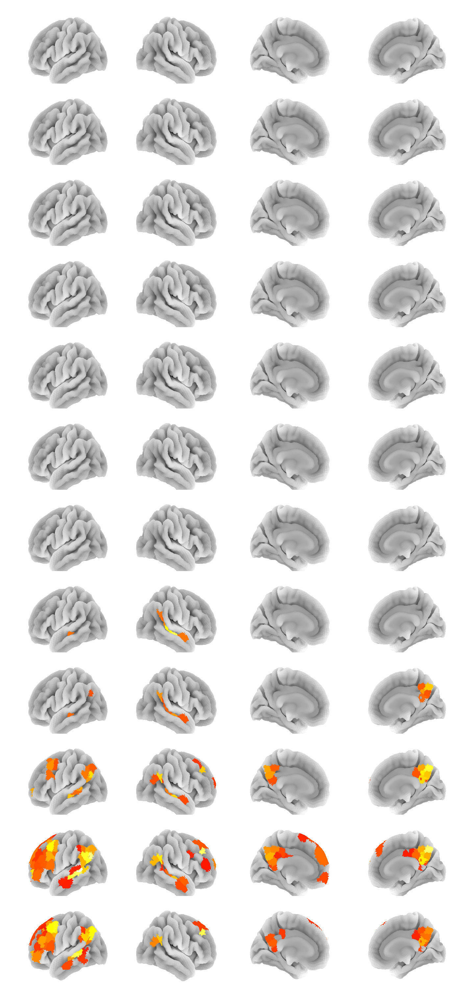

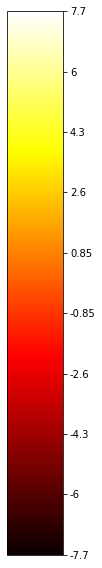

In [49]:
plot_brain_data(masker=dilated_global_masker_95, arguments=arguments, **kwargs)

In [46]:
for i, dict_ in enumerate(output):
    utils.save(dict_, f'/Users/alexpsq/Desktop/final_data_{i}')

In [26]:
final_data = [utils.load(f'/Users/alexpsq/Desktop/final_data_{i}.hdf5') for i in range(12)]

In [25]:
kwargs_model_1 = {
    'data_type': 'effect_size',
    'map_type': 'per-ROI',
    'model_type': 'bert',
    'nb_layers': 12,
    'nb_units': 768,
    'context_type': 'past',
    'layer': 10
}
kwargs_model_2 = {
    'data_type': 'effect_size',
    'map_type': 'per-ROI',
    'model_type': 'gpt2',
    'nb_layers': 12,
    'nb_units': 768,
    'context_type': 'past',
    'layer': 10
}

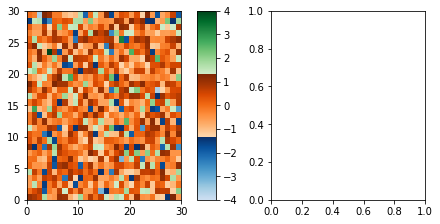

In [25]:
from matplotlib.colors import ListedColormap, LinearSegmentedColormap

def plot_examples(cms):
    """
    helper function to plot two colormaps
    """
    np.random.seed(19680801)
    data = np.random.randn(30, 30)

    fig, axs = plt.subplots(1, 2, figsize=(6, 3), constrained_layout=True)
    for [ax, cmap] in zip(axs, cms):
        psm = ax.pcolormesh(data, cmap=cmap, rasterized=True, vmin=-4, vmax=4)
        fig.colorbar(psm, ax=ax)
    plt.show()

blues = plt.cm.get_cmap('Blues')
oranges = plt.cm.get_cmap('Oranges')
greens = plt.cm.get_cmap('Greens')
new_blues = blues(np.linspace(0, 1, 350))
new_oranges = oranges(np.linspace(0, 1, 350))
new_greens = greens(np.linspace(0, 1, 350))


newcolors = np.vstack([new_blues[75:], new_oranges[75:], new_greens[75:]])
new_cmap = ListedColormap(newcolors)
plot_examples([new_cmap])


In [38]:
kwargs_model_gpt2 = {
    'data_type': 'effect_size',
    'map_type': 'per-ROI',
    'model_type': 'gpt2',
    'nb_layers': 12,
    'nb_units': 768,
    'context_type': 'past',
    'layer': None,
    'threshold': 95,
}
kwargs_model_bert_past = {
    'data_type': 'effect_size',
    'map_type': 'per-ROI',
    'model_type': 'bert',
    'nb_layers': 12,
    'nb_units': 768,
    'context_type': 'past',
    'layer': None,
    'threshold': 95,
}
kwargs_model_bert_future = {
    'data_type': 'effect_size',
    'map_type': 'per-ROI',
    'model_type': 'bert',
    'nb_layers': 12,
    'nb_units': 768,
    'context_type': 'future',
    'layer': None,
    'threshold': 95,
}

# Computing data
#output_gpt2_bert = scatter_brain_data(
#    kwargs_model_gpt2, 
#    kwargs_model_bert_past, 
#    masker=dilated_global_masker_95, 
#    saving_path='/Users/alexpsq/Code/data/LePetitPrince/figures',
#    cmap=new_cmap, 
#    roi_filter=labels,
#    normalize=None,
#    single_signal=False,
#    cache=True,
#    force=False
#)
#
#output_bert_future_past = scatter_brain_data(
#    kwargs_model_bert_future, 
#    kwargs_model_bert_past, 
#    masker=dilated_global_masker_95, 
#    saving_path='/Users/alexpsq/Code/data/LePetitPrince/figures',
#    cmap=new_cmap, 
#    roi_filter=labels,
#    normalize=None,
#    single_signal=False,
#    cache=True,
#    force=False
#)

outputs = Parallel(n_jobs=1)(delayed(scatter_brain_data)(
    kwargs_model_1, 
    kwargs_model_2, 
    masker=dilated_global_masker_95, 
    saving_path='/Users/alexpsq/Code/data/LePetitPrince/figures',
    cmap=new_cmap, 
    roi_filter=labels,
    normalize=None,
    single_signal=False,
    cache=True,
    force=False,
    n_jobs=1
) for kwargs_model_1, kwargs_model_2 in zip([kwargs_model_gpt2, kwargs_model_bert_future], [kwargs_model_bert_past, kwargs_model_bert_past]))

output_gpt2_bert = outputs[0]
output_bert_future_past = outputs[0]

12it [00:00, 905.16it/s]

Saving folder:  /Users/alexpsq/Desktop/tmp/d56c2e37c41037be906d714126732c5c
Loading data ...
Data Loaded.
Status: Complete.
Normalizing...
Standardizing...
Saving folder:  /Users/alexpsq/Desktop/tmp/0b512ed077d83d8290081e069dd2d4e1



12it [00:00, 804.61it/s]

Loading data ...
Data Loaded.
Status: Complete.
Normalizing...
Standardizing...


In [44]:
kwargs_model_gpt2 = {
    'data_type': 'effect_size',
    'map_type': 'per-ROI',
    'model_type': 'gpt2',
    'nb_layers': 12,
    'nb_units': 768,
    'context_type': 'past',
    'layer': None,
    'threshold': 95,
}
kwargs_model_bert_past = {
    'data_type': 'effect_size',
    'map_type': 'per-ROI',
    'model_type': 'bert',
    'nb_layers': 12,
    'nb_units': 768,
    'context_type': 'past',
    'layer': None,
    'threshold': 95,
}
kwargs_model_bert_future = {
    'data_type': 'effect_size',
    'map_type': 'per-ROI',
    'model_type': 'bert',
    'nb_layers': 12,
    'nb_units': 768,
    'context_type': 'future',
    'layer': None,
    'threshold': 95,
}


# Processing for plotting
categorical_values = ('per-ROI' in kwargs_model_gpt2['map_type'])

path_gpt2_bert = uuid.uuid3(uuid.NAMESPACE_DNS, str(kwargs_model_gpt2)+str(kwargs_model_bert_past)).hex
path_gpt2_bert = os.path.join('/Users/alexpsq/Desktop/tmp', path_gpt2_bert)
path_bert_future_past = uuid.uuid3(uuid.NAMESPACE_DNS, str(kwargs_model_bert_future)+str(kwargs_model_bert_past)).hex
path_bert_future_past = os.path.join('/Users/alexpsq/Desktop/tmp', path_bert_future_past)

paths = [path_gpt2_bert, path_bert_future_past]

final_data = Parallel(n_jobs=1)(delayed(preprocess)(
    output, 
    categorical_values=categorical_values, 
    atlas_maps=atlas_maps, 
    labels=labels, 
    masker=masker_atlas,
    path=paths[index],
    cache=True,
    force=False,
    n_jobs=1,
) for index, output in enumerate([output_gpt2_bert, output_bert_future_past]))


12it [00:00, 611.90it/s]
12it [00:00, 646.83it/s]

Preprocessing
Preprocessing


In [77]:
names = ['gpt2_vs_bert_threshold-95', 'bert_past_vs_bert_future_threshold-95']
x_labels = ['GPT-2', 'BERT Future']
y_labels = ['BERT Past', 'BERT Past']
kwargs_model_1_list = [kwargs_model_gpt2, kwargs_model_bert_future]
kwargs_model_2_list = [kwargs_model_bert_past, kwargs_model_bert_past]


Parallel(n_jobs=1)(delayed(pretty_plot)(
    data_tmp, 
    kwargs_model_1=kwargs_model_1_list[index],
    kwargs_model_2=kwargs_model_2_list[index],
    name=names[index], 
    inflated=False, 
    cmap=new_cmap,
    xlabel=x_labels[index], 
    ylabel=y_labels[index], 
    threshold=1e-10, #np.percentile(np.stack([data_tmp[0][i]['image'].get_fdata() for i in range(len(data_tmp[0]))], axis=0), 99.5),
) for index, data_tmp in enumerate(final_data))



12it [00:00, 50031.46it/s]
12it [00:14,  1.23s/it]


<Figure size 432x288 with 0 Axes>

12it [00:00, 30448.67it/s]
12it [00:17,  1.48s/it]


<Figure size 432x288 with 0 Axes>

[None, None]

In [88]:
# Save ‘final_data‘ data
names = ['gpt2-past', 'bert-past', 'bert-future']
for index, final_data in enumerate([final_data_gpt2, final_data_bert_past, final_data_bert_future]):
    for i, dict_ in tqdm(enumerate(final_data)):
        nib.save(dict_['image'], f'/Users/alexpsq/Desktop/tmp/final_data_{names[index]}_{i}_image.nii.gz')
        np.save(f'/Users/alexpsq/Desktop/tmp/final_data_{names[index]}_{i}_vmin.npy', dict_['vmin'])
        np.save(f'/Users/alexpsq/Desktop/tmp/final_data_{names[index]}_{i}_vmax.npy', dict_['vmax'])
        utils.save_yaml(dict_, f'/Users/alexpsq/Desktop/tmp/final_data_{names[index]}_{i}.yml')
        utils.save(dict_, f'/Users/alexpsq/Desktop/tmp/final_data_{names[index]}_{i}')


12it [12:22, 61.88s/it]
12it [12:23, 61.92s/it]
12it [12:21, 61.79s/it]


In [41]:
# Load previously saved ‘output‘ data
data = [utils.load(f'/Users/alexpsq/Desktop/tmp/final_data_{names[index]}_{i}.hdf5') for i in range(12)]
output_ = []
for i, dict_ in enumerate(data):
    res = {}
    for key in dict_.keys():
        res[key[:-2]] = dict_[key]
    res['image'] = nib.load(f'/Users/alexpsq/Desktop/tmp/final_data_gpt2_bert_past-L-12_h-768_{i}_image.nii.gz')
    res['vmin'] = np.load(f'/Users/alexpsq/Desktop/tmp/final_data_gpt2_bert_past-L-12_h-768_{i}_vmin.npy')
    res['vmax'] = np.load(f'/Users/alexpsq/Desktop/tmp/final_data_gpt2_bert_past-L-12_h-768_{i}_vmax.npy')
    
    output_.append(res)

In [37]:
name_bert_future = f"raw_bert-future_normalize-L2"
pretty_plot(final_data_bert_future, name_bert_future, vmin_bert_future, vmax_bert_future, inflated=True, xlabel='BERT FUTURE', ylabel='', threshold=None)

for threshold in [25, 40, 50, 60, 70, 80, 90, 95]:
    #name_gpt2 = f"raw_gpt2-past_normalize-L2_{threshold}"
    #pretty_plot(final_data_gpt2, name_gpt2, vmin_gpt2, vmax_gpt2, inflated=True, xlabel='GPT-2 PAST', ylabel='', threshold=np.percentile(np.unique(np.stack([final_data_gpt2[i]['image'].get_fdata() for i in range(len(final_data_gpt2))], axis=0)), threshold)) # 0.55

    #name_bert_past = f"raw_bert-past_normalize-L2_{threshold}"
    #pretty_plot(final_data_bert_past, name_bert_past, vmin_bert_past, vmax_bert_past, inflated=True, xlabel='BERT PAST', ylabel='', threshold=np.percentile(np.unique(np.stack([final_data_bert_past[i]['image'].get_fdata() for i in range(len(final_data_bert_past))], axis=0)), threshold)) # 0.55

    name_bert_future = f"raw_bert-future_normalize-L2_{threshold}"
    pretty_plot(final_data_bert_future, name_bert_future, vmin_bert_future, vmax_bert_future, inflated=True, xlabel='BERT FUTURE', ylabel='', threshold=np.percentile(np.unique(np.stack([final_data_bert_future[i]['image'].get_fdata() for i in range(len(final_data_bert_future))], axis=0)), threshold)) # 0.55


12it [00:17,  1.44s/it]


<Figure size 432x288 with 0 Axes>

12it [00:16,  1.33s/it]


<Figure size 432x288 with 0 Axes>

12it [00:17,  1.48s/it]


<Figure size 432x288 with 0 Axes>

12it [00:18,  1.57s/it]


<Figure size 432x288 with 0 Axes>

12it [00:17,  1.49s/it]


<Figure size 432x288 with 0 Axes>

12it [00:17,  1.49s/it]


<Figure size 432x288 with 0 Axes>

12it [00:18,  1.55s/it]


<Figure size 432x288 with 0 Axes>

12it [00:18,  1.54s/it]


<Figure size 432x288 with 0 Axes>

12it [00:17,  1.48s/it]


<Figure size 432x288 with 0 Axes>

In [46]:
   
# Plotting

names = ['gpt2_masked', 'bert_past_masked', 'bert_future_masked']
x_labels = ['GPT-2', 'BERT Past', 'BERT Future']
Parallel(n_jobs=-2)(delayed(pretty_plot)(
    data_tmp[0], 
    name=names[index], 
    vmin=data_tmp[1], 
    vmax=data_tmp[2], 
    inflated=False, 
    xlabel=x_labels[index], 
    ylabel='', 
    threshold=0.52, #np.percentile(np.stack([data_tmp[0][i]['image'].get_fdata() for i in range(len(data_tmp[0]))], axis=0), 99.5),
) for index, data_tmp in enumerate(final_data))


# np.percentile(np.unique(np.stack([data_tmp[i]['image'].get_fdata() for i in range(len(data_tmp))], axis=0)), threshold)

#fig1.savefig(os.path.join('/Users/alexpsq/Desktop', 'test.png'), bbox_inches = 'tight', pad_inches = 0, transparent=True)

[None, None, None]

In [75]:
new_data = []
for i, dict_ in enumerate(final_data[2][0]):
    new_dict = {}
    for key in dict_.keys():
        if key=='X':
            new_dict[key] = dict_[key]
        elif key=='Y':
            new_dict[key] = final_data[1][0][i]['X']
        elif key not in ['spearman_coef', 'spearman_p', 'image']:
            new_dict[key] = [(dict_[key][0] + final_data[1][0][i][key][0])/2]
        elif key=='image':
            new_dict[key] = nilearn.image.mean_img([dict_[key], final_data[1][0][i][key]])
    new_data.append(new_dict)
pretty_plot(
    new_data, 
    name='test2', 
    vmin=min(final_data[0][1], final_data[1][1]), 
    vmax=max(final_data[0][2], final_data[1][2]),
    inflated=True, 
    xlabel='BERT Future', 
    ylabel='BERT Past',
    threshold=np.percentile(np.stack([new_data[i]['image'].get_fdata() for i in range(len(new_data))], axis=0), 99),
)


12it [00:12,  1.06s/it]


<Figure size 432x288 with 0 Axes>

In [73]:
np.percentile(np.stack([new_data[i]['image'].get_fdata() for i in range(len(new_data))], axis=0), 99)

0.2500602227943515

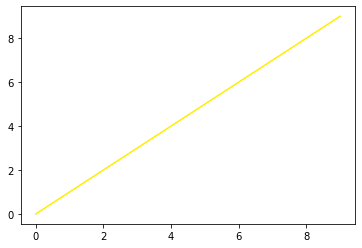

In [128]:
#print(np.percentile(np.unique(final_data_gpt2_10[0]['image'].get_fdata()), 95))
plt.plot(np.arange(10), np.arange(10), color=plt.cm.gist_ncar(0.55))
plt.show()

400it [00:12, 31.85it/s] 


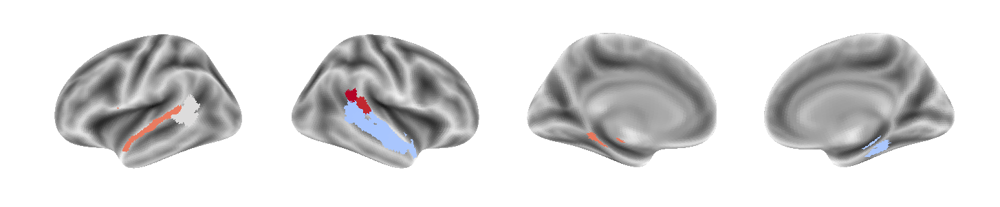

400it [00:10, 38.76it/s] 


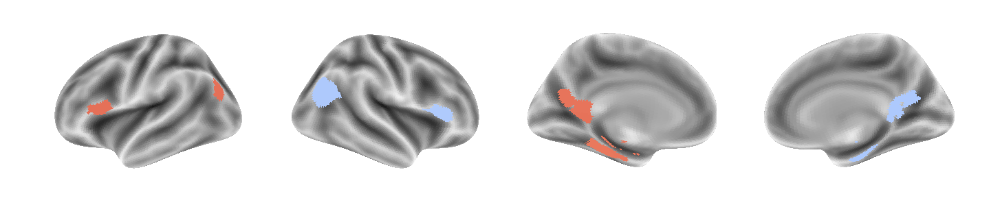

400it [00:25, 15.39it/s] 


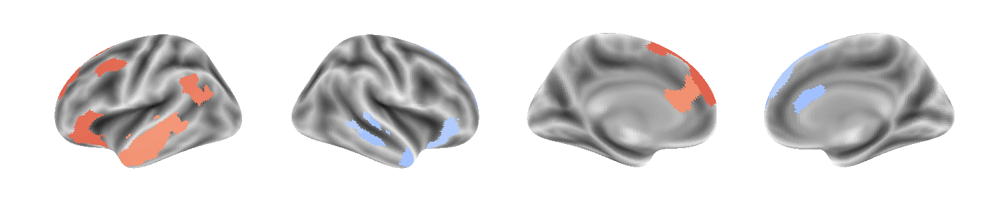

400it [00:25, 15.47it/s] 


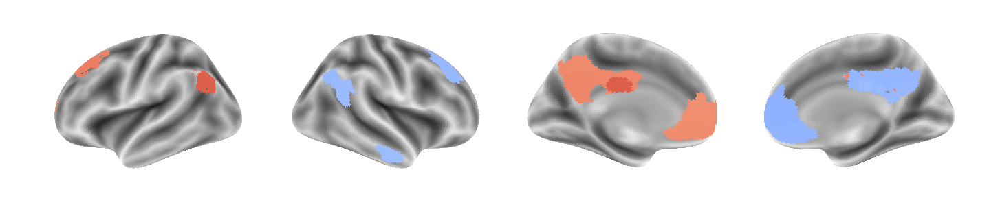

400it [00:47,  8.34it/s] 


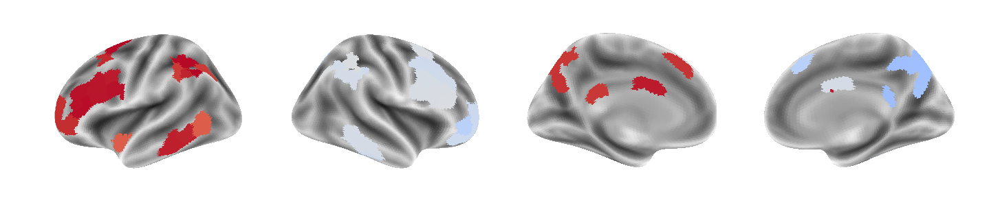

400it [00:19, 20.68it/s] 


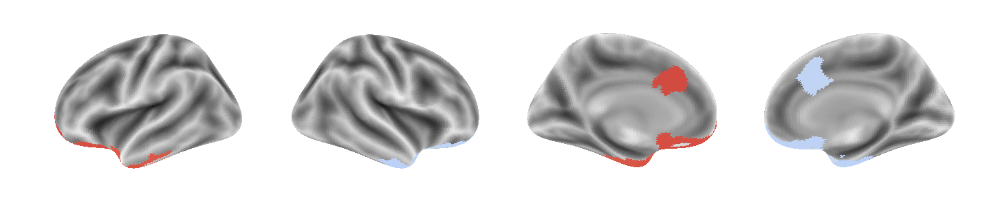

400it [00:39, 10.04it/s]


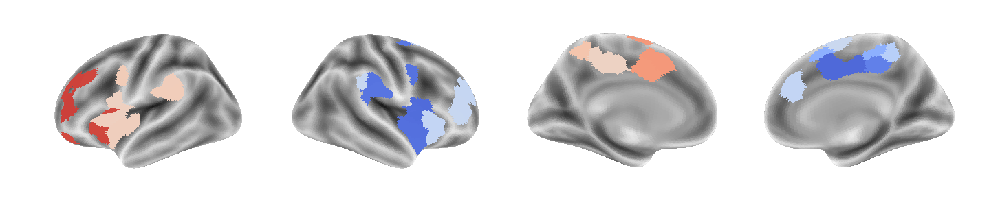

400it [00:39, 10.07it/s]


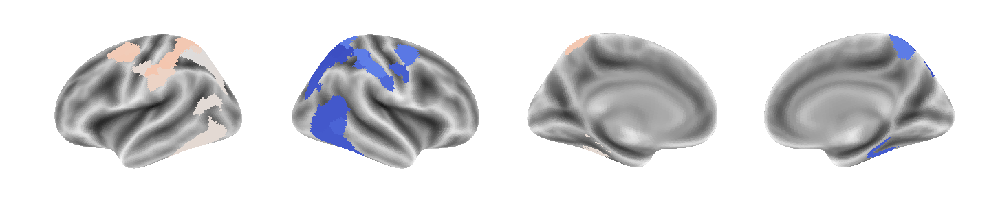

400it [00:53,  7.53it/s]


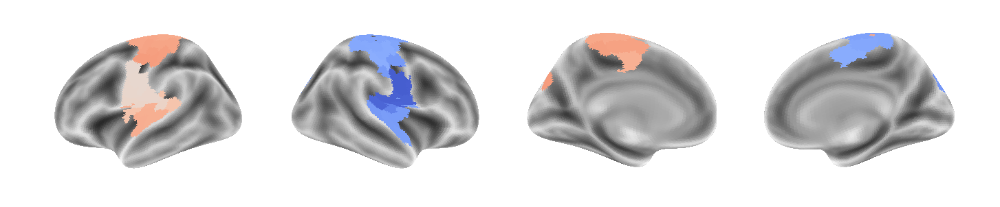

400it [00:35, 11.28it/s]


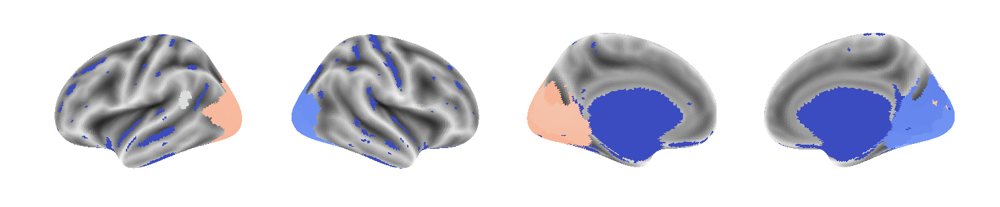

In [122]:
for filtering in [temporoparietal, default_C, default_B, default_A, cont, limbic, sal_ventral_attention, dorso_attention, motor, occipital]:
    fast_plot_brain_legend(
                order, 
                cmap='coolwarm', 
                atlas_maps=atlas_maps, 
                inflated=True, 
                labels=labels, 
                plot_name='', 
                saving_path=None,
                kind='line',
                roi_filter=filtering,
                draw_cbar=False
            )


In [26]:
model_names = [
'bert-base-uncased_pre-20_1_post-0_norm-2_norm-None_temporal-shifting-0_*_hidden-layer-6-10',
'bert-base-uncased_pre-20_1_post-0_norm-2_norm-None_temporal-shifting-0_*_hidden-layer-2-6',
'bert-base-uncased_pre-20_1_post-0_norm-2_norm-None_temporal-shifting-0_*_hidden-layer-6',
'bert-base-uncased_pre-20_1_post-0_norm-2_norm-None_temporal-shifting-0_*_hidden-layer-10',
'gpt2_pre-20_1_norm-2_norm-None_temporal-shifting-0_*_hidden-layer-6-10',
'gpt2_pre-20_1_norm-2_norm-None_temporal-shifting-0_*_hidden-layer-2-6',
'gpt2_pre-20_1_norm-2_norm-None_temporal-shifting-0_*_hidden-layer-6',
'gpt2_pre-20_1_norm-2_norm-None_temporal-shifting-0_*_hidden-layer-10',
]


data_full = {name: glob.glob(os.path.join('/Users/alexpsq/Code/data/LePetitPrince/Pearson_maps', '*' + name + '_Pearson_coeff.nii.gz')) for name in model_names}
maps = [data_full[name] for name in data_full.keys()]
mean_maps = Parallel(n_jobs=-2)(delayed(mean_img)(imgs) for imgs in maps)

In [76]:
#atlas_maps, labels = reporting.load_atlas()
atlas_maps, labels = fetch_atlas_labels(None, n_rois=400)

In [28]:
median_specific, third_quartile_specific, maximum, size = fit_per_roi(
    mean_maps, 
    atlas_maps, 
    labels, 
    global_mask=DILATED_MASKER_PATH, 
    mask_img=None,
    #mask_img=os.path.join(ALL_MASKS_PATH, 'bert-base-uncased_pre-2_1_post-0_norm-None_norm-inf_temporal-shifting-0_hidden-all-layers_pca_300_significant-voxels.nii.gz'),   
    #mask_img=os.path.join(ALL_MASKS_PATH, 'gpt2_pre-20_1_norm-inf_norm-inf_{}_hidden-all-layers_pca_300_significant-voxels.nii.gz'),
    PROJECT_PATH=ALL_MASKS_PATH
)


  0%|          | 0/400 [00:00<?, ?it/s]

	Looping through labeled masks...


100%|██████████| 400/400 [02:40<00:00,  2.50it/s]

		-->Done


In [77]:
filter_out = [
    'Background', 
    'Left Occipital Pole',
    'Left Inferior Temporal Gyrus, posterior division',
    'Left Parahippocampal Gyrus, anterior division',
    'Left Temporal Fusiform Cortex, anterior division',
    'Right Occipital Pole',
    'Right Parahippocampal Gyrus, anterior division',
    'Right Subcallosal Cortex', 
    'Left Subcallosal Cortex',
    'Right Temporal Fusiform Cortex, anterior division',
    'Right Inferior Temporal Gyrus, posterior division',
    'Right Temporal Fusiform Cortex, posterior division',
    'Left Postcentral Gyrus',
    'Right Parahippocampal Gyrus, posterior division',
    'Left Precentral Gyrus',
    'Left Temporal Fusiform Cortex, posterior division',
    'Right Central Opercular Cortex', 'Right Precentral Gyrus',
    'Right Juxtapositional Lobule Cortex (formerly Supplementary Motor Cortex)',
    'Left Parahippocampal Gyrus, posterior division',
    'Right Postcentral Gyrus',
    'Right Temporal Occipital Fusiform Cortex',
    'Left Inferior Temporal Gyrus, anterior division',
    'Left Juxtapositional Lobule Cortex (formerly Supplementary Motor Cortex)',
    'Left Superior Parietal Lobule',
    'Right Lateral Occipital Cortex, inferior division',
    'Left Lateral Occipital Cortex, inferior division',
    'Left Central Opercular Cortex', 
    'Right Insular Cortex',
    'Left Temporal Occipital Fusiform Cortex',
]
highlight = [
    'Left Planum Polare',
    'Right Planum Polare',
    "Left Heschl's Gyrus (includes H1 and H2)",
    "Right Heschl's Gyrus (includes H1 and H2)",
    'Left Planum Temporale',
    'Right Planum Temporale',
    'Left Parietal Operculum Cortex',
    'Right Parietal Operculum Cortex',
]


highlight = auditive_LH+auditive_RH

In [39]:
filter_out = np.array(labels)[median_specific[:, 3] < 0.06]

NameError: name 'median_specific' is not defined

In [262]:
#masks, img = multi_masker(atlas_maps, [labels.index(item) for item in ['17Networks_LH_SomMotA_8',]], labels)
#
#fsaverage = datasets.fetch_surf_fsaverage('fsaverage5') #fsaverage5
#view = 'right' #left
#kwargs = {
#    'surf_mesh': f'pial_{view}', # pial_right, infl_left, infl_right
#    'surf_mesh_type': f'pial_{view}',
#    'hemi': view, # right
#    'view':'medial', # medial
#    'bg_map': f'sulc_{view}', # sulc_right
#    'bg_on_data':True,
#    'darkness':.9,
#    'axes': None,
#    'figure': None
#}
#
#surf_img = vol_to_surf(atlas_maps, fsaverage[kwargs['surf_mesh']], mask_img=None, interpolation='nearest', kind='line', radius=1e-15, n_samples=80)
#     
#plotting.plot_surf_contours(fsaverage[kwargs['surf_mesh']], surf_img)

In [81]:
def plot_network(networks, name='', filter_out=[], highlight_nb=1):
    """Plot networks of rois.
    """
    values = []
    cmap = plt.cm.gist_ncar
    length = len(networks) + highlight_nb
    indexes = np.arange(length)/length
    indexes[0] = 1e-9
    color_list = np.hstack([indexes[0:highlight_nb], indexes[-len(networks)+highlight_nb:]])
    
    def f(value, label, atlas_maps, labels):
        index = labels.index(label) + 1
        print('-', end='')
        mask = math_img('img=={}'.format(index), img=atlas_maps)
        print('-', end='')
        img = math_img('img * {}'.format(value), img=mask)
        print('-', end='')
        return img.get_fdata()
                
    for label in labels:
        if label in filter_out:
            color = 0
        else:
            index = 0
            while index < len(networks):
                if label in networks[index]:
                    color = color_list[index]
                    index = len(networks)
                index += 1
        values.append(color)

    imgs_data = []
    for i, label in enumerate(labels):
        print(i, end='')
        imgs_data.append(f(values[i], label, atlas_maps, labels))

    print('Computing new data...')
    new_data = np.sum(np.stack(imgs_data, axis=0), axis=0)
    print('Creating new Nifti image...')
    result_img = nilearn.image.new_img_like(atlas_maps, new_data)

    print('Saving...')
    nib.save(result_img, f'/Users/alexpsq/Code/data/LePetitPrince/{name}.nii.gz')
    return result_img

In [336]:
brain_legend_all_rois = plot_network(all_networks, name='legend_anatomical_contrast_layers', filter_out=[], highlight_nb=2)

0---1---2---3---4---5---6---7---8---9---10---11---12---13---14---15---16---17---18---19---20---21---22---23---24---25---26---27---28---29---30---31---32---33---34---35---36---37---38---39---40---41---42---43---44---45---46---47---48---49---50---51---52---53---54---55---56---57---58---59---60---61---62---63---64---65---66---67---68---69---70---71---72---73---74---75---76---77---78---79---80---81---82---83---84---85---86---87---88---89---90---91---92---93---94---95---96---97---98---99---100---101---102---103---104---105---106---107---108---109---110---111---112---113---114---115---116---117---118---119---120---121---122---123---124---125---126---127---128---129---130---131---132---133---134---135---136---137---138---139---140---141---142---143---144---145---146---147---148---149---150---151---152---153---154---155---156---157---158---159---160---161---162---163---164---165---166---167---168---169---170---171---172---173---174---175---176---177---178---179---180---181---182---183---184---

In [82]:
brain_legend_paired_rois = plot_network(paired_networks, name='paired_legend_anatomical_contrast_layers', filter_out=[], highlight_nb=1)

0---1---2---3---4---5---6---7---8---9---10---11---12---13---14---15---16---17---18---19---20---21---22---23---24---25---26---27---28---29---30---31---32---33---34---35---36---37---38---39---40---41---42---43---44---45---46---47---48---49---50---51---52---53---54---55---56---57---58---59---60---61---62---63---64---65---66---67---68---69---70---71---72---73---74---75---76---77---78---79---80---81---82---83---84---85---86---87---88---89---90---91---92---93---94---95---96---97---98---99---100---101---102---103---104---105---106---107---108---109---110---111---112---113---114---115---116---117---118---119---120---121---122---123---124---125---126---127---128---129---130---131---132---133---134---135---136---137---138---139---140---141---142---143---144---145---146---147---148---149---150---151---152---153---154---155---156---157---158---159---160---161---162---163---164---165---166---167---168---169---170---171---172---173---174---175---176---177---178---179---180---181---182---183---184---

In [84]:
brain_legend_paired_rois = nib.load(f'/Users/alexpsq/Code/data/LePetitPrince/paired_legend_anatomical_contrast_layers.nii.gz')

In [85]:
def scatter_roi(data1, data2, data3, data4, networks=all_networks, network_names=None, highlight_nb=1, filter_out=None, cmap='gist_ncar', title='', figsize=(20, 10), labels=labels, name='', x_label1='', y_label1='', x_label2='', y_label2='', x_label3='', y_label3='', result_img=None, density_plot=True):
    """
    """
    plt.close('all')
    cmap = plt.cm.gist_ncar
    length = len(networks) + highlight_nb
    indexes = np.arange(length)/length
    indexes[0] = 1e-9
    color_list = np.hstack([indexes[0:highlight_nb], indexes[-len(networks)+highlight_nb:]])

    fig1 = plt.figure(figsize=figsize)
    gs_top = fig1.add_gridspec(3, 10, height_ratios=[60, 0, 30], width_ratios=[14, 14, 2, 14, 14, 2, 10, 10, 10, 10], wspace=1.1)
    gs_bottom = fig1.add_gridspec(3, 10, height_ratios=[60, 0, 30], wspace=-0.2, hspace=-0.15,
                                                top=1., bottom=0., left=0., right=1)
    ax0 = fig1.add_subplot(gs_bottom[2, :2])
    ax1s = [fig1.add_subplot(gs_top[0, :2]), fig1.add_subplot(gs_top[0, 3:5]), fig1.add_subplot(gs_top[0, 6:10])]
    ax2s = [fig1.add_subplot(gs_bottom[2, i*2:(i+1)*2], projection= '3d') for i in range(1, 5)]

    multi_plot_horizontal(
                [result_img], #dilate_img(?)
                [None],
                plot_name='', 
                saving_path=None,
                save_independently=False,
                categorical_values=True,
                return_plot=True, 
                inflated=False,
                suptitle=None, #'Significant Context effect in ROIs (in number of tokens)',
                vmax=1,
                vmin=0,
                cmap='gist_ncar',
                draw_cbar=False,
                colorbar=False,
                kind='line',
                figure=fig1,
                axes=[ax2s[0], ax2s[1], ax2s[2], ax2s[3]],
                plot=False)

    def scatter_(data1, data2, ax, x_label='', y_label='', highlight_nb=highlight_nb):
        color = 'black'
        values = []
        cmap = plt.cm.gist_ncar

        for label_index, label in enumerate(labels):
            if (filter_out is None) or (label not in filter_out):
                index = 0
                while index < len(networks):
                    if label in networks[index]:
                        color = cmap(color_list[index])
                        ax.scatter(data1[label_index], data2[label_index], color=color) 
                        index = len(networks)
                    index += 1
                        
        vmin = np.min(np.stack([data1, data2]))
        vmax = np.max(np.stack([data1, data2]))
        ax.plot([vmin, vmax], [vmin, vmax], ls="--", color='black')
        ax.patch.set_alpha(0)
        ax.spines['top'].set_visible(False)
        ax.spines['right'].set_visible(False)
        ax.axhline(np.percentile(data2, 90), color='black', alpha=0.2,)
        ax.set_xlabel(x_label)
        ax.set_ylabel(y_label)
    
    scatter_(data1, data2, ax1s[0], x_label=x_label1, y_label=y_label1)
    scatter_(data3, data4, ax1s[1], x_label=x_label2, y_label=y_label2)
    if not density_plot:
        scatter_(data4-data3, data2-data1, ax1s[2], x_label=x_label3, y_label=y_label3)
    else:
        data2 = data2-data1
        data1 = data4-data3
        vmin = np.min(np.stack([data1, data2])) 
        vmax = np.max(np.stack([data1, data2])) 
        vmin = vmin-(vmax-vmin)/20
        vmax = vmax+(vmax-vmin)/20
        shape = (100, 100)
        x_axis = np.linspace(vmin, vmax, shape[0])
        y_axis = np.linspace(vmin, vmax, shape[1])
        x, y = np.meshgrid(x_axis, y_axis)
        positions = np.vstack([x.ravel(), y.ravel()])

        for index_network, network in tqdm(enumerate(networks)):
            mask = np.array([labels.index(roi) for roi in network])
            data_tmp1 = data1[mask]
            data_tmp2 = data2[mask]
            values = np.vstack([data_tmp1, data_tmp2])
            kernel = st.gaussian_kde(values)
            f = np.reshape(kernel(positions).T, x.shape)
            f = f * color_list[index_network] / np.max(f)
            fig = plt.figure(figsize=(8,8))
            ax = fig.gca()

            cfset = ax.contourf(x, y, f, cmap='gist_ncar', vmin=0, vmax=indexes[-1])
            plt.close(fig)
            tmp = cfset.allsegs[-1][0]
            ax1s[2].fill(tmp[:,0], tmp[:,1], '.-', label=f'', color=cmap(color_list[index_network]))
            ax1s[2].plot([vmin, vmax], [vmin, vmax], ls="--", color='black')
            ax1s[2].patch.set_alpha(0)
            ax1s[2].set_facecolor('white')
            ax1s[2].spines['top'].set_visible(False)
            ax1s[2].spines['right'].set_visible(False)
            ax1s[2].set_xlabel(x_label3)
            ax1s[2].set_ylabel(y_label3)

    plt.suptitle(title)
    handles = [
        mpatches.Patch(color=cmap(color_list[i]), label=network_names[i]) for i in range(len(networks))
    ] + [
        Line2D([0], [0], color='black', alpha=0.2, lw=2, label='90% percentile (y axis)'),
          ]
    ax0.legend(handles=handles, loc="center")
    ax0.spines['top'].set_visible(False)
    ax0.spines['right'].set_visible(False)
    ax0.spines['bottom'].set_visible(False)
    ax0.spines['left'].set_visible(False)
    ax0.set_xticks([])
    ax0.set_yticks([])
    plt.tight_layout()
    fig1.savefig(os.path.join('/Users/alexpsq/Desktop/Figures/PAPER-ALEX-1/pretty_plots', f'{name}.png'), bbox_inches = 'tight', pad_inches = 0, transparent=True, dpi=400)
    plt.show()


In [86]:

scatter_roi(
    median_specific[:, 3], 
    median_specific[:, 0], 
    median_specific[:, 2], 
    median_specific[:, 1], 
    networks=all_networks,
    network_names=all_network_names,
    highlight_nb=2, 
    filter_out=[], 
    result_img=brain_legend_all_rois, 
    cmap='gist_ncar', 
    title='BERT: Layer 6+10 - 10 vs 6+2 - 6', 
    name='BERT Layer 6+10 - 10 vs 6+2 - 6_filter-at-0.05_ellipsis-fit_anatomical_all'.replace(' ', '_'), 
    x_label1 = 'Layer {10}',
    y_label1 = 'Layer {10+6}',
    x_label2 = 'Layer {2}',
    y_label2 = 'Layer {6+2}',
    x_label3='Layers {6+10} vs Layer {10}',
    y_label3='Layers {6+2} vs Layer {6}',
    density_plot=True,
)


scatter_roi(
    median_specific[:, 3], 
    median_specific[:, 0], 
    median_specific[:, 2], 
    median_specific[:, 1], 
    networks=paired_networks,
    network_names=paired_network_names,
    highlight_nb=1, 
    filter_out=[], 
    result_img=brain_legend_paired_rois, 
    cmap='gist_ncar', 
    title='BERT: Layer 6+10 - 10 vs 6+2 - 6', 
    name='BERT Layer 6+10 - 10 vs 6+2 - 6_filter-at-0.05_ellipsis-fit_anatomical_paired'.replace(' ', '_'), 
    x_label1 = 'Layer {10}',
    y_label1 = 'Layer {10+6}',
    x_label2 = 'Layer {2}',
    y_label2 = 'Layer {6+2}',
    x_label3='Layers {6+10} vs Layer {10}',
    y_label3='Layers {6+2} vs Layer {6}',
    density_plot=True,
)


scatter_roi(
    median_specific[:, 7], 
    median_specific[:, 4], 
    median_specific[:, 6], 
    median_specific[:, 5], 
    networks=all_networks,
    network_names=all_network_names,
    highlight_nb=2, 
    filter_out=[], 
    result_img=brain_legend_all_rois, 
    cmap='gist_ncar', 
    title='GPT-2: Layer 6+10 - 10 vs 6+2 - 6', 
    name='GPT-2 Layer 6+10 - 10 vs 6+2 - 6_filter-at-0.05_ellipsis-fit_anatomical_all'.replace(' ', '_'), 
    x_label1 = 'Layer {10}',
    y_label1 = 'Layer {10+6}',
    x_label2 = 'Layer {2}',
    y_label2 = 'Layer {6+2}',
    x_label3='Layers {6+10} vs Layer {10}',
    y_label3='Layers {6+2} vs Layer {6}',
    density_plot=True,
)

scatter_roi(
    median_specific[:, 7], 
    median_specific[:, 4], 
    median_specific[:, 6], 
    median_specific[:, 5], 
    networks=paired_networks,
    network_names=paired_network_names,
    highlight_nb=1, 
    filter_out=[], 
    result_img=brain_legend_paired_rois, 
    cmap='gist_ncar', 
    title='GPT-2: Layer 6+10 - 10 vs 6+2 - 6', 
    name='GPT-2 Layer 6+10 - 10 vs 6+2 - 6_filter-at-0.05_ellipsis-fit_anatomical_paired'.replace(' ', '_'), 
    x_label1 = 'Layer {10}',
    y_label1 = 'Layer {10+6}',
    x_label2 = 'Layer {2}',
    y_label2 = 'Layer {6+2}',
    x_label3='Layers {6+10} vs Layer {10}',
    y_label3='Layers {6+2} vs Layer {6}',
    density_plot=True,
)

NameError: name 'median_specific' is not defined

In [87]:
model_names = [
'bert-base-uncased_pre-20_1_post-0_norm-2_norm-None_temporal-shifting-0_*_hidden-layer-{layer}',
'gpt2_pre-20_1_norm-2_norm-None_temporal-shifting-0_*_hidden-layer-{layer}',
]
layers = np.arange(13)

data_full = {name.format(layer=layer).replace('_*_', '_'): glob.glob(os.path.join('/Users/alexpsq/Code/data/LePetitPrince/Pearson_maps', '*' + name.format(layer=layer) + '_Pearson_coeff.nii.gz')) for name in model_names for layer in layers}
maps = [data_full[name] for name in data_full.keys()]
mean_maps = Parallel(n_jobs=1)(delayed(mean_img)(imgs) for imgs in maps)

median, third_quartile, maximum = fast_fit_per_roi(
    mean_maps, 
    atlas_maps, 
    labels, 
    global_mask=DILATED_MASKER_PATH, 
    mask_img=None,
    #mask_img=os.path.join(ALL_MASKS_PATH, 'bert-base-uncased_pre-2_1_post-0_norm-None_norm-inf_temporal-shifting-0_hidden-all-layers_pca_300_significant-voxels.nii.gz'),   
    #mask_img=os.path.join(ALL_MASKS_PATH, 'gpt2_pre-20_1_norm-inf_norm-inf_{}_hidden-all-layers_pca_300_significant-voxels.nii.gz'),
    PROJECT_PATH=ALL_MASKS_PATH
)



  0%|          | 0/400 [00:00<?, ?it/s]

	Looping through labeled masks...


100%|██████████| 400/400 [02:05<00:00,  3.20it/s]

		-->Done


## BERT layer-wise anlaysis

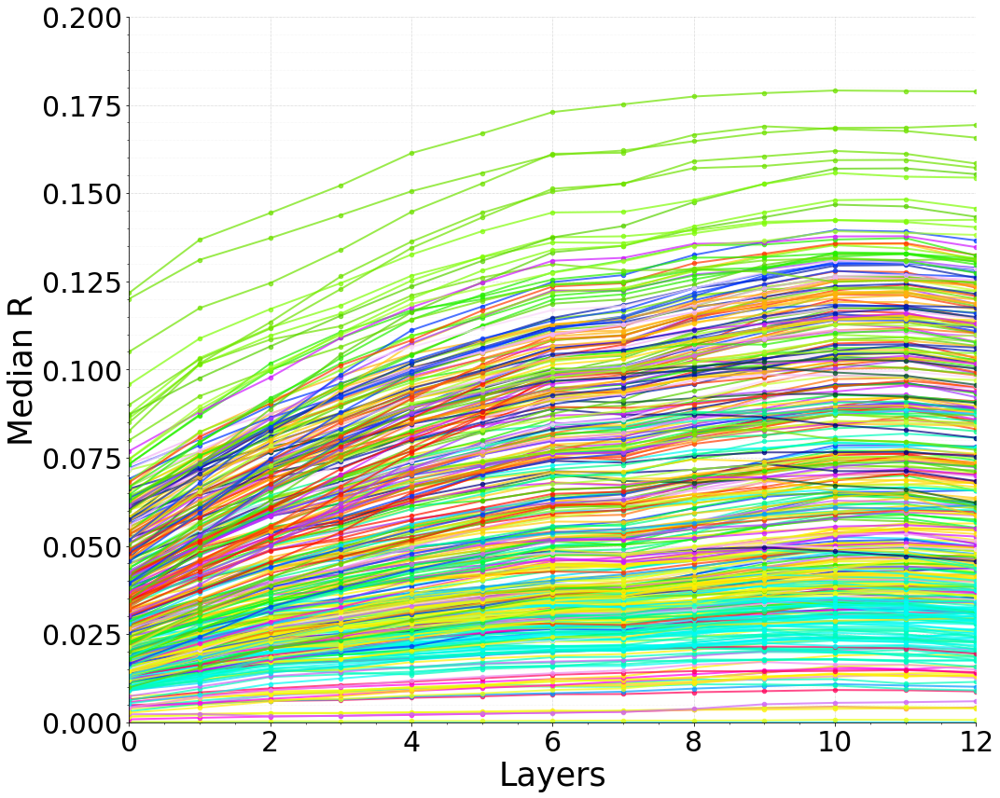

In [88]:
cmap = plt.cm.gist_ncar

highlight_nb = 1
networks = all_networks

length = len(networks) + highlight_nb
indexes = np.arange(length)/length
indexes[0] = 1e-9
color_list = np.hstack([indexes[0:highlight_nb], indexes[-len(networks)+highlight_nb:]])

y_limit = (0, 0.20)
x_limit = (0, 12)
labelsize = 30
fontsize = 35
data = median[:, :13]
roi_filter = labels
X = np.arange(13)
plot_legend = False
ylabel='Median R'
xlabel='Layers'
plot_name = 'bert_layer_performance_atlas'
save_folder=None #'/neurospin/unicog/protocols/IRMf/LePetitPrince_Pallier_2018/LePetitPrince/derivatives/fMRI/comparison/english/'

data_filtered = []
# For syntactic ROIs
legends = []
for name in roi_filter:
    if name in labels:
        data_filtered.append(data[labels.index(name), :])
        legends.append(name)
data = np.vstack(data_filtered)

plt.figure(figsize=(15,12)) # (7.6,12)
ax = plt.axes()

order = np.argsort(np.mean(data, axis=1)) 

#legends = [surnames[legends[i]] for i in order]

data = data[order, :]

colormap = plt.cm.coolwarm # gist_heat, coolwarm  
colors_ = [colormap(i) for i in np.linspace(0, 1, data.shape[0] + 1)]

for col in range(data.shape[0]):
    color = colors_[col]
    linewidth = 2
    linestyle = '-'
    if (filter_out is None) or (labels[order[col]] not in filter_out):
        index = 0
        while index < len(networks):
            if labels[order[col]] in networks[index]:
                color = cmap(color_list[index])
                index = len(networks)
            index += 1
        plt.plot(X, data[col, :], linestyle=linestyle, alpha=0.7, marker='.', markersize=9, color=color, linewidth=linewidth, label=legends[col])
plt.ylabel(ylabel, fontsize=fontsize)
plt.xlabel(xlabel, fontsize=fontsize)
plt.ylim(y_limit)
plt.xlim(x_limit)

plt.minorticks_on()
ax.tick_params(axis='x', labelsize=labelsize, rotation=0)
ax.tick_params(axis='y', labelsize=labelsize)

ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
#ax.spines['bottom'].set_visible(False)
#ax.spines['left'].set_visible(False)

plt.grid(which='major', linestyle=':', linewidth='0.5', color='black', alpha=0.4, axis='y')
plt.grid(which='major', linestyle=':', linewidth='0.5', color='black', alpha=0.4, axis='x')
plt.grid(which='minor', linestyle=':', linewidth='0.5', color='black', alpha=0.1, axis='y')

if plot_legend:
    plt.legend(ncol=3, bbox_to_anchor=(0,0,1,1), fontsize=10)

plt.tight_layout()

if save_folder is not None:
    plt.savefig(os.path.join(save_folder, plot_name + '.png'))
plt.show()



## GPT-2 layer-wise analysis

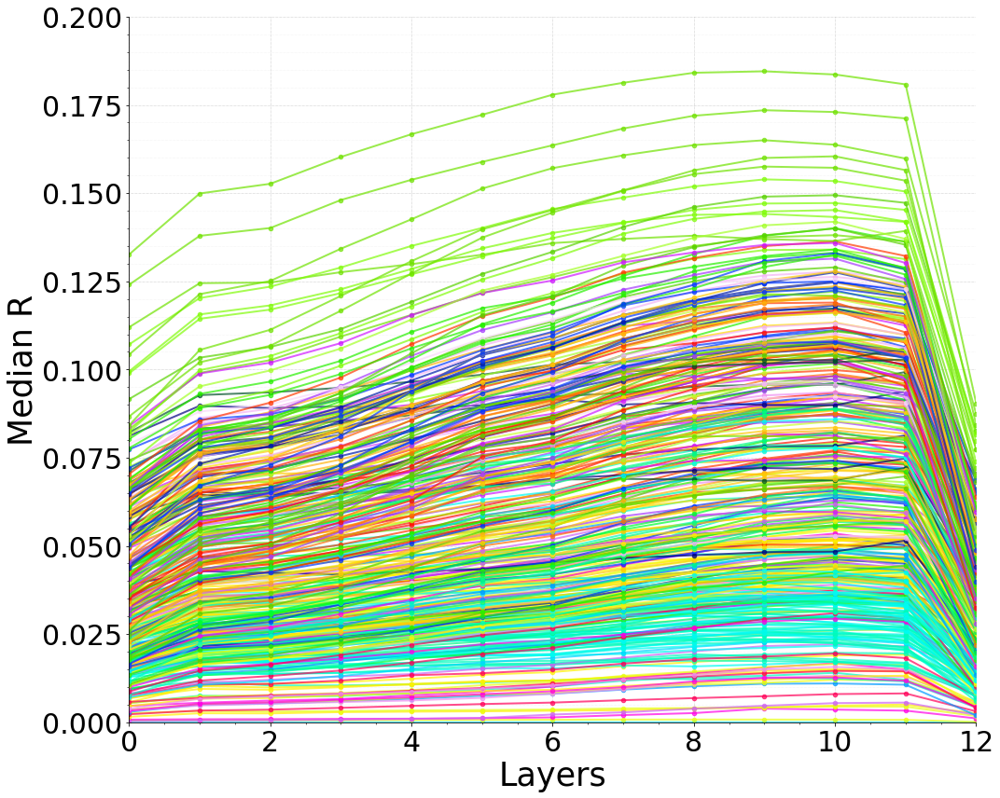

In [89]:
cmap = plt.cm.gist_ncar
length = len(networks) + highlight_nb
indexes = np.arange(length)/length
indexes[0] = 1e-9
color_list = np.hstack([indexes[0:highlight_nb], indexes[-len(networks)+highlight_nb:]])

y_limit = (0, 0.20)
x_limit = (0, 12)
fontsize = 35
labelsize = 30
data = median[:, 13:]
roi_filter = labels
X = np.arange(13)
plot_legend = False
ylabel='Median R'
xlabel='Layers'
plot_name='gpt2_layer_performance_atlas_schaefer'
save_folder = None#'/neurospin/unicog/protocols/IRMf/LePetitPrince_Pallier_2018/LePetitPrince/derivatives/fMRI/comparison/english/'

data_filtered = []
# For syntactic ROIs
legends = []
for name in roi_filter:
    if name in labels:
        data_filtered.append(data[labels.index(name), :])
        legends.append(name)
data = np.vstack(data_filtered)

plt.figure(figsize=(15,12)) # (7.6,12)
ax = plt.axes()
#order = np.argsort(np.mean(data, axis=1)) 

#legends = [surnames[legends[i]] for i in order]

data = data[order, :]

colormap = plt.cm.coolwarm # gist_heat, coolwarm  
colors_ = [colormap(i) for i in np.linspace(0, 1, data.shape[0] + 1)]


for col in range(data.shape[0]):
    color = colors_[col]
    linewidth = 2
    linestyle = '-'
    if (filter_out is None) or (labels[order[col]] not in filter_out):
        index = 0
        while index < len(networks):
            if labels[order[col]] in networks[index]:
                color = cmap(color_list[index])
                index = len(networks)
            index += 1
        plt.plot(X, data[col, :], linestyle=linestyle, alpha=0.7, marker='.', markersize=9, color=color, linewidth=linewidth, label=legends[col])
plt.ylabel(ylabel, fontsize=fontsize)
plt.xlabel(xlabel, fontsize=fontsize)
plt.ylim(y_limit)
plt.xlim(x_limit)


plt.minorticks_on()
ax.tick_params(axis='x', labelsize=labelsize, rotation=0)
ax.tick_params(axis='y', labelsize=labelsize)

ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
#ax.spines['bottom'].set_visible(False)
#ax.spines['left'].set_visible(False)

plt.grid(which='major', linestyle=':', linewidth='0.5', color='black', alpha=0.4, axis='y')
plt.grid(which='major', linestyle=':', linewidth='0.5', color='black', alpha=0.4, axis='x')
plt.grid(which='minor', linestyle=':', linewidth='0.5', color='black', alpha=0.1, axis='y')

if plot_legend:
    plt.legend(legends, ncol=3, bbox_to_anchor=(0,0,1,1), fontsize=10)

plt.tight_layout()

if save_folder is not None:
    plt.savefig(os.path.join(save_folder, plot_name + '.png'))
plt.show()



In [90]:
median_bert = median[:, :13]
median_gpt2 = median[:, 13:]
n_components = 5

SEED = 1111
pca_bert = PCA(n_components=n_components, random_state=SEED)
bert_transformed = pca_bert.fit_transform(median_bert)

pca_gpt2 = PCA(n_components=n_components, random_state=SEED)
gpt2_transformed = pca_gpt2.fit_transform(median_gpt2)


In [91]:
pca_bert.components_[0, :] = 0
pca_gpt2.components_[0, :] = 0

In [92]:
bert_without_first_component = pca_bert.inverse_transform(bert_transformed)

gpt2_without_first_component = pca_gpt2.inverse_transform(gpt2_transformed)

In [96]:
def layer_plot(data, X = np.arange(13),
                order=None,
                labels=labels,
                networks=all_networks,
                filter_out=None,
                plot_legend = False,
                ylabel='Median R',
                xlabel='Layers',
                y_limit = (0, 0.20),
                x_limit = (0, 12),
                plot_name='gpt2_layer_performance_atlas_schaefer',
                save_folder = '/Users/alexpsq/Desktop/Figures/PAPER-ALEX-1/pretty_plots',
                plot=True,
                figure=None,
                ax=None,
                title='',
                cmap=plt.cm.gist_ncar,
):
    
    fontsize = 35
    labelsize = 30
    length = len(networks) + highlight_nb
    indexes = np.arange(length)/length
    indexes[0] = 1e-9
    color_list = np.hstack([indexes[0:highlight_nb], indexes[-len(networks)+highlight_nb:]])


    data_filtered = []
    legends = []
    for name in labels:
        data_filtered.append(data[labels.index(name), :])
        legends.append(name)
    data = np.vstack(data_filtered)

    if ax is None:
        plt.figure(figsize=(15,12)) # (7.6,12)
        ax = plt.axes()
    if order is None:
        order = np.argsort(np.mean(data, axis=1)) 


    data = data[order, :]

    colormap = plt.cm.coolwarm # gist_heat, coolwarm  
    colors_ = [colormap(i) for i in np.linspace(0, 1, data.shape[0] + 1)]

    for col in range(data.shape[0]):
        color = colors_[col]
        linewidth = 2
        linestyle = '-'
        if (filter_out is None) or (labels[order[col]] not in filter_out):
            index = 0
            while index < len(networks):
                if labels[order[col]] in networks[index]:
                    color = cmap(color_list[index])
                    index = len(networks)
                index += 1
            ax.plot(X, data[col, :], linestyle=linestyle, alpha=0.7, marker='.', markersize=9, color=color, linewidth=linewidth, label=legends[col])

    ax.set_ylabel(ylabel, fontsize=fontsize)
    ax.set_xlabel(xlabel, fontsize=fontsize)
    ax.set_ylim(y_limit)
    ax.set_xlim(x_limit)
    ax.set_title(title, fontsize=30)

    ax.minorticks_on()
    ax.tick_params(axis='x', labelsize=labelsize, rotation=0)
    ax.tick_params(axis='y', labelsize=labelsize)

    ax.spines['top'].set_visible(False)
    ax.spines['right'].set_visible(False)
    #ax.spines['bottom'].set_visible(False)
    #ax.spines['left'].set_visible(False)

    ax.grid(which='major', linestyle=':', linewidth='0.5', color='black', alpha=0.4, axis='y')
    ax.grid(which='major', linestyle=':', linewidth='0.5', color='black', alpha=0.4, axis='x')
    ax.grid(which='minor', linestyle=':', linewidth='0.5', color='black', alpha=0.1, axis='y')

    #if plot_legend:
    #    plt.legend(legends, ncol=3, bbox_to_anchor=(0,0,1,1), fontsize=10)

    if save_folder is not None:
        plt.savefig(os.path.join(save_folder, plot_name + '.png'))
    if plot:
        plt.tight_layout()
        plt.show()
    
    return order


def average_plot(data, 
                 X=np.arange(13),
                 labels=labels,
                 networks=all_networks,
                 network_names=all_network_names,
                 filter_out=None,
                 plot_legend = False,
                 ylabel='Median R',
                 xlabel='Layers',
                 y_limit = (0, 0.20),
                 x_limit = (0, 12),
                 plot_name='gpt2_layer_performance_atlas_schaefer',
                 save_folder ='/Users/alexpsq/Desktop/Figures/PAPER-ALEX-1/pretty_plots',
                 plot=True,
                 figure=None,
                 ax=None,
                 title='',
                 cmap=plt.cm.gist_ncar,
):
    
    fontsize = 35
    labelsize = 30
    length = len(networks) + highlight_nb
    indexes = np.arange(length)/length
    indexes[0] = 1e-9
    color_list = np.hstack([indexes[0:highlight_nb], indexes[-len(networks)+highlight_nb:]])

    
    if ax is None:
        plt.figure(figsize=(15,12)) # (7.6,12)
        ax = plt.axes()
        
    vmin = np.min(data) 
    vmax = np.max(data) 
    vmin = vmin-(vmax-vmin)/20
    vmax = vmax+(vmax-vmin)/20

    for index_network, network in enumerate(networks):
        filter_out = filter_out if filter_out is not None else []
        mask = np.array([labels.index(roi) for roi in network if roi not in filter_out])
        if len(mask)!=0:
            data_tmp = data[mask]
            plt.errorbar(X, np.mean(data_tmp, axis=0), yerr=np.std(data_tmp, axis=0)/np.sqrt(data_tmp.shape[0]), color=cmap(color_list[index_network]), label=network_names[index_network], linewidth=2)

    index_network = 0
    network = networks[0]
    filter_out = filter_out if filter_out is not None else []
    mask = np.array([labels.index(roi) for roi in network if roi not in filter_out])
    if len(mask)!=0:
        data_tmp = data[mask]
        plt.errorbar(X, np.mean(data_tmp, axis=0), yerr=np.std(data_tmp, axis=0)/np.sqrt(data_tmp.shape[0]), color=cmap(color_list[index_network]), label=network_names[index_network], linewidth=2)
    
    ax.set_ylabel(ylabel, fontsize=fontsize)
    ax.set_xlabel(xlabel, fontsize=fontsize)
    ax.set_ylim(y_limit)
    ax.set_xlim(x_limit)
    ax.set_title(title, fontsize=30)

    ax.minorticks_on()
    ax.tick_params(axis='x', labelsize=labelsize, rotation=0)
    ax.tick_params(axis='y', labelsize=labelsize)

    ax.spines['top'].set_visible(False)
    ax.spines['right'].set_visible(False)
    #ax.spines['bottom'].set_visible(False)
    #ax.spines['left'].set_visible(False)

    ax.grid(which='major', linestyle=':', linewidth='0.5', color='black', alpha=0.4, axis='y')
    ax.grid(which='major', linestyle=':', linewidth='0.5', color='black', alpha=0.4, axis='x')
    ax.grid(which='minor', linestyle=':', linewidth='0.5', color='black', alpha=0.1, axis='y')

    if save_folder is not None:
        plt.savefig(os.path.join(save_folder, plot_name + '.png'))
    if plot:
        plt.tight_layout()
        plt.show()
    

def extract_component(X, keep_component=None, remove_component=None, n_components=5, filter_out=None, labels=labels):
    if filter_out is not None:
        original_shape = X.shape
        result = np.zeros(original_shape)
        indexes_mask = np.array([(item not in filter_out) for item in labels])
        X = X[indexes_mask]
    pca = PCA(n_components=n_components, random_state=SEED)
    X_transformed = pca.fit_transform(X)
    if keep_component is not None:
        tmp = pca.components_[keep_component, :]
        pca.components_ = np.zeros(pca.components_.shape)
        pca.components_[keep_component, :] = tmp
    elif remove_component is not None:
        pca.components_[remove_component, :] = 0
    component_reconstructed = pca.inverse_transform(X_transformed)
    if filter_out is not None:
        result[indexes_mask] = component_reconstructed
    else:
        result = component_reconstructed
    return result



In [49]:


order = layer_plot(median_bert, X = np.arange(13),
                order=None,
                labels = labels,
                highlight=highlight,
                filter_out=filter_out,
                plot_legend = False,
                ylabel='Median R',
                xlabel='Layers',
                y_limit = None,
                x_limit = (0, 12),
                plot_name='bert_layer_performance',
)
#_ = layer_plot(bert_without_first_component, X = np.arange(13),
#                order=order,
#                labels = labels,
#                highlight=highlight,
#                filter_out=filter_out,
#                plot_legend = False,
#                ylabel='Median R',
#                xlabel='Layers',
#                y_limit = None,
#                x_limit = (0, 12),
#                plot_name='reconstructed_bert_without_first_component_layer_performance',
#              )
#_ = layer_plot(median_gpt2, X = np.arange(13),
#                order=order,
#                labels = labels,
#                highlight=highlight,
#                filter_out=filter_out,
#                plot_legend = False,
#                ylabel='Median R',
#                xlabel='Layers',
#                y_limit = None,
#                x_limit = (0, 12),
#                plot_name='gpt2_layer_performance',
#)
#_ = layer_plot(gpt2_without_first_component, X = np.arange(13),
#                order=order,
#                labels = labels,
#                highlight=highlight,
#                filter_out=filter_out,
#                plot_legend = False,
#                ylabel='Median R',
#                xlabel='Layers',
#                y_limit = None,
#                x_limit = (0, 12),
#                plot_name='reconstructed_gpt2_without_first_component_layer_performance',
#              )

TypeError: layer_plot() got an unexpected keyword argument 'highlight'

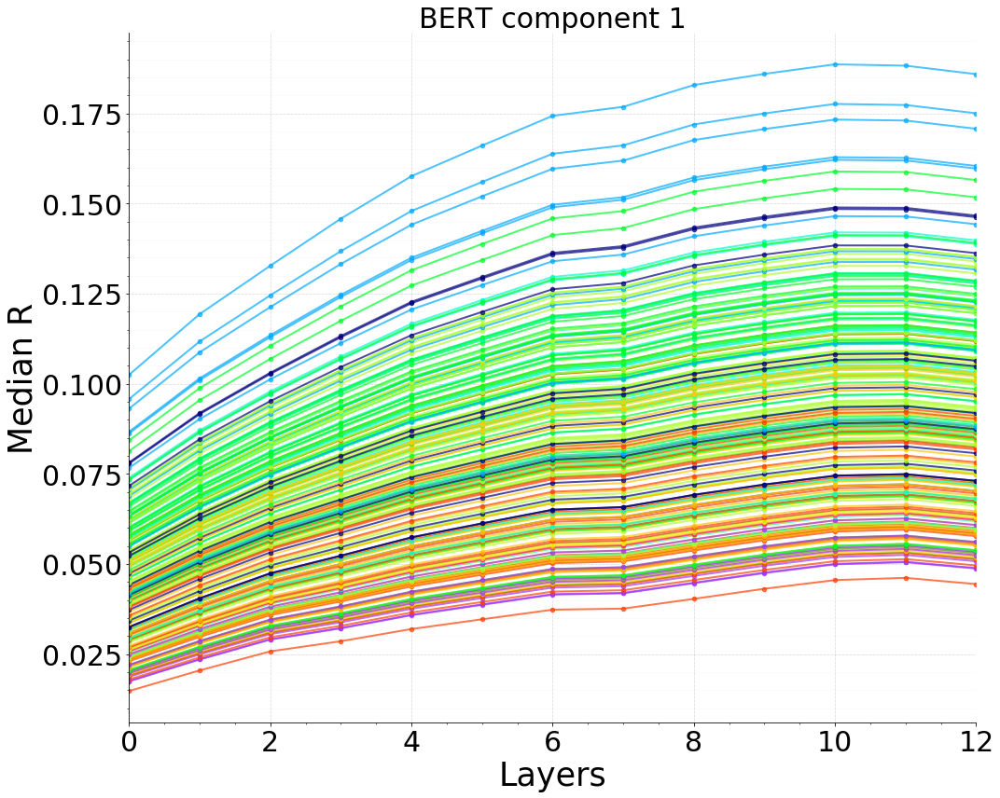

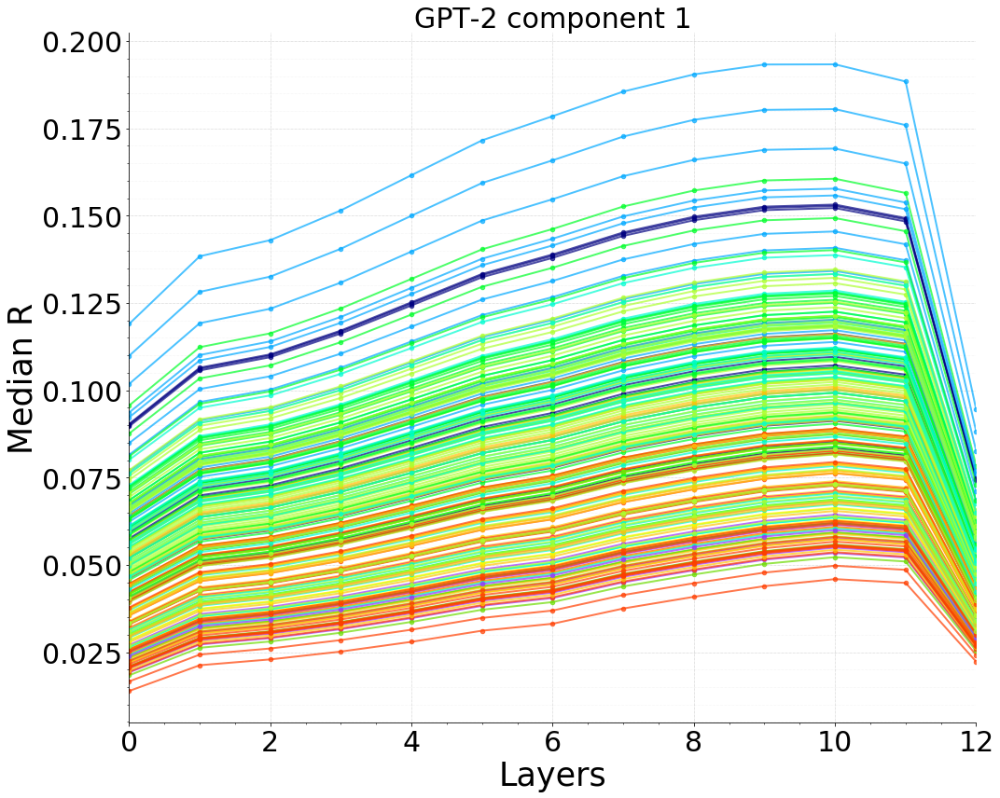

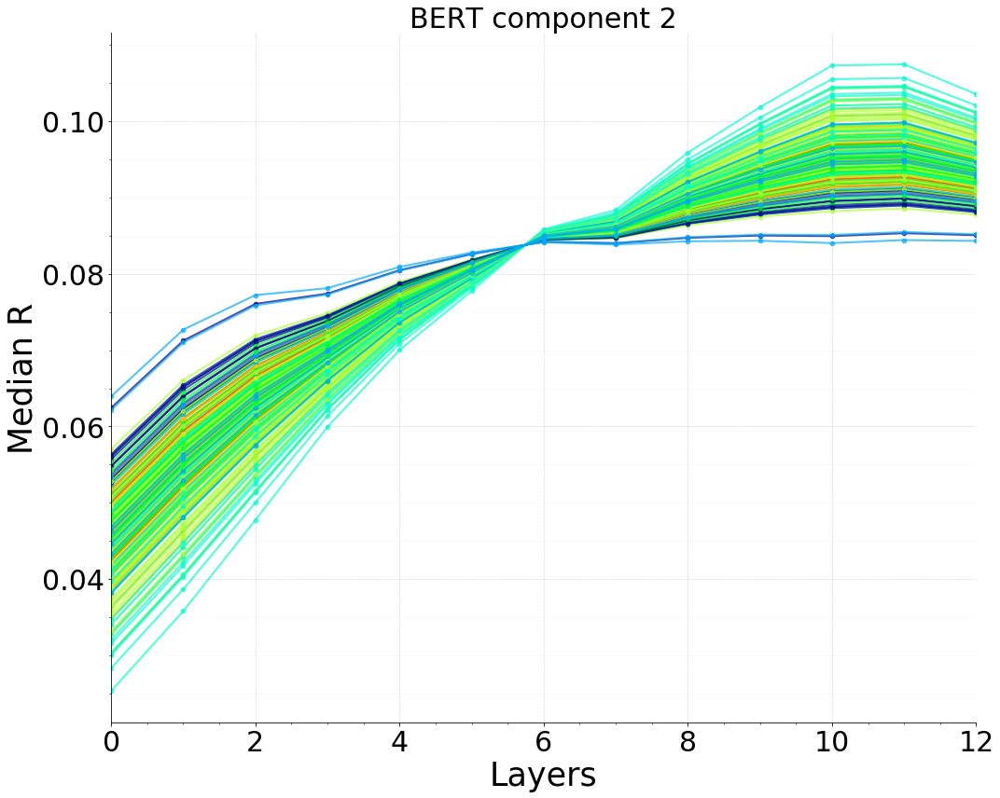

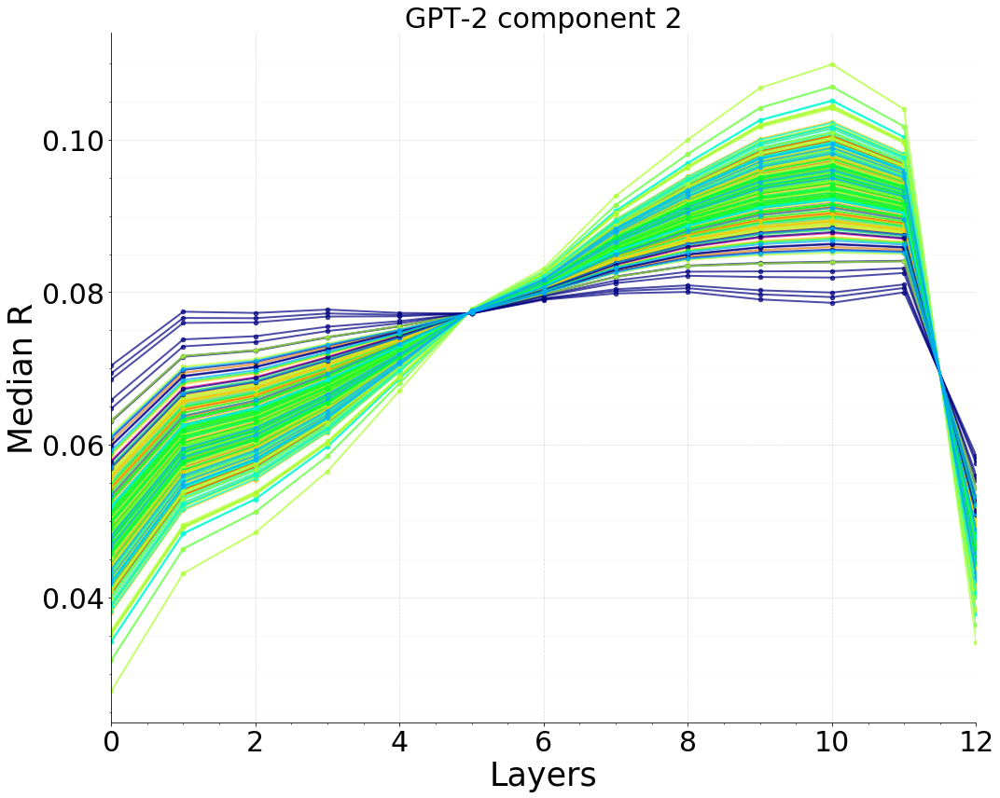

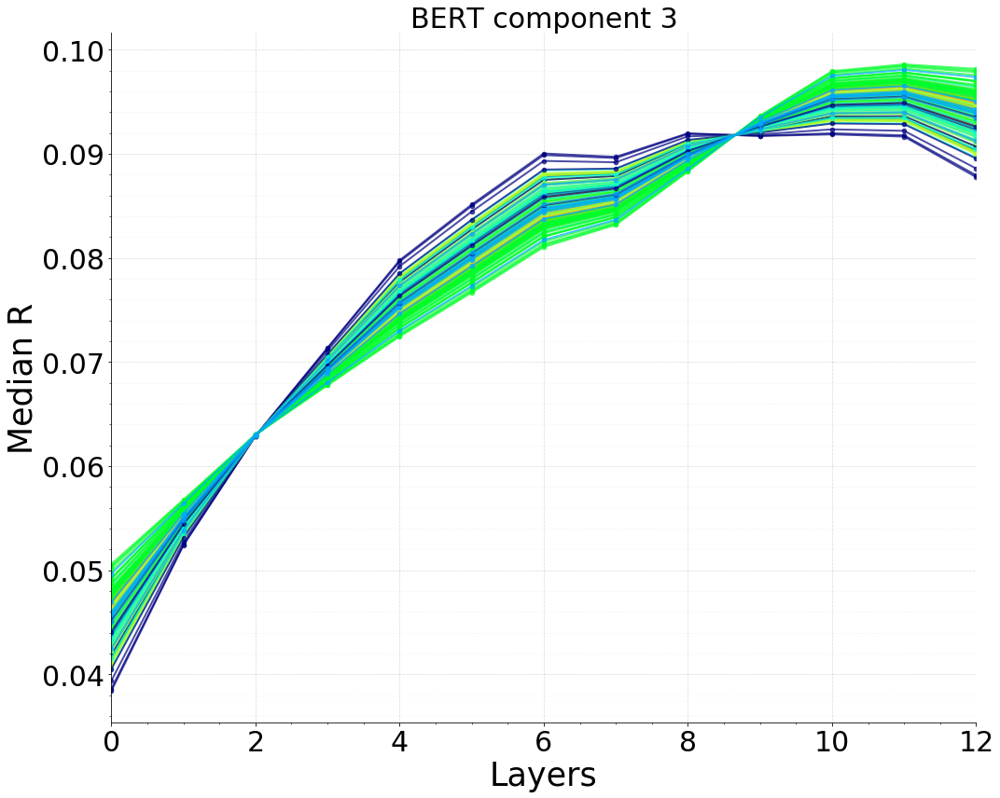

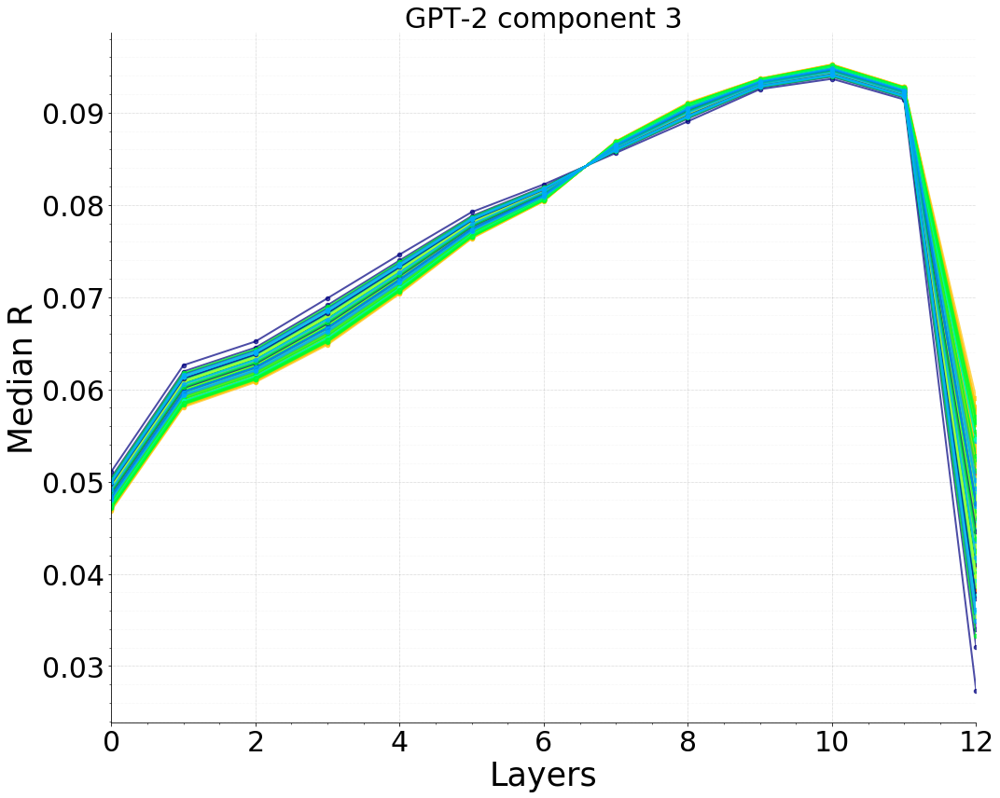

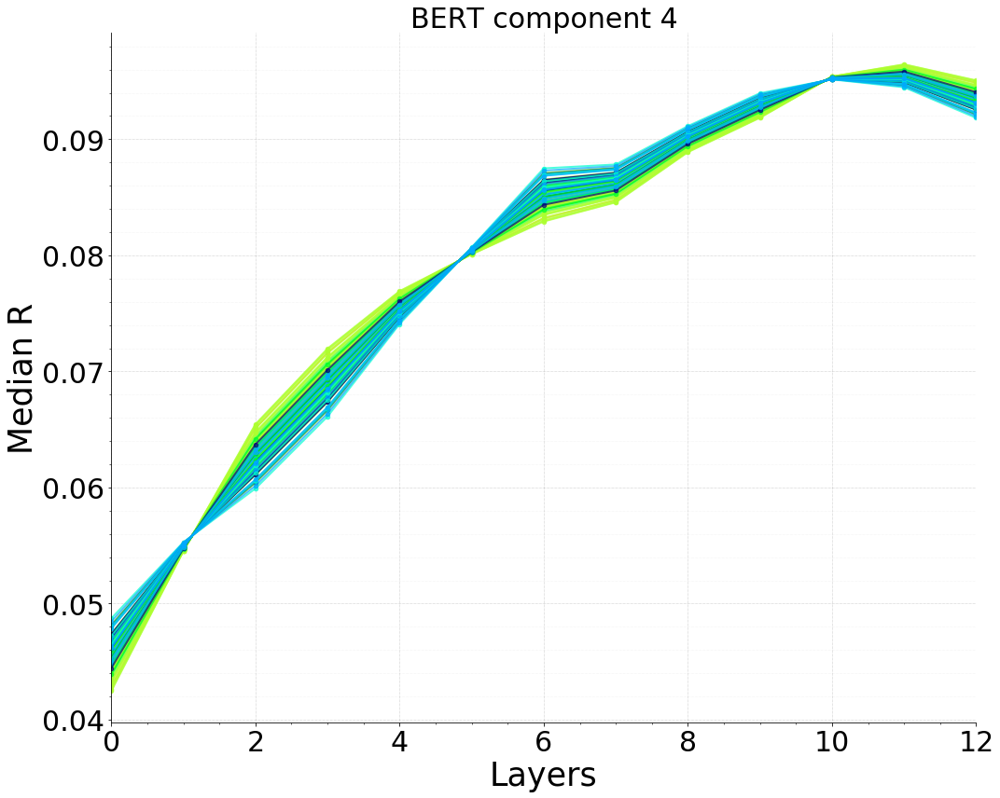

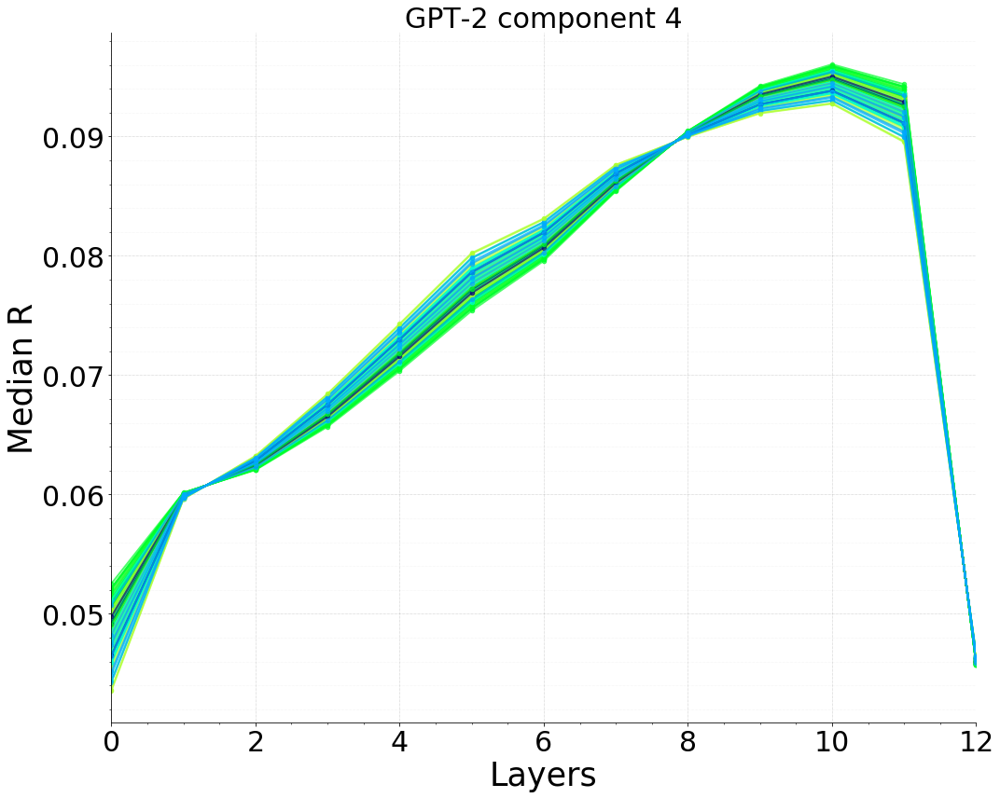

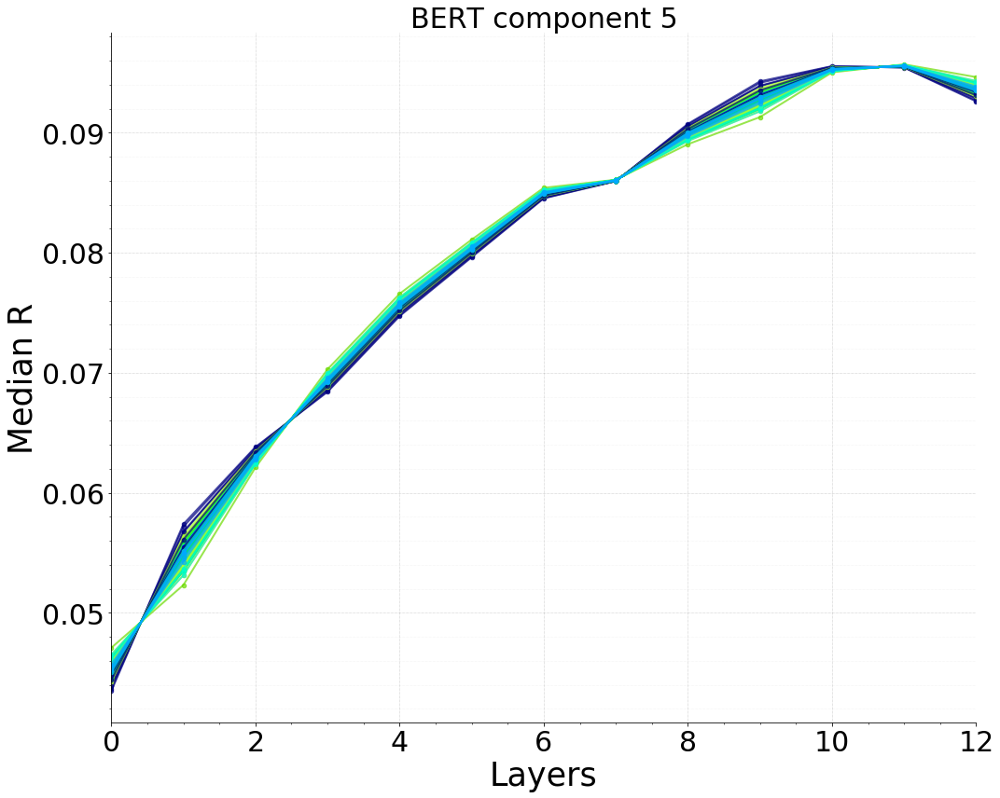

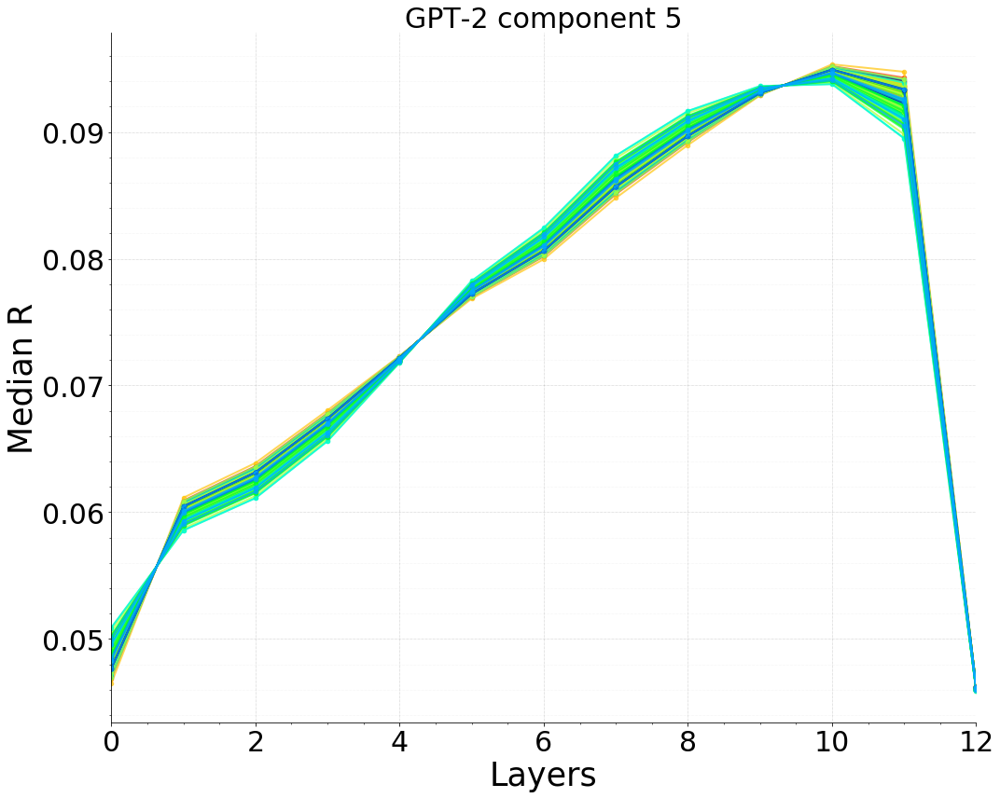

In [76]:
for i in range(5):
    
    _ = layer_plot(extract_component(median_bert, keep_component=i, n_components=5, filter_out=filter_out, labels=labels), 
                    X = np.arange(13),
                    order=order,
                    labels = labels,
                    highlight=highlight,
                    filter_out=filter_out,
                    plot_legend = False,
                    ylabel='Median R',
                    xlabel='Layers',
                    y_limit = None,
                    x_limit = (0, 12),
                    plot_name=f'bert_layer_performance_component-{i+1}',
                    title=f'BERT component {i+1}'
    )
    _ = layer_plot(extract_component(median_gpt2, keep_component=i, n_components=5, filter_out=filter_out, labels=labels), 
                    X = np.arange(13),
                    order=order,
                    labels = labels,
                    highlight=highlight,
                    filter_out=filter_out,
                    plot_legend = False,
                    ylabel='Median R',
                    xlabel='Layers',
                    y_limit = None,
                    x_limit = (0, 12),
                    plot_name=f'gpt2_layer_performance_component-{i+1}',
                    title=f'GPT-2 component {i+1}'
    )

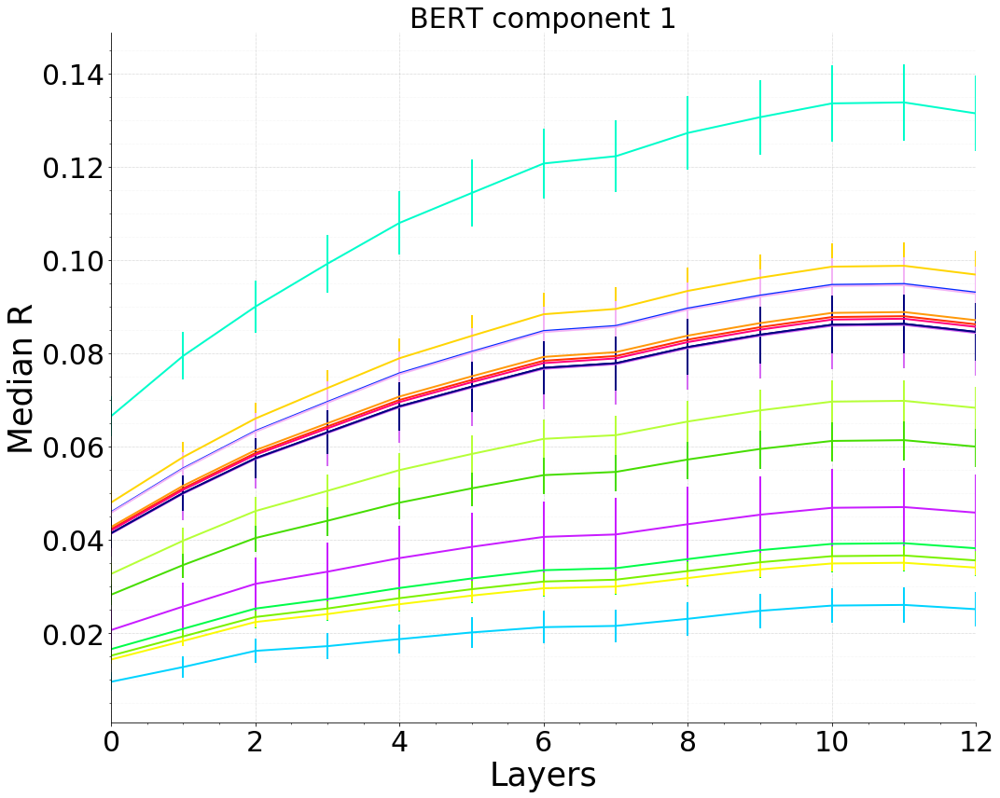

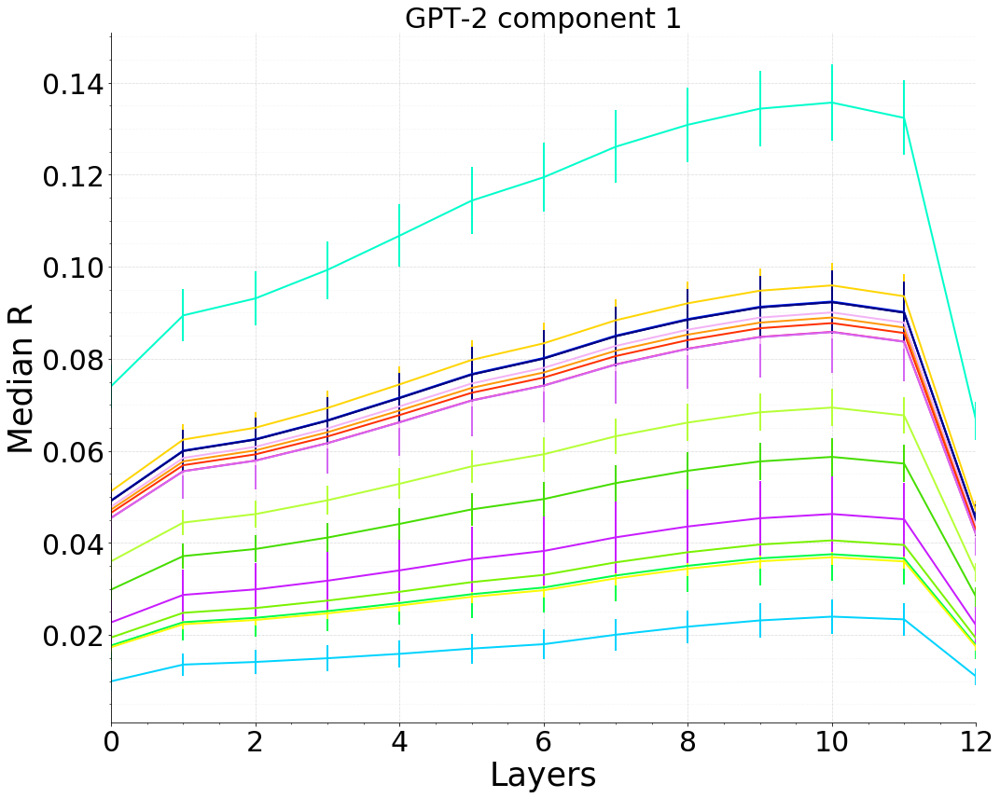

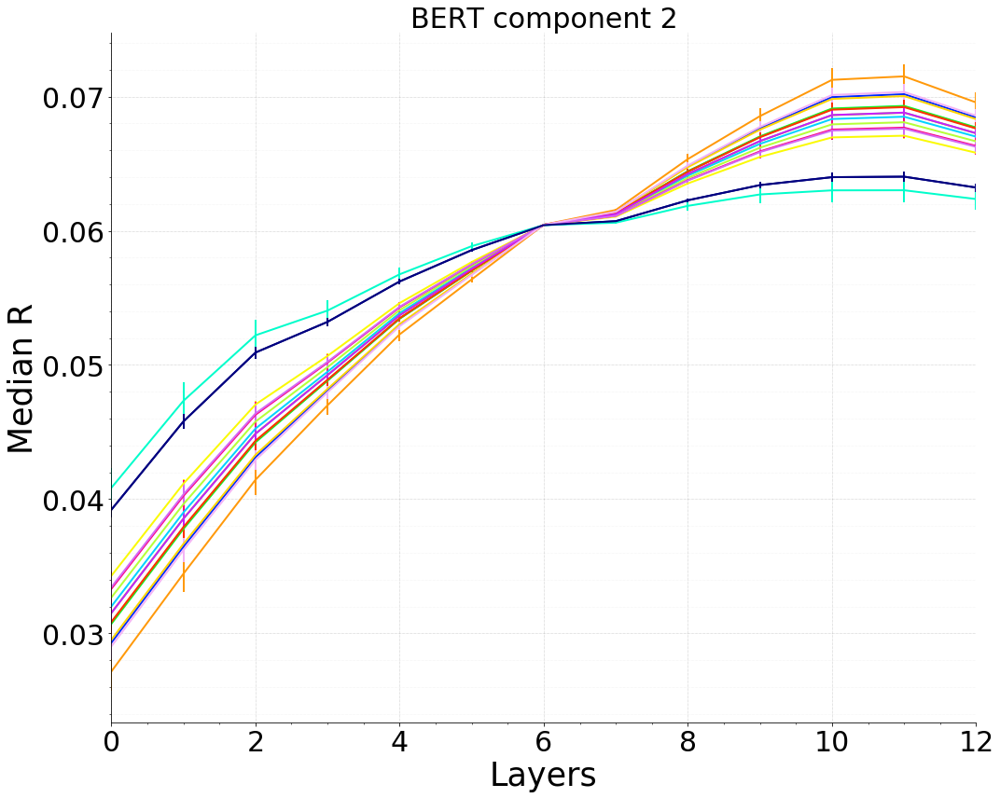

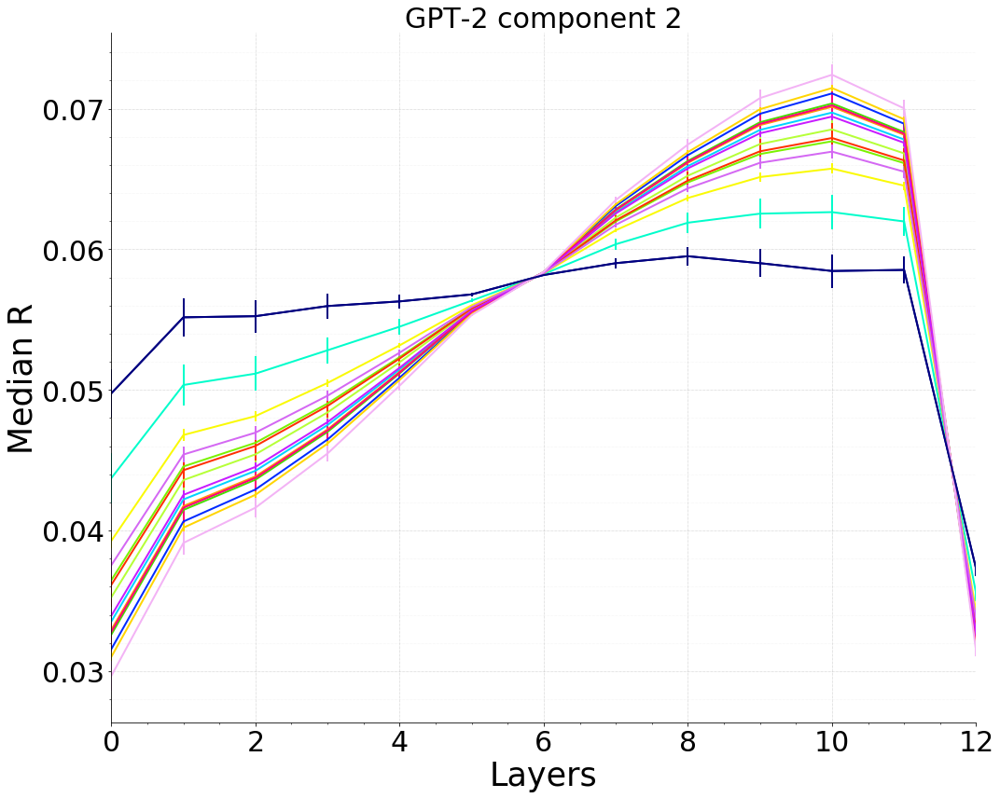

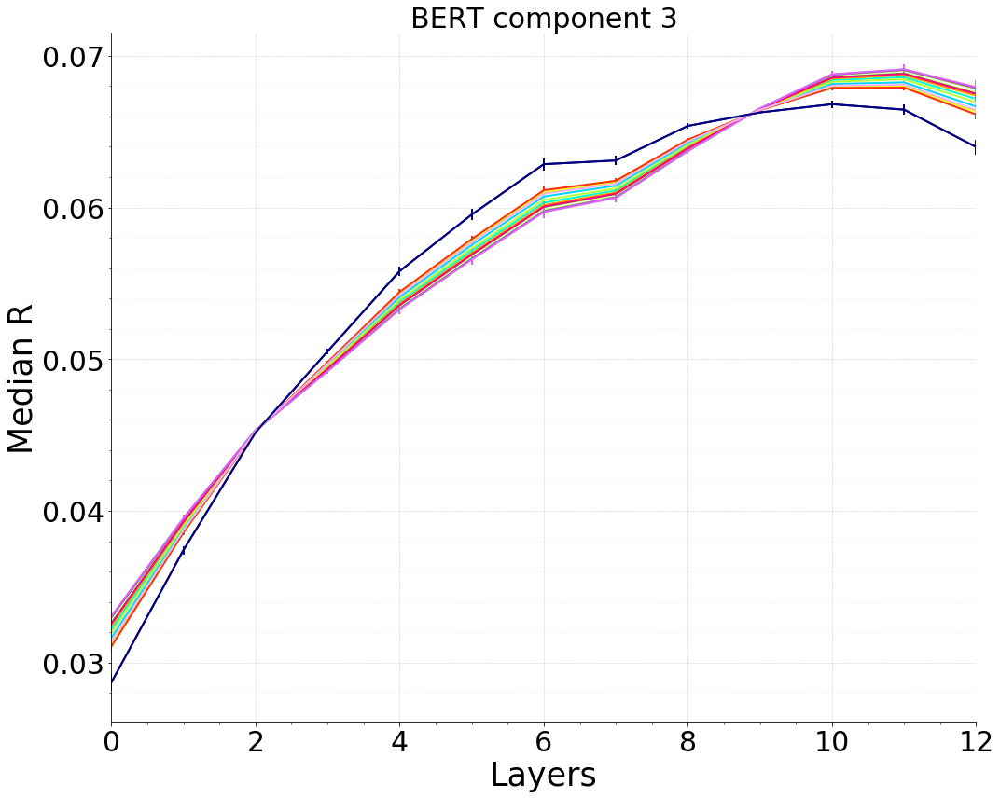

...

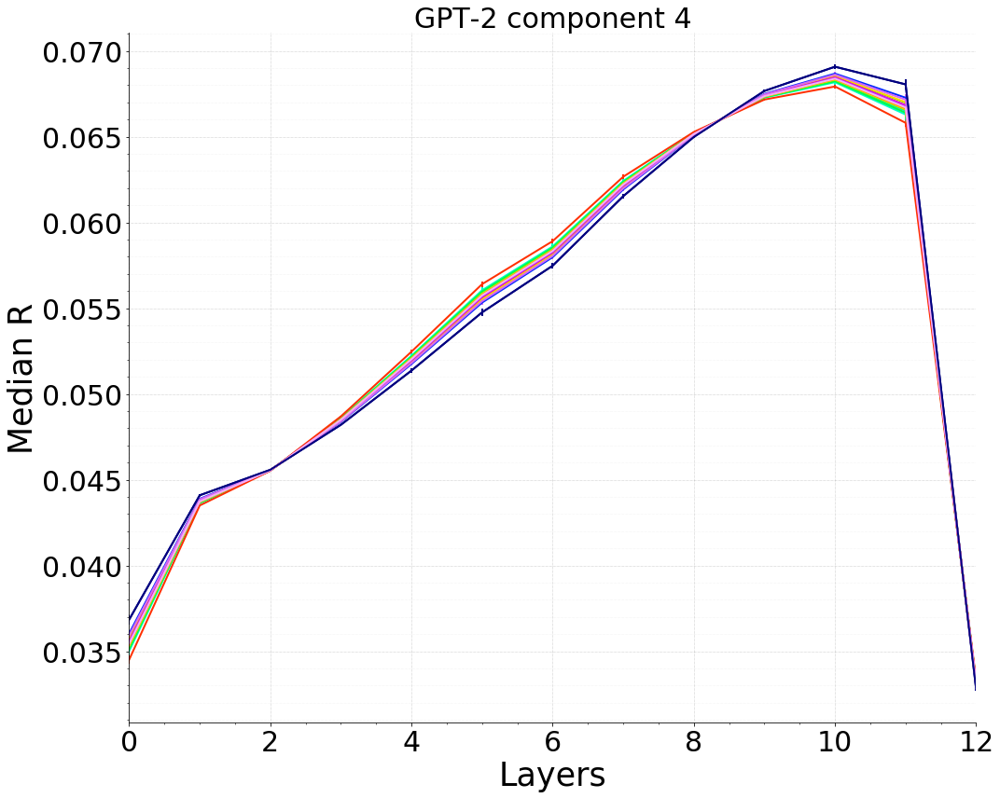

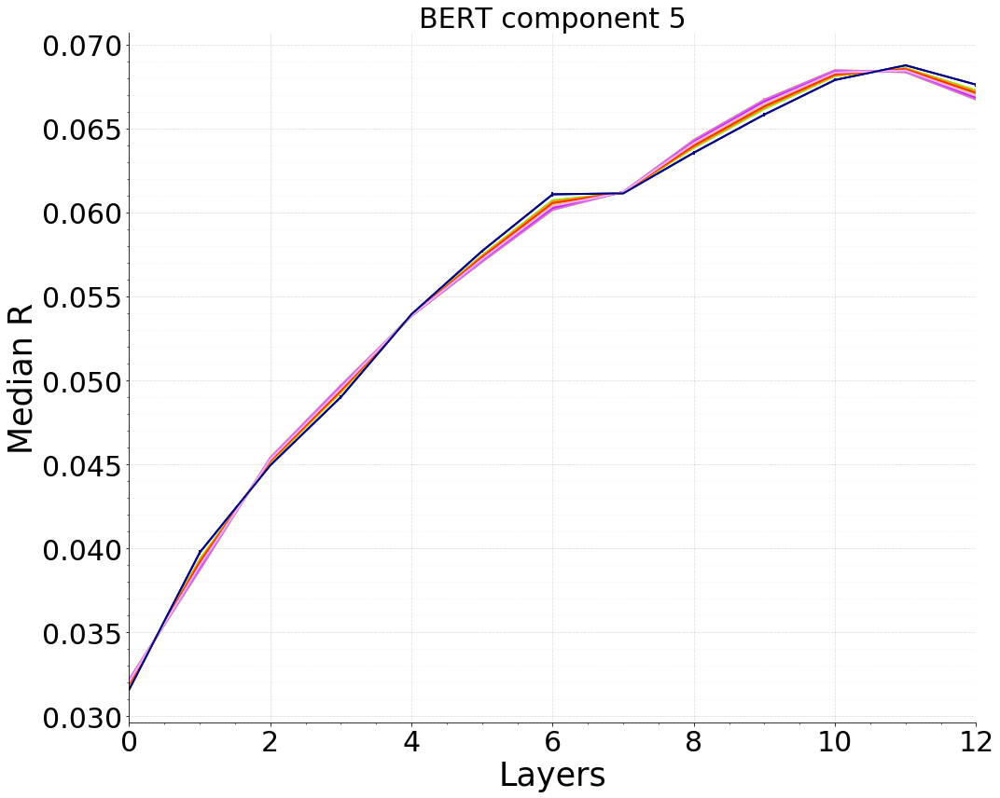

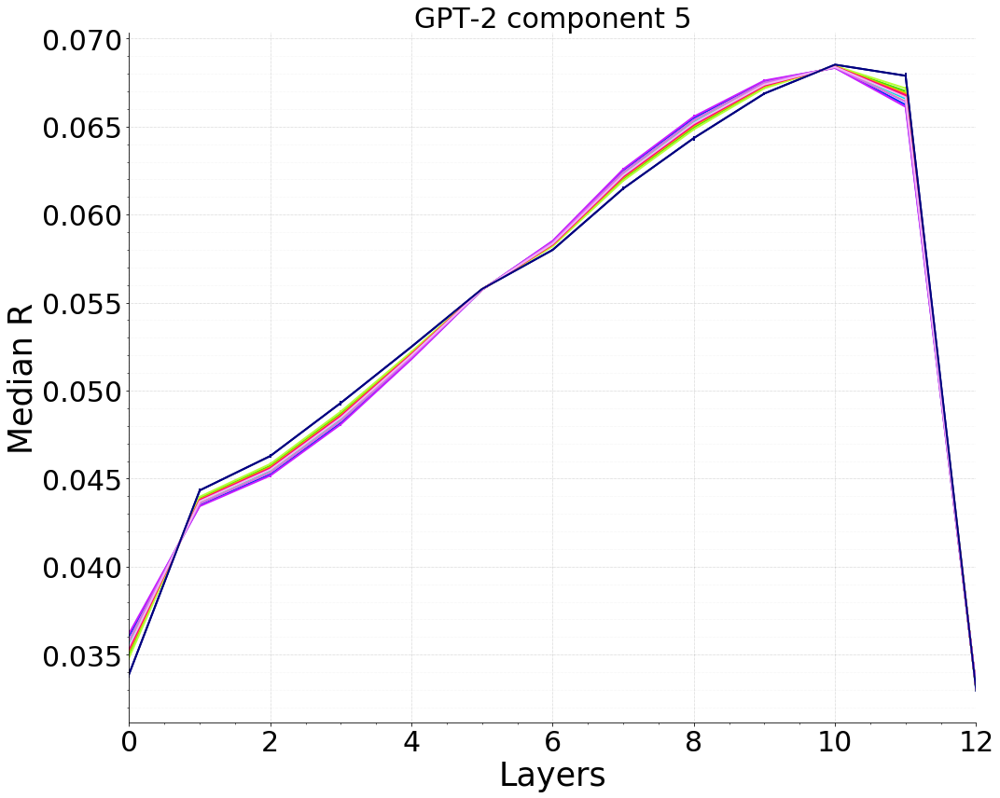

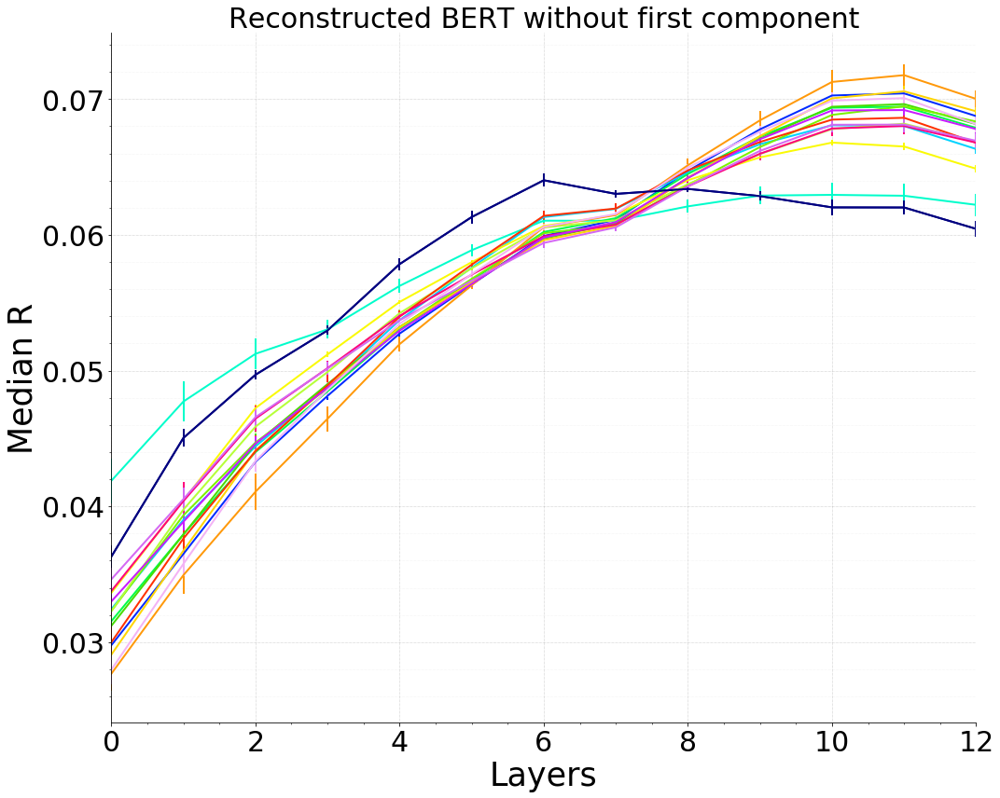

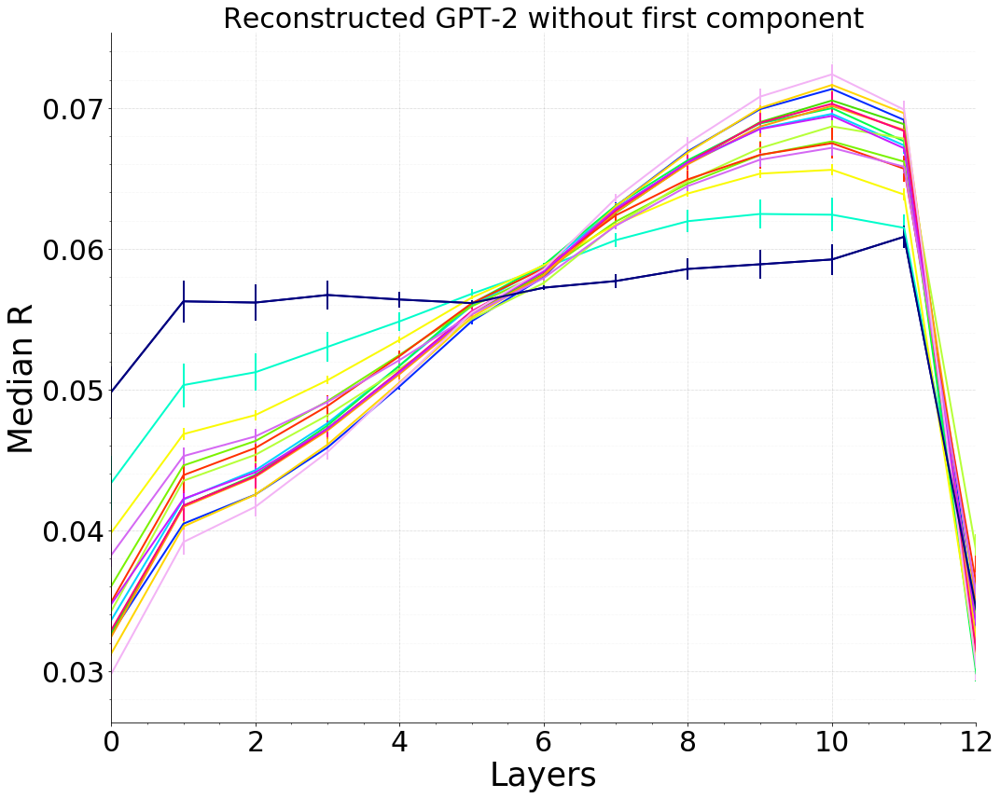

In [98]:

for i in range(5):
    
    average_plot(extract_component(median_bert, keep_component=i, n_components=5, filter_out=None, labels=labels), 
                    X = np.arange(13),
                    labels = labels,
                    networks=paired_networks,
                    network_names=paired_network_names,
                    filter_out=None, #np.array(list(filter_out)+list(motor)),
                    plot_legend = False,
                    ylabel='Median R',
                    xlabel='Layers',
                    y_limit = None,
                    x_limit = (0, 12),
                    plot_name=f'bert_layer_performance_component-{i+1}_paired',
                    title=f'BERT component {i+1}'
    )
    average_plot(extract_component(median_gpt2, keep_component=i, n_components=5, filter_out=None, labels=labels), 
                    X = np.arange(13),
                    labels = labels,
                    networks=paired_networks,
                    network_names=paired_network_names,
                    filter_out=None, #np.array(list(filter_out)+list(motor)),
                    plot_legend = False,
                    ylabel='Median R',
                    xlabel='Layers',
                    y_limit = None,
                    x_limit = (0, 12),
                    plot_name=f'gpt2_layer_performance_component-{i+1}_paired',
                    title=f'GPT-2 component {i+1}'
    )


average_plot(extract_component(median_bert, remove_component=0, n_components=5, filter_out=None, labels=labels),  
                X = np.arange(13),
                labels = labels,
                networks=paired_networks,
                network_names=paired_network_names,
                filter_out=None, #np.array(list(filter_out)+list(motor)),
                plot_legend = False,
                ylabel='Median R',
                xlabel='Layers',
                y_limit = None,
                x_limit = (0, 12),
                plot_name=f'reconstructed_bert_without-first-component-averaged-network_paired',
                title=f'Reconstructed BERT without first component'
)

average_plot(extract_component(median_gpt2, remove_component=0, n_components=5, filter_out=None, labels=labels), 
                X = np.arange(13),
                labels = labels,
                networks=paired_networks,
                network_names=paired_network_names,
                filter_out=None, #np.array(list(filter_out)+list(motor)),
                plot_legend = False,
                ylabel='Median R',
                xlabel='Layers',
                y_limit = None,
                x_limit = (0, 12),
                plot_name=f'reconstructed_gpt2_without-first-component-averaged-network_paired',
                title=f'Reconstructed GPT-2 without first component'
)


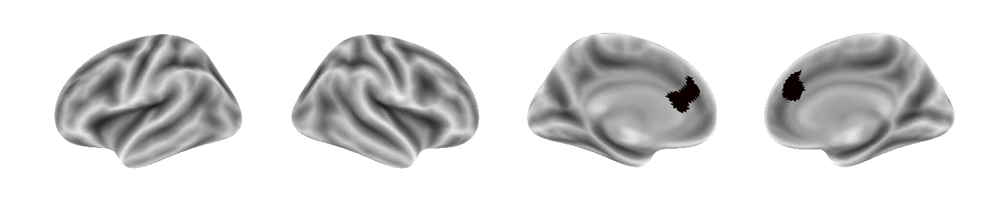

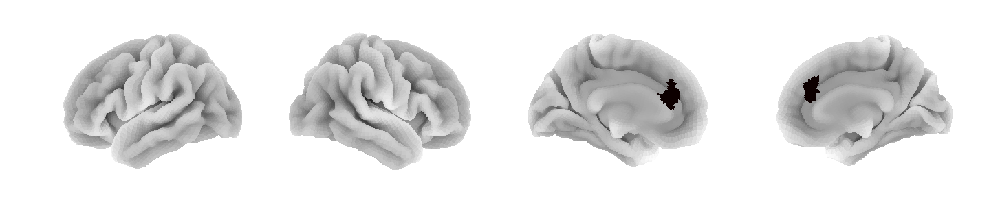

In [131]:
roi = [

]
masks, mask_img = multi_masker(atlas_maps, [labels.index(item) for item in roi], labels)

#plotting.plot_glass_brain(mask_img, display_mode='lzry')
#plotting.show()

multi_plot_horizontal(
        data_list=[mask_img], 
        mask_list=[None],
        plot_name='', 
        saving_path=None,
        return_plot=True, 
        inflated=True,
        suptitle=None, #'Significant Context effect in ROIs (in number of tokens)',
        vmax=2,
        cmap='cold_hot',
        colorbar=False,
        draw_cbar=False,
        symmetric_cbar=True,
        save_independently=False,
        categorical_values=True,
        **kwargs)

multi_plot_horizontal(
        data_list=[mask_img], 
        mask_list=[None],
        plot_name='', 
        saving_path=None,
        return_plot=True, 
        inflated=False,
        suptitle=None, #'Significant Context effect in ROIs (in number of tokens)',
        vmax=2,
        cmap='cold_hot',
        colorbar=False,
        draw_cbar=False,
        symmetric_cbar=True,
        save_independently=False,
        categorical_values=True,
        **kwargs)


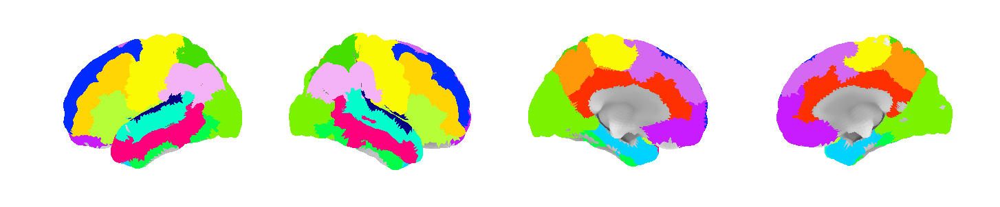

In [95]:
for path in [ '/Users/alexpsq/Code/data/LePetitPrince/paired_legend_anatomical_contrast_layers.nii.gz']:

    result_img = nib.load(path)
    multi_plot_horizontal(
            [result_img], #dilate_img(?)
            [None],
            plot_name='paired_legend', 
            saving_path='/Users/alexpsq/Desktop',
            save_independently=False,
            categorical_values=True,
            return_plot=True, 
            inflated=False,
            suptitle=None, #'Significant Context effect in ROIs (in number of tokens)',
            vmax=1,
            vmin=0,
            cmap='gist_ncar',
            draw_cbar=False,
            colorbar=False,
            kind='line',
            plot=True)



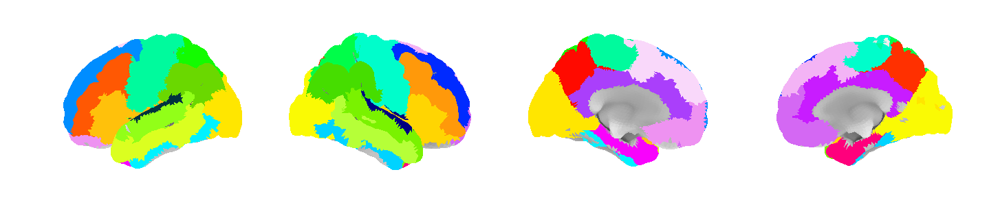

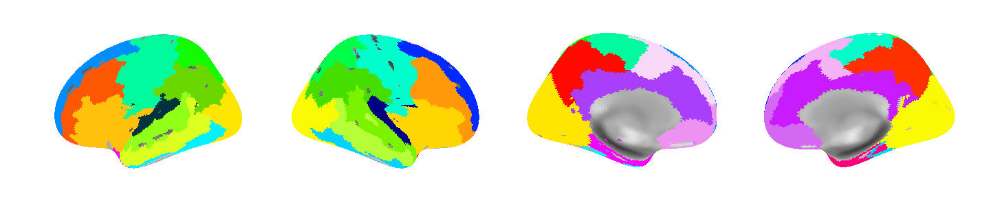

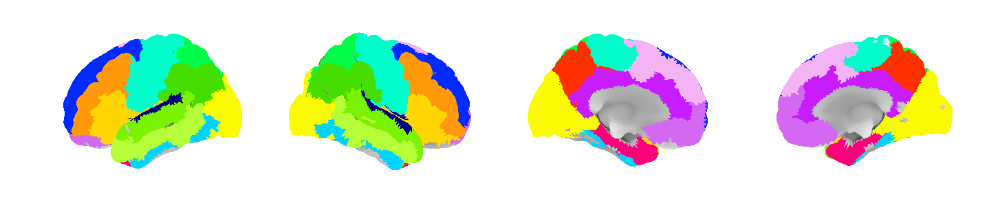

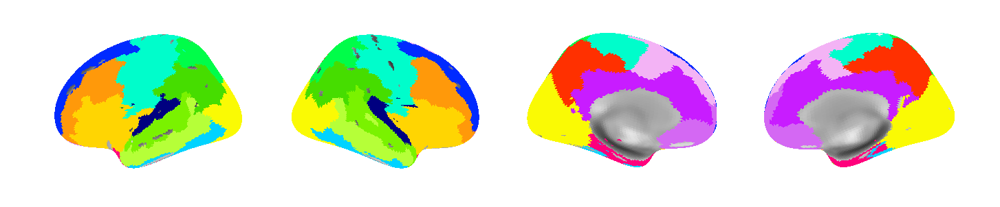

In [348]:
for path in ['/Users/alexpsq/Code/data/LePetitPrince/legend_anatomical_contrast_layers.nii.gz', '/Users/alexpsq/Code/data/LePetitPrince/paired_legend_anatomical_contrast_layers.nii.gz']:

    result_img = nib.load(path)
    multi_plot_horizontal(
            [result_img], #dilate_img(?)
            [None],
            plot_name='', 
            saving_path=None,
            save_independently=False,
            categorical_values=True,
            return_plot=True, 
            inflated=False,
            suptitle=None, #'Significant Context effect in ROIs (in number of tokens)',
            vmax=1,
            vmin=0,
            cmap='gist_ncar',
            draw_cbar=False,
            colorbar=False,
            kind='line',
            plot=True)


    multi_plot_horizontal(
                [result_img], #dilate_img(?)
                [None],
                plot_name='', 
                saving_path=None,
                save_independently=False,
                categorical_values=True,
                return_plot=True, 
                inflated=True,
                suptitle=None, #'Significant Context effect in ROIs (in number of tokens)',
                vmax=1,
                vmin=0,
                cmap='gist_ncar',
                draw_cbar=False,
                colorbar=False,
                kind='line',
                plot=True)

In [6]:
sub_names = ['sub-115', 'sub-114', 'sub-113', 'sub-110', 'sub-109', 'sub-108', 'sub-106', 'sub-105', 'sub-104', 'sub-103', 'sub-101', 'sub-100', 'sub-099', 'sub-098', 'sub-097', 'sub-096', 'sub-095', 'sub-094', 'sub-093', 'sub-092', 'sub-091', 'sub-089', 'sub-088', 'sub-087', 'sub-086', 'sub-084', 'sub-083', 'sub-082', 'sub-081', 'sub-080', 'sub-079', 'sub-078', 'sub-077', 'sub-076', 'sub-075', 'sub-074', 'sub-073', 'sub-072', 'sub-070', 'sub-069', 'sub-068', 'sub-067', 'sub-066', 'sub-065', 'sub-064', 'sub-063', 'sub-062', 'sub-061', 'sub-059', 'sub-058', 'sub-057',]

sub_ids = [115, 114, 113, 110, 109, 108, 106, 105, 104, 103, 101, 100, 99, 98, 97, 96, 95, 94, 93, 92, 91, 89, 88, 87, 86, 84, 83, 82, 81, 80, 79, 78, 77, 76, 75, 74, 73, 72, 70, 69, 68, 67, 66, 65, 64, 63, 62, 61, 59, 58, 57]

layers = np.arange(13)

In [41]:
model_names = [
    '/Users/alexpsq/Code/data/LePetitPrince/Pearson_maps/{sub_name}_gpt2_pre-20_1_norm-2_norm-None_temporal-shifting-0_{sub_id}_hidden-layer-{layer}_Pearson_coeff.nii.gz',
    '/Users/alexpsq/Code/data/LePetitPrince/Pearson_maps/{sub_name}_bert-base-uncased_pre-20_1_post-0_norm-2_norm-None_temporal-shifting-0_{sub_id}_hidden-layer-{layer}_Pearson_coeff.nii.gz',
]
data = []
for model in model_names:
    for sub_name, sub_id in zip(sub_names, sub_ids):
        for layer in layers:
            data.append([sub_name, layer, model.format(sub_name=sub_name, sub_id=sub_id, layer=layer)])
            
columns = ['sub_name', 'layer', 'model']
df = pd.DataFrame(data, columns=columns)


In [42]:
df

,sub_name,layer,model
0,sub-115,0,/Users/alexpsq/Code/data/LePetitPrince/Pearson...
1,sub-115,1,/Users/alexpsq/Code/data/LePetitPrince/Pearson...
2,sub-115,2,/Users/alexpsq/Code/data/LePetitPrince/Pearson...
3,sub-115,3,/Users/alexpsq/Code/data/LePetitPrince/Pearson...
4,sub-115,4,/Users/alexpsq/Code/data/LePetitPrince/Pearson...
...,...,...,...
1321,sub-057,8,/Users/alexpsq/Code/data/LePetitPrince/Pearson...
1322,sub-057,9,/Users/alexpsq/Code/data/LePetitPrince/Pearson...
1323,sub-057,10,/Users/alexpsq/Code/data/LePetitPrince/Pearson...
1324,sub-057,11,/Users/alexpsq/Code/data/LePetitPrince/Pearson...


In [62]:
median, third_quartile, maximum = fast_fit_per_roi(
    df['model'].values, 
    atlas_maps, 
    labels, 
    global_mask=DILATED_MASKER_PATH, 
    mask_img=None,
    PROJECT_PATH=ALL_MASKS_PATH
)


  0%|          | 0/400 [00:00<?, ?it/s]

	Looping through labeled masks...


100%|██████████| 400/400 [1:41:39<00:00, 15.25s/it]

		-->Done


In [64]:
print(median.shape)

(400, 1326)


In [67]:
data = []
index_model = 0
for model in model_names:
    model_type = 'gpt2' if 'gpt2' in model else 'bert'
    for sub_name, sub_id in zip(sub_names, sub_ids):
        for layer in layers:
            for roi_index in range(median.shape[0]):
                data.append([sub_name, layer, labels[roi_index], median[roi_index, index_model], model_type, model.format(sub_name=sub_name, sub_id=sub_id, layer=layer)])
            index_model += 1
            
columns = ['sub_name', 'layer', 'roi', 'median_R', 'model', 'path']
df = pd.DataFrame(data, columns=columns)

df.to_csv('/Users/alexpsq/Code/data/LePetitPrince/anova_depth_roi_interactions.csv')

In [70]:
anova_comparison = pd.read_csv('/Users/alexpsq/Code/data/LePetitPrince/anova_depth_roi_interactions.csv')

for model_type in np.unique(anova_comparison['model'].values):
    print(f"Anova: layer and ROI interaction for {model_type}")
    anova_tmp = anova_comparison[anova_comparison.model==model_type]
    anova_table_comparison = pg.rm_anova(data=anova_tmp, dv='median_R', within=['roi', 'layer'], subject='sub_name', correction=True)
    print(anova_table_comparison)
    print()

Anova: layer and ROI interaction for bert


/Applications/anaconda3/envs/parietal/lib/python3.7/site-packages/pingouin/distribution.py:464: UserWarning: Epsilon values might be innaccurate in two-way repeated measures design where each  factor has more than 2 levels. Please  double-check your results.
  warnings.warn("Epsilon values might be innaccurate in "


        Source          SS  ddof1   ddof2        MS           F  \
0          roi  259.553821    399   19950  0.650511   58.347426   
1        layer   31.053689     12     600  2.587807  242.648847   
2  roi * layer   11.406465   4788  239400  0.002382   25.916683   

           p-unc      p-GG-corr       np2       eps  
0   0.000000e+00  6.757995e-122  0.538522  0.039932  
1  5.124006e-221   3.055473e-28  0.829147  0.117134  
2   0.000000e+00   1.429026e-59  0.341383  0.003206  

Anova: layer and ROI interaction for gpt2


/Applications/anaconda3/envs/parietal/lib/python3.7/site-packages/pingouin/distribution.py:464: UserWarning: Epsilon values might be innaccurate in two-way repeated measures design where each  factor has more than 2 levels. Please  double-check your results.
  warnings.warn("Epsilon values might be innaccurate in "


        Source          SS  ddof1   ddof2        MS           F  \
0          roi  228.654542    399   19950  0.573069   54.145026   
1        layer   28.573803     12     600  2.381150  201.942124   
2  roi * layer   12.598468   4788  239400  0.002631   23.451110   

           p-unc      p-GG-corr       np2       eps  
0   0.000000e+00  5.722904e-136  0.519900  0.047327  
1  1.413165e-201   5.070845e-30  0.801542  0.137504  
2   0.000000e+00   9.391349e-63  0.319275  0.003733  



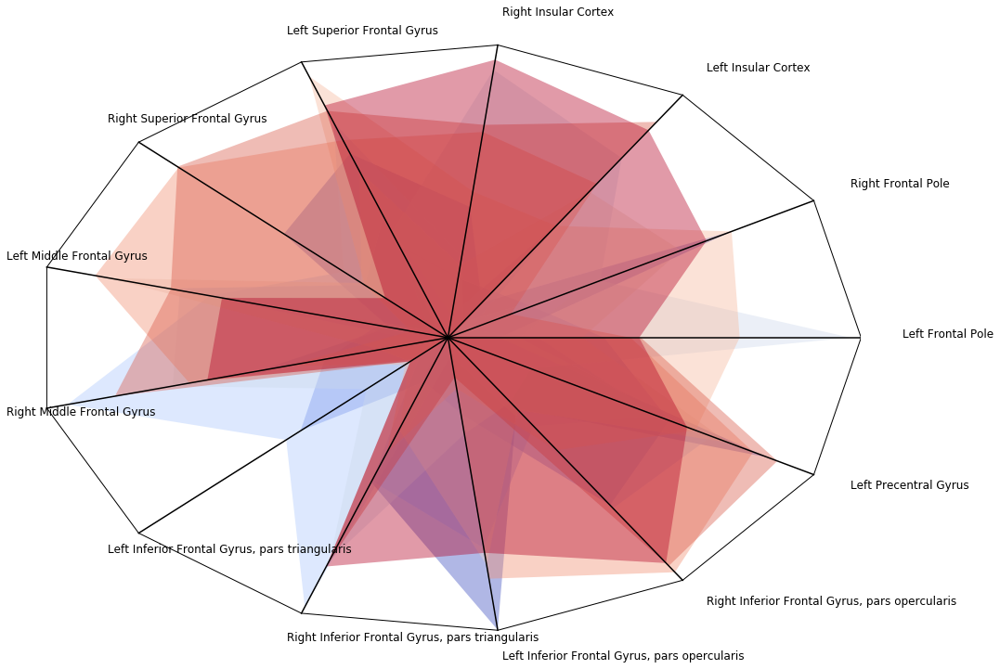

In [43]:
import numpy as np

import matplotlib.pyplot as plt
import matplotlib
from matplotlib.patches import Polygon
from sklearn.preprocessing import StandardScaler
from numpy.linalg import norm
from matplotlib.collections import PatchCollection


figsize = (15, 10)
fig, ax = plt.subplots(figsize=figsize)
patches = []
num_polygons = 10
num_roi = 13
rotation_angle =  2 * np.pi / num_roi # in radians
rotation_matrix = np.array([
    [np.cos(rotation_angle), -np.sin(rotation_angle)], 
    [np.sin(rotation_angle), np.cos(rotation_angle)]
    ])
assert 2*np.pi % rotation_angle < 1e-15
base = [np.array([1, 0])]
i = 1
while rotation_angle * i < 2*np.pi:
    base.append(np.round(np.dot(rotation_matrix, base[-1]), 5))
    i += 1
#base = [(1, 0), (1, 1), (0, 1), (-1, 1), (-1, 0), (-1, -1), (0, -1), (1, -1)]
rois = ['Left Frontal Pole','Right Frontal Pole','Left Insular Cortex','Right Insular Cortex','Left Superior Frontal Gyrus','Right Superior Frontal Gyrus','Left Middle Frontal Gyrus','Right Middle Frontal Gyrus','Left Inferior Frontal Gyrus, pars triangularis','Right Inferior Frontal Gyrus, pars triangularis','Left Inferior Frontal Gyrus, pars opercularis','Right Inferior Frontal Gyrus, pars opercularis','Left Precentral Gyrus','Right Precentral Gyrus','Left Temporal Pole','Right Temporal Pole','Left Superior Temporal Gyrus, anterior division','Right Superior Temporal Gyrus, anterior division','Left Superior Temporal Gyrus, posterior division','Right Superior Temporal Gyrus, posterior division','Left Middle Temporal Gyrus, anterior division','Right Middle Temporal Gyrus, anterior division','Left Middle Temporal Gyrus, posterior division','Right Middle Temporal Gyrus, posterior division','Left Middle Temporal Gyrus, temporooccipital part','Right Middle Temporal Gyrus, temporooccipital part','Left Inferior Temporal Gyrus, anterior division','Right Inferior Temporal Gyrus, anterior division','Left Inferior Temporal Gyrus, posterior division','Right Inferior Temporal Gyrus, posterior division','Left Inferior Temporal Gyrus, temporooccipital part','Right Inferior Temporal Gyrus, temporooccipital part','Left Postcentral Gyrus','Right Postcentral Gyrus','Left Superior Parietal Lobule','Right Superior Parietal Lobule','Left Supramarginal Gyrus, anterior division','Right Supramarginal Gyrus, anterior division','Left Supramarginal Gyrus, posterior division','Right Supramarginal Gyrus, posterior division','Left Angular Gyrus','Right Angular Gyrus','Left Lateral Occipital Cortex, superior division','Right Lateral Occipital Cortex, superior division','Left Lateral Occipital Cortex, inferior division','Right Lateral Occipital Cortex, inferior division','Left Intracalcarine Cortex','Right Intracalcarine Cortex','Left Frontal Medial Cortex','Right Frontal Medial Cortex','Left Juxtapositional Lobule Cortex (formerly Supplementary Motor Cortex)','Right Juxtapositional Lobule Cortex (formerly Supplementary Motor Cortex)','Left Subcallosal Cortex','Right Subcallosal Cortex','Left Paracingulate Gyrus','Right Paracingulate Gyrus','Left Cingulate Gyrus, anterior division','Right Cingulate Gyrus, anterior division','Left Cingulate Gyrus, posterior division','Right Cingulate Gyrus, posterior division','Left Precuneous Cortex','Right Precuneous Cortex','Left Cuneal Cortex','Right Cuneal Cortex','Left Frontal Orbital Cortex','Right Frontal Orbital Cortex','Left Parahippocampal Gyrus, anterior division','Right Parahippocampal Gyrus, anterior division','Left Parahippocampal Gyrus, posterior division','Right Parahippocampal Gyrus, posterior division','Left Lingual Gyrus','Right Lingual Gyrus','Left Temporal Fusiform Cortex, anterior division','Right Temporal Fusiform Cortex, anterior division','Left Temporal Fusiform Cortex, posterior division','Right Temporal Fusiform Cortex, posterior division','Left Temporal Occipital Fusiform Cortex','Right Temporal Occipital Fusiform Cortex','Left Occipital Fusiform Gyrus','Right Occipital Fusiform Gyrus','Left Frontal Operculum Cortex','Right Frontal Operculum Cortex','Left Central Opercular Cortex','Right Central Opercular Cortex','Left Parietal Operculum Cortex','Right Parietal Operculum Cortex','Left Planum Polare','Right Planum Polare',"Left Heschl's Gyrus (includes H1 and H2)","Right Heschl's Gyrus (includes H1 and H2)",'Left Planum Temporale','Right Planum Temporale','Left Supracalcarine Cortex','Right Supracalcarine Cortex','Left Occipital Pole','Right Occipital Pole']
num_sides = len(base)
x_lim = (-1, 1)
y_lim = (-1, 1)

base = np.array(base)
base = base / norm(base, axis=1).reshape(-1, 1)

for i in range(num_polygons):
    polygon = Polygon(base * np.random.rand(num_sides)[:, np.newaxis] , True)
    patches.append(polygon)


p = PatchCollection(patches, cmap=matplotlib.cm.coolwarm, alpha=0.4)

colors = [100 * i for i in range(len(patches))]
p.set_array(np.array(colors))

ax.add_collection(p)
# Polygonal Frame
ax.add_collection(PatchCollection([Polygon(base, fill=False)], alpha=1, edgecolor='black', facecolor='none'))
# Base axis
for i, vector in enumerate(range(base.shape[0])):
    plt.plot(*zip((0, 0), base[vector, :]), color='black')
    plt.text(*base[vector, :]*1.1, rois[i], fontsize=12)
plt.plot
ax.spines['left'].set_color('none')
ax.spines['bottom'].set_color('none')

# Eliminate upper and right axes
ax.spines['right'].set_color('none')
ax.spines['top'].set_color('none')

# Show ticks in the left and lower axes only
plt.axis('off')

plt.ylim(y_lim)
plt.xlim(x_lim)
plt.tight_layout()

plt.show()



In [85]:
for i in labels:
    if i not in x:
        print(i)